# NGC 6121 Analysis

In [2]:
import matplotlib.pyplot as mp
import read_dao
import sys
import coordinates
import numpy as np
from matplotlib.ticker import ScalarFormatter
from astropy.wcs import WCS
from astropy.io import fits
import optical
import lightcurves
import calibration
import analysis_routines
import variables
import glob
import re
from astropy.stats import sigma_clip
%matplotlib inline 

In [3]:
target = 'NGC6121'
folder = '/Volumes/Annie/CRRP/'+target+'/'
optical_dir = '/Volumes/Annie/CRRP/OpticalCatalogs/'
cluster_ra = '16:23:35.22'
cluster_dec = '-26:31:32.7'

## Cluster Snapshot

In [3]:
dtype1 = np.dtype([('img', 'S30'), ('ra', float), ('dec', float)])
ch1_data = np.loadtxt(folder+'I1_centers.txt', dtype=dtype1, usecols=(0,1,2))
ch2_data = np.loadtxt(folder+'I2_centers.txt', dtype=dtype1, usecols=(0,1,2))

#### Plot AOR footprint

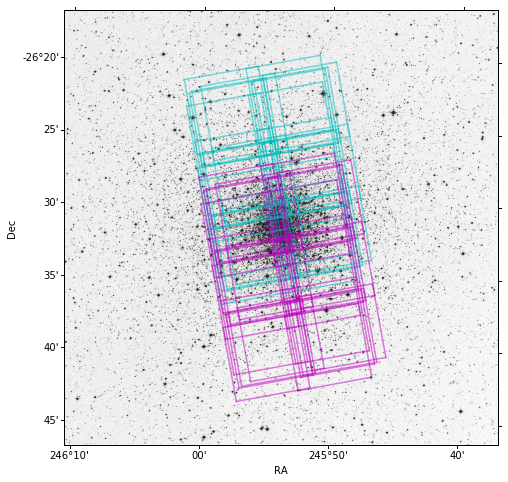

In [4]:
from matplotlib.colors import LogNorm
hdu = fits.open(folder+'dss-'+target+'.fits')[0]
wcs = WCS(hdu.header)
fig = mp.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection=wcs)
mp.imshow(hdu.data, origin='lower', cmap='gray_r')#, norm=LogNorm())

for ind, fits_file in enumerate(ch1_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [3.6] AOR footprint
  #  mp.plot(ch1_data['ra'][ind], ch1_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
for ind, fits_file in enumerate(ch2_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [4.5] AOR footprint
  #  mp.plot(ch2_data['ra'][ind], ch2_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
ax.set_xlabel('RA')
ax.set_ylabel('Dec')

x_formatter = ScalarFormatter(useOffset=False)
mp.gca().xaxis.set_major_formatter(x_formatter)
mp.show()

#### Map of source catalog with field boundaries shown

Reading optical catalog for NGC6121...
Finished reading optical catalog.


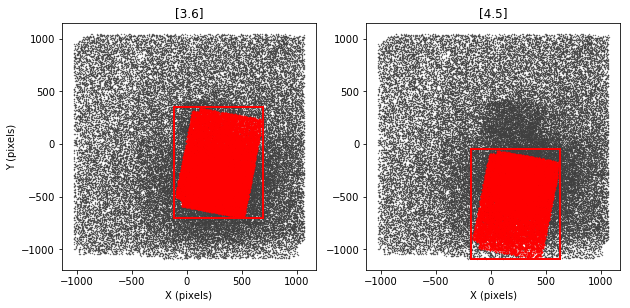

In [3]:
fig = mp.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)

# read optical catalog and add to plots
ids, xcat, ycat, ra, dec = optical.read_optical_fnl(optical_dir, target)
ax1.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax2.plot(xcat, ycat, '.', color='0.25', markersize=0.75)

# read boundaries of IRAC data
dtype1 = np.dtype([('xmin', float), ('xmax', float), ('ymin', float), ('ymax', float)])
I1cuts = np.loadtxt(folder+'DeepMosaic/I1-deep-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I2cuts = np.loadtxt(folder+'DeepMosaic/I2-deep-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

ax1.plot([I1cuts['xmin'], I1cuts['xmax']], [I1cuts['ymin'], I1cuts['ymin']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmin'], I1cuts['xmax']], [I1cuts['ymax'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmin'], I1cuts['xmin']], [I1cuts['ymin'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmax'], I1cuts['xmax']], [I1cuts['ymin'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.set_xlabel('X (pixels)')
ax1.set_ylabel('Y (pixels)')
ax1.set_title('[3.6]')
ax2.plot([I2cuts['xmin'], I2cuts['xmax']], [I2cuts['ymin'], I2cuts['ymin']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmin'], I2cuts['xmax']], [I2cuts['ymax'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmin'], I2cuts['xmin']], [I2cuts['ymin'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmax'], I2cuts['xmax']], [I2cuts['ymin'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.set_xlabel('X (pixels)')
ax2.set_title('[4.5]')


# Add transformed catalogs
I1ids, I1x, I1y, I1mag, I1err = read_dao.read_alf(folder+'DeepMosaic/'+target+'_I1_deep_dn.alf')
I2ids, I2x, I2y, I2mag, I2err = read_dao.read_alf(folder+'DeepMosaic/'+target+'_I2_deep_dn.alf')

filesI1, x_offI1, y_offI1, transformI1, dofI1 = read_dao.read_mch(folder+'DeepMosaic/op-I1-deep.mch')
filesI2, x_offI2, y_offI2, transformI2, dofI2 = read_dao.read_mch(folder+'DeepMosaic/op-I2-deep.mch')

xI1 = float(x_offI1[1])+float(transformI1[1][0])*I1x+float(transformI1[1][1])*I1y
yI1 = float(y_offI1[1])+float(transformI1[1][2])*I1x+float(transformI1[1][3])*I1y
xI2 = float(x_offI2[1])+float(transformI2[1][0])*I2x+float(transformI2[1][1])*I2y
yI2 = float(y_offI2[1])+float(transformI2[1][2])*I2x+float(transformI2[1][3])*I2y

ax1.plot(xI1, yI1, '.', markersize=1.8, color='r')
ax2.plot(xI2, yI2, '.', markersize=1.8, color='r')


mp.show()

# Calibration

In [3]:
calibration.find_lst_stars(target, 'I1', data_dir=folder)
calibration.find_lst_stars(target, 'I2', data_dir=folder)

In [4]:
calibration.do_ap_phot(target, 'I1', 30, data_dir=folder, dao_dir='/usr/local/phot/')
calibration.do_ap_phot(target, 'I2', 30, data_dir=folder, dao_dir='/usr/local/phot/')

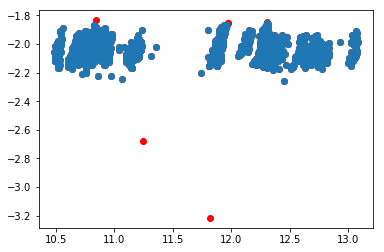

-2.05924311377 0.083133732879
-2.04633512867 0.0683944027791
There are 26 psf stars.


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:72: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 340253 but corresponding boolean dimension is 1677


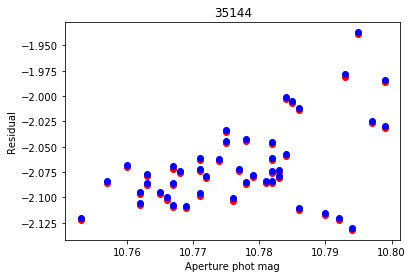

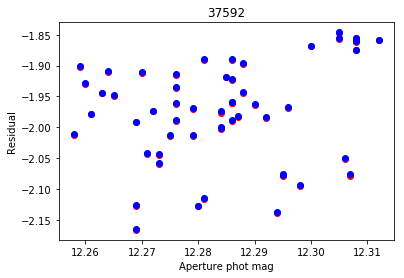

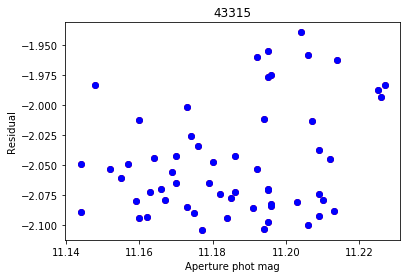

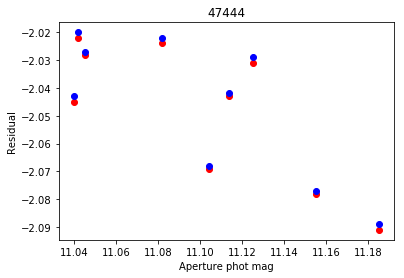

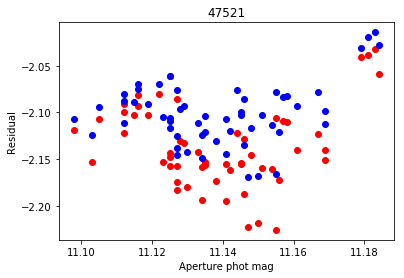

...

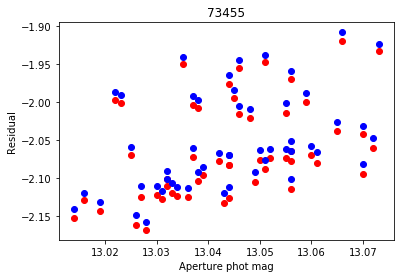

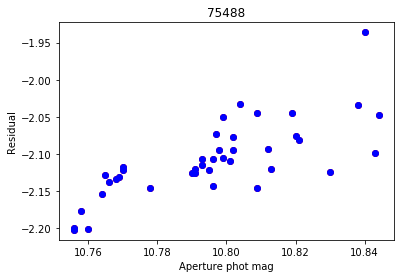

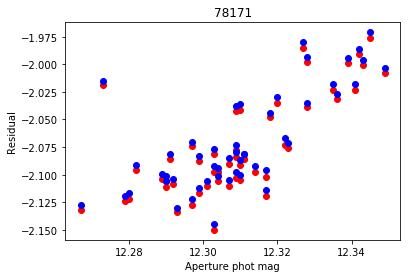

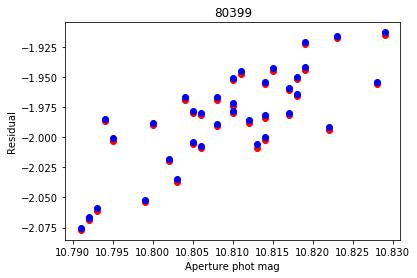

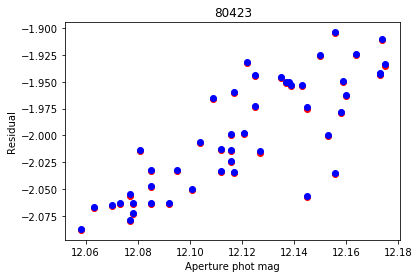

/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/numpy/core/numeric.py:531: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


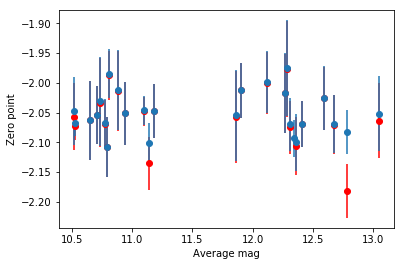

-2.05590281173 0.0444560813452
-2.05009484802 0.0343507116087


In [3]:
channel = 'I1'
I1zmag = 17.13
I2zmag = 16.66
fits_list = glob.glob(folder+'data/'+channel+'*[0-9].fits')

diff1 = np.array([], dtype=float)
diff2 = np.array([], dtype=float)
names = np.array([], dtype=int)
ap_mags = np.array([], dtype=float)
obs_num = np.array([], dtype=float)
err = np.array([], dtype=float)

for img in fits_list: 
    coo_file = re.sub('.fits', '.coo', img)
    ap_file = re.sub('.fits', '.ap', img)
    
    ids, ap_phot, ap_err = read_dao.read_ap(ap_file)
    ap_phot = ap_phot - 25.0 + I1zmag
    data = read_dao.read_coo_new(coo_file)

    diff1 = np.append(diff1, ap_phot - data['mag1'])
    diff2 = np.append(diff2, ap_phot - data['mag2'])
    err = np.append(err, np.sqrt(ap_err**2 + data['err']**2))
    obs_num = np.append(obs_num, np.arange(len(diff1)))
    ap_mags = np.append(ap_mags, ap_phot)
    names = np.append(names, ids)

# delete residuals where the aperture photometry was missing
ap_mags = np.delete(ap_mags, np.argwhere(diff1 > 50))
obs_num = np.delete(obs_num, np.argwhere(diff1 > 50))
diff2 = np.delete(diff2, np.argwhere(diff1 > 50))
err = np.delete(err, np.argwhere(diff1 > 50))
names = np.delete(names, np.argwhere(diff1 > 50))
diff1 = np.delete(diff1, np.argwhere(diff1 > 50))

# delete saturated stars
obs_num = np.delete(obs_num, np.argwhere(ap_mags < 10))
diff2 = np.delete(diff2, np.argwhere(ap_mags < 10))
err = np.delete(err, np.argwhere(ap_mags < 10))
names = np.delete(names, np.argwhere(ap_mags < 10))
diff1 = np.delete(diff1, np.argwhere(ap_mags < 10))
ap_mags = np.delete(ap_mags, np.argwhere(ap_mags < 10))

# delete faint stars
obs_num = np.delete(obs_num, np.argwhere(ap_mags > 14))
diff2 = np.delete(diff2, np.argwhere(ap_mags > 14))
err = np.delete(err, np.argwhere(ap_mags > 14))
names = np.delete(names, np.argwhere(ap_mags > 14))
diff1 = np.delete(diff1, np.argwhere(ap_mags > 14))
ap_mags = np.delete(ap_mags, np.argwhere(ap_mags > 14))

# sigma clip full sample
filtered_diff1 = sigma_clip(diff1, sigma=3, iters=5)
filtered_diff2 = sigma_clip(diff2, sigma=3, iters=5)


mp.plot(ap_mags, diff2, 'ro')
mp.plot(ap_mags, filtered_diff2, 'o')
mp.show()
print np.mean(filtered_diff1), np.std(filtered_diff1)
print np.mean(filtered_diff2), np.std(filtered_diff2)

psf_stars = np.unique(names)
print 'There are {} psf stars.'.format(len(psf_stars))

avg_zp1 = np.zeros(len(psf_stars))
avg_zp2 = np.zeros(len(psf_stars))
std_zp1 = np.zeros(len(psf_stars))
std_zp2 = np.zeros(len(psf_stars))
avg_mag = np.zeros(len(psf_stars))
for ind, star in enumerate(psf_stars):
    x = obs_num[names == star]
    y3 = ap_mags[names == star]
    y1 = diff1[names == star]
    y2 = diff2[names == star]
    filtered_y3 = sigma_clip(y3, sigma=2, iters=5)
    mp.plot(filtered_y3, y1, 'ro')
    mp.plot(filtered_y3, y2, 'bo')
    mp.xlabel('Aperture phot mag')
    mp.ylabel('Residual')
    mp.title(star)
    mp.show()
    avg_zp2[ind] = np.mean(y2[y3 == filtered_y3])
    avg_zp1[ind] = np.mean(y1[y3 == filtered_y3])
    std_zp1[ind] = np.std(y1[y3 == filtered_y3])
    std_zp2[ind] = np.std(y2[y3 == filtered_y3])
    avg_mag[ind] = np.mean(y3[y3 == filtered_y3])


filtered_avzp1 = sigma_clip(avg_zp1, sigma=3, iters=5)  
filtered_avzp2 = sigma_clip(avg_zp2, sigma=3, iters=5)
mp.errorbar(avg_mag, filtered_avzp1, yerr=std_zp1, fmt='ro')
mp.errorbar(avg_mag, filtered_avzp2, yerr=std_zp2, fmt='o')
mp.xlabel('Average mag')
mp.ylabel('Zero point')
mp.show()

print np.mean(filtered_avzp1), np.std(filtered_avzp1)
print np.mean(filtered_avzp2), np.std(filtered_avzp2)

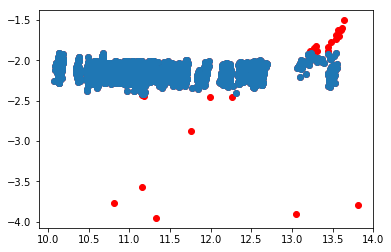

-2.16547866483 0.0883443241343
-2.16083579088 0.0882220828591
There are 51 psf stars.


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:72: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 613439 but corresponding boolean dimension is 3013


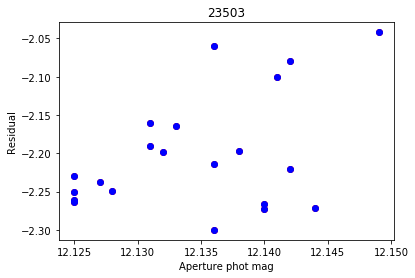

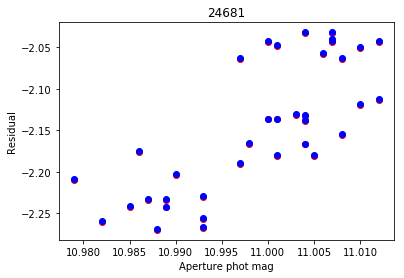

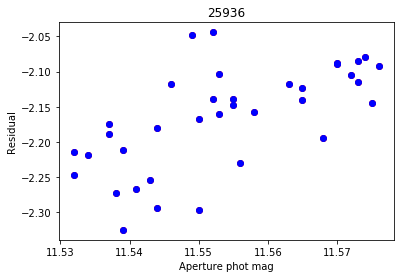

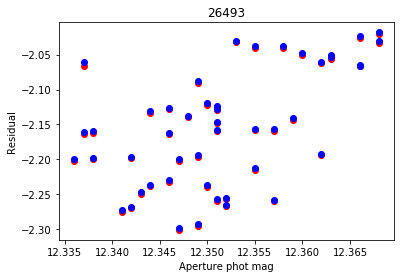

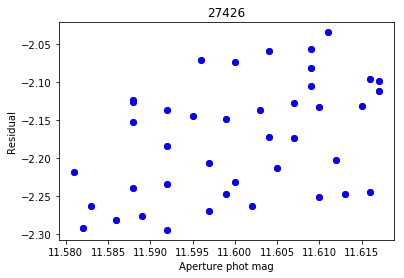

...

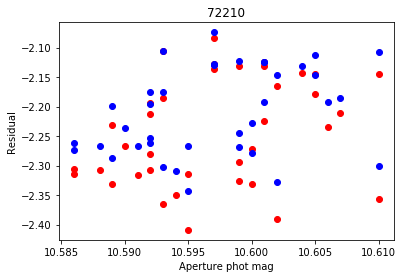

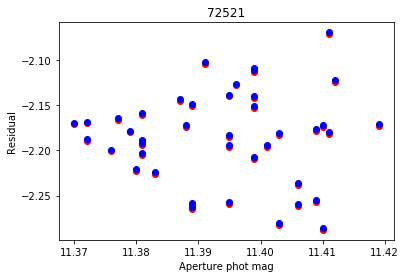

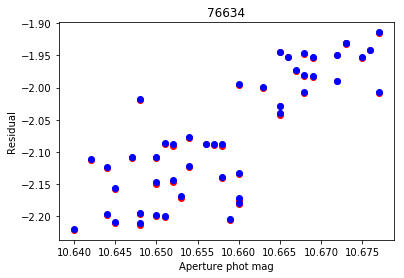

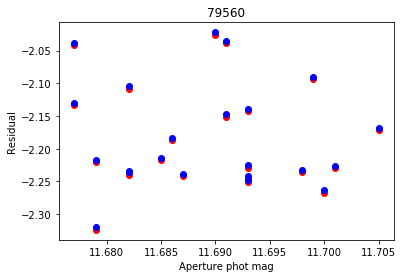

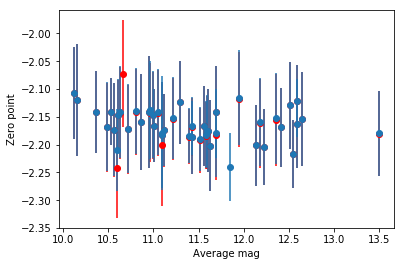

-2.16172906704 0.0307166154281
-2.16333602105 0.0280139759456


In [4]:
channel = 'I2'
I1zmag = 17.13
I2zmag = 16.66
fits_list = glob.glob(folder+'data/'+channel+'*[0-9].fits')

diff1 = np.array([], dtype=float)
diff2 = np.array([], dtype=float)
names = np.array([], dtype=int)
ap_mags = np.array([], dtype=float)
obs_num = np.array([], dtype=float)
err = np.array([], dtype=float)

for img in fits_list: 
    coo_file = re.sub('.fits', '.coo', img)
    ap_file = re.sub('.fits', '.ap', img)
    
    ids, ap_phot, ap_err = read_dao.read_ap(ap_file)
    ap_phot = ap_phot - 25.0 + I2zmag
    data = read_dao.read_coo_new(coo_file)

    diff1 = np.append(diff1, ap_phot - data['mag1'])
    diff2 = np.append(diff2, ap_phot - data['mag2'])
    err = np.append(err, np.sqrt(ap_err**2 + data['err']**2))
    obs_num = np.append(obs_num, np.arange(len(diff1)))
    ap_mags = np.append(ap_mags, ap_phot)
    names = np.append(names, ids)

# delete residuals where the aperture photometry was missing
ap_mags = np.delete(ap_mags, np.argwhere(diff1 > 50))
obs_num = np.delete(obs_num, np.argwhere(diff1 > 50))
diff2 = np.delete(diff2, np.argwhere(diff1 > 50))
err = np.delete(err, np.argwhere(diff1 > 50))
names = np.delete(names, np.argwhere(diff1 > 50))
diff1 = np.delete(diff1, np.argwhere(diff1 > 50))

# delete saturated stars
obs_num = np.delete(obs_num, np.argwhere(ap_mags < 10))
diff2 = np.delete(diff2, np.argwhere(ap_mags < 10))
err = np.delete(err, np.argwhere(ap_mags < 10))
names = np.delete(names, np.argwhere(ap_mags < 10))
diff1 = np.delete(diff1, np.argwhere(ap_mags < 10))
ap_mags = np.delete(ap_mags, np.argwhere(ap_mags < 10))

# delete faint stars
obs_num = np.delete(obs_num, np.argwhere(ap_mags > 14))
diff2 = np.delete(diff2, np.argwhere(ap_mags > 14))
err = np.delete(err, np.argwhere(ap_mags > 14))
names = np.delete(names, np.argwhere(ap_mags > 14))
diff1 = np.delete(diff1, np.argwhere(ap_mags > 14))
ap_mags = np.delete(ap_mags, np.argwhere(ap_mags > 14))

# sigma clip full sample
filtered_diff1 = sigma_clip(diff1, sigma=3, iters=5)
filtered_diff2 = sigma_clip(diff2, sigma=3, iters=5)


mp.plot(ap_mags, diff2, 'ro')
mp.plot(ap_mags, filtered_diff2, 'o')
mp.show()
print np.mean(filtered_diff1), np.std(filtered_diff1)
print np.mean(filtered_diff2), np.std(filtered_diff2)

psf_stars = np.unique(names)
print 'There are {} psf stars.'.format(len(psf_stars))

avg_zp1 = np.zeros(len(psf_stars))
avg_zp2 = np.zeros(len(psf_stars))
std_zp1 = np.zeros(len(psf_stars))
std_zp2 = np.zeros(len(psf_stars))
avg_mag = np.zeros(len(psf_stars))
for ind, star in enumerate(psf_stars):
    x = obs_num[names == star]
    y3 = ap_mags[names == star]
    y1 = diff1[names == star]
    y2 = diff2[names == star]
    filtered_y3 = sigma_clip(y3, sigma=2, iters=5)
    mp.plot(filtered_y3, y1, 'ro')
    mp.plot(filtered_y3, y2, 'bo')
    mp.xlabel('Aperture phot mag')
    mp.ylabel('Residual')
    mp.title(star)
    mp.show()
    avg_zp2[ind] = np.mean(y2[y3 == filtered_y3])
    avg_zp1[ind] = np.mean(y1[y3 == filtered_y3])
    std_zp1[ind] = np.std(y1[y3 == filtered_y3])
    std_zp2[ind] = np.std(y2[y3 == filtered_y3])
    avg_mag[ind] = np.mean(y3[y3 == filtered_y3])


filtered_avzp1 = sigma_clip(avg_zp1, sigma=3, iters=5)  
filtered_avzp2 = sigma_clip(avg_zp2, sigma=3, iters=5)
mp.errorbar(avg_mag, filtered_avzp1, yerr=std_zp1, fmt='ro')
mp.errorbar(avg_mag, filtered_avzp2, yerr=std_zp2, fmt='o')
mp.xlabel('Average mag')
mp.ylabel('Zero point')
mp.show()

print np.mean(filtered_avzp1), np.std(filtered_avzp1)
print np.mean(filtered_avzp2), np.std(filtered_avzp2)

In [3]:
calibration.apply_calibration(target, 'I1', -2.062, data_dir=folder)
calibration.apply_calibration(target, 'I2', -2.172, data_dir=folder)

## MIR catalog

In [4]:
center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
analysis_routines.merge_opt_deep_catalogs(target, optical_dir, folder, cluster_coord=[center_ra, center_dec])

Reading optical catalog for NGC6121...
Finished reading optical catalog.
Reading MIR catalog for NGC6121...


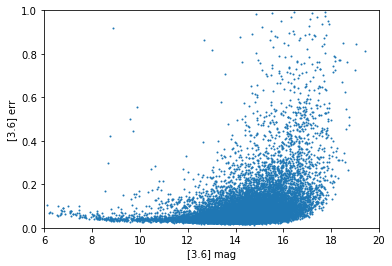

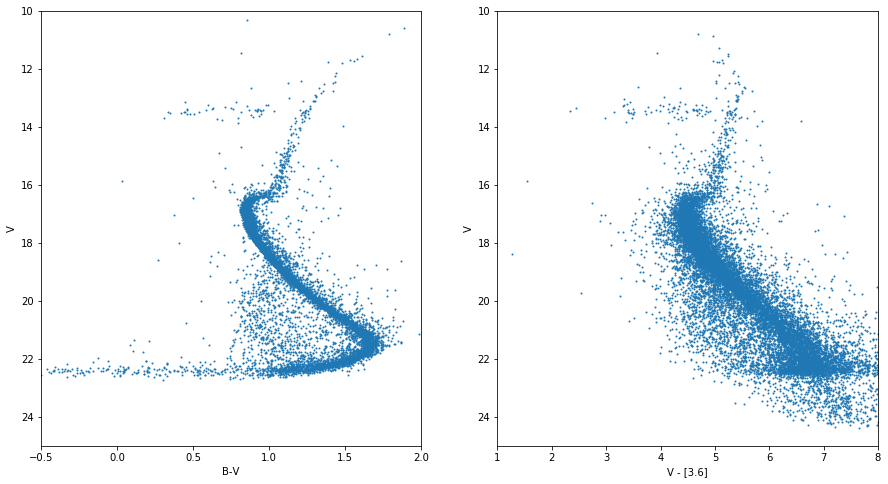

In [17]:
#center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
# change to read merged catalog
catalog_data = analysis_routines.read_merged_catalog(folder)

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
colorBV = catalog_data['B'][(dist > thres2) & (dist < thres)] - catalog_data['V'][(dist > thres2) & (dist < thres)]
Vmag = catalog_data['V'][(dist > thres2) & (dist < thres)]
colorVIR = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
magIR = catalog_data['3.6'][dist > thres2]
err = catalog_data['3.6er'][dist > thres2]

fig = mp.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(magIR, err, s=1, edgecolor=None)
ax1.set_ylim((0,1.0))
ax1.set_xlim((6,20))
ax1.set_xlabel('[3.6] mag')
ax1.set_ylabel('[3.6] err')

good_mag = mag[err < 0.2]
good_color = colorVIR[err < 0.2]

fig2 = mp.figure(figsize=(15,8))
ax2 = fig2.add_subplot(121)
ax2.scatter(colorBV, Vmag, s=1, edgecolor=None)
ax2.set_ylim((25,10))
ax2.set_xlim((-0.5,2))
ax2.set_xlabel('B-V')
ax2.set_ylabel('V')
ax3 = fig2.add_subplot(122)
ax3.scatter(good_color, good_mag, s=1, edgecolor=None)
ax3.set_ylim((25,10))
ax3.set_xlim((1,8))
ax3.set_xlabel('V - [3.6]')
ax3.set_ylabel('V')
mp.savefig(folder+target+'cmd.eps', format='eps')

# Variable stars

In [ ]:
# Find all stars identified as possible variables in optical catalog and list them in PeterIDs.txt

center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
optical.find_variables_fnl(optical_dir, target, center_ra, center_dec, data_dir=folder)

##  Generate MIR light curves matching optical ID numbers  

In [9]:
dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
data = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

lightcurves.make_lcv(['I1', 'I2'], data['star'], data['dao'], data_dir=folder)

## First check on RRL PL relation

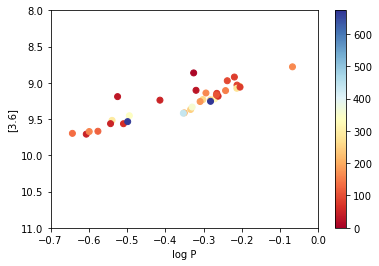

In [30]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))

dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
dao_ids = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

catalog_data = analysis_routines.read_merged_catalog(folder)

mag = np.zeros(len(data['id']))
dist = np.zeros(len(data['id']))

for ind, star in enumerate(data['id']):
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    if len(dao_id) == 0: continue
    m = catalog_data['3.6'][catalog_data['id'] == dao_id]  
    d = catalog_data['rad_dist'][catalog_data['id'] == dao_id]
    if m < 50: 
        mag[ind] = m
        dist[ind] = d
    if m > 50: 
        mag[ind] = np.nan
        dist[ind] = np.nan
cm = mp.cm.get_cmap('RdYlBu')    
mp.scatter(np.log10(data['new_period']), mag, c=dist, cmap=cm) 
mp.colorbar()
mp.ylim((11, 8))
mp.xlim((-0.7, 0))
mp.xlabel('log P')
mp.ylabel('[3.6]')
mp.savefig(target+'pl.eps', format='eps')

#### Phase MIR light curves

In [18]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))

for ind, lcv in enumerate(data['id']):
    lcv_file = folder+'lcvs/mir/'+lcv+'.lcv'
    try:
        lightcurves.phase_lcv(lcv_file, data['new_period'][ind], 0, bin=1)
    except:
        print lcv +' not found.'

V30 not found.
V31 not found.
V32 not found.
V33 not found.
V34 not found.
V35 not found.
V43 not found.
V64 not found.
V75 not found.
V76 not found.


#### Create figure with all bands phased together

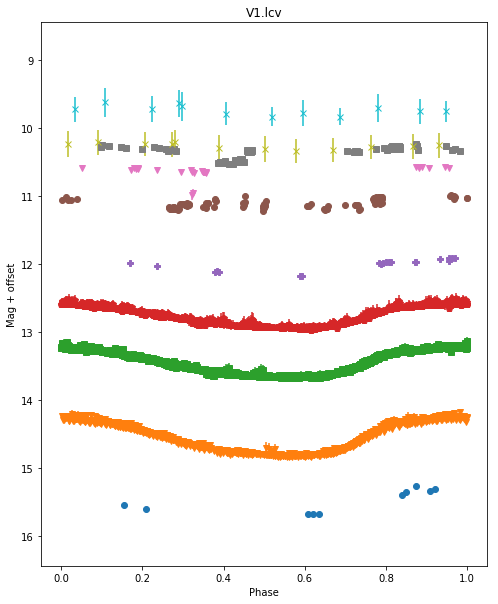

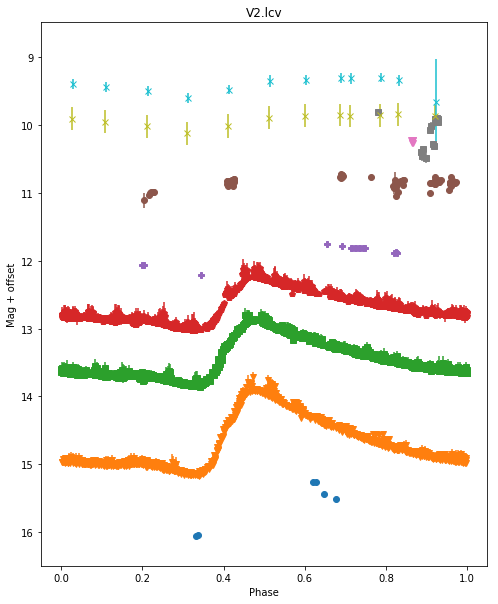

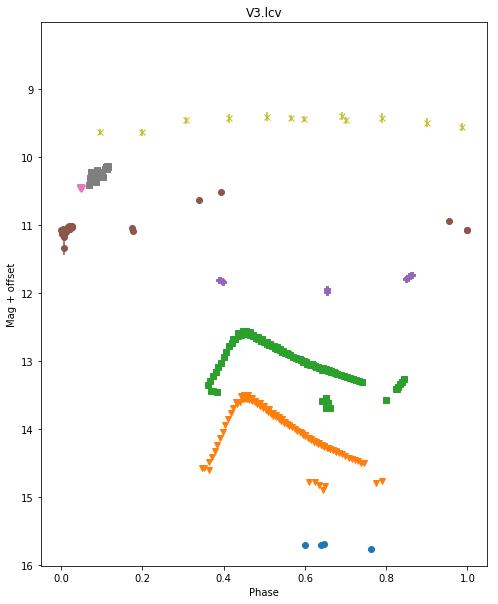

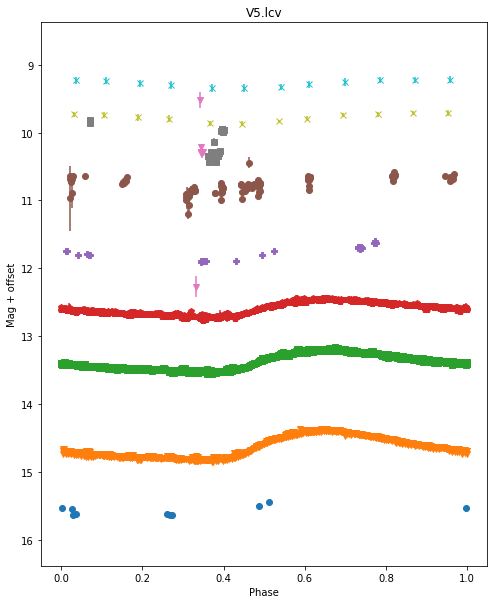

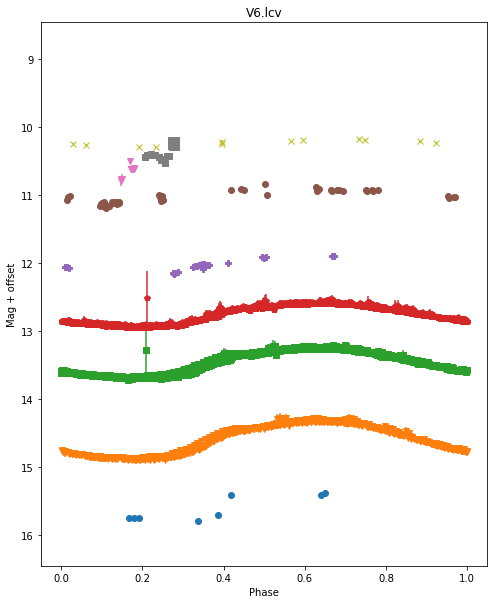

...

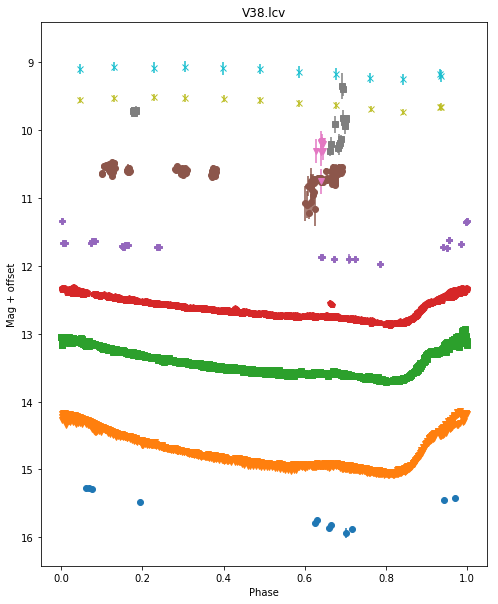

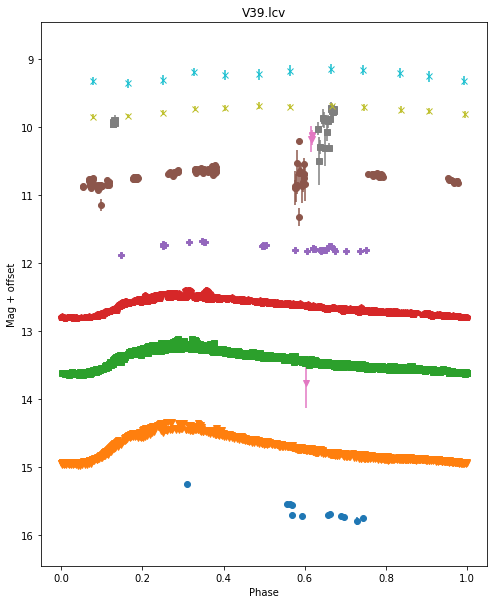

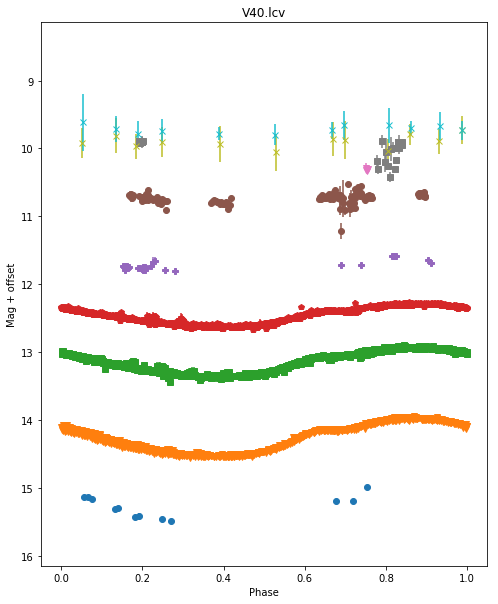

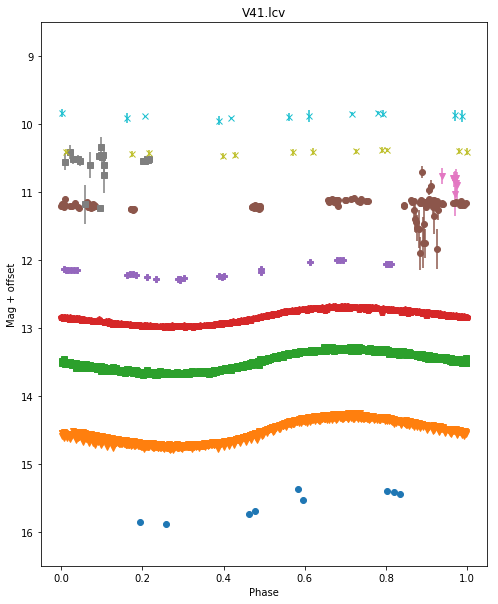

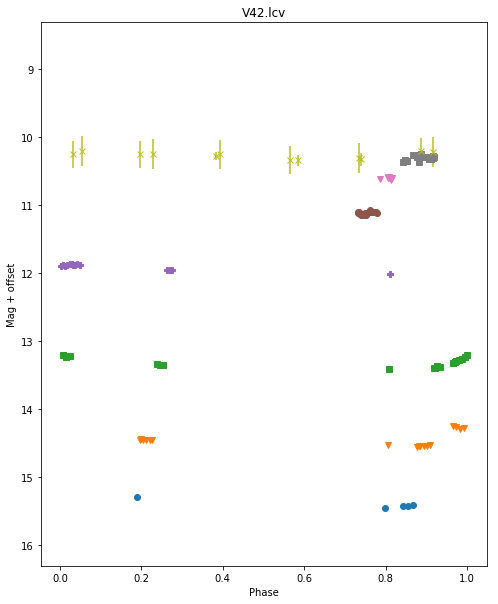

V43  not found.


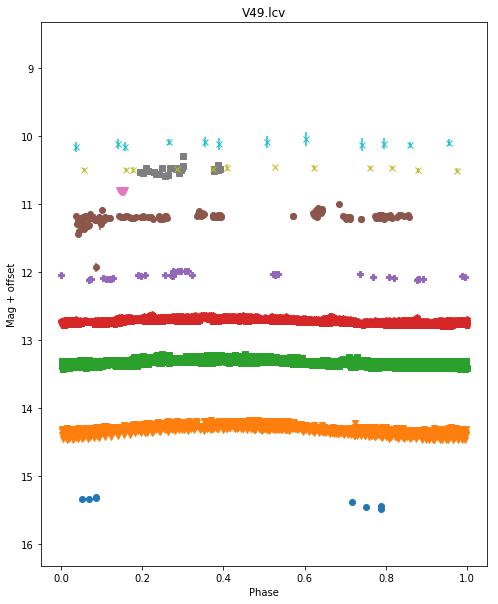

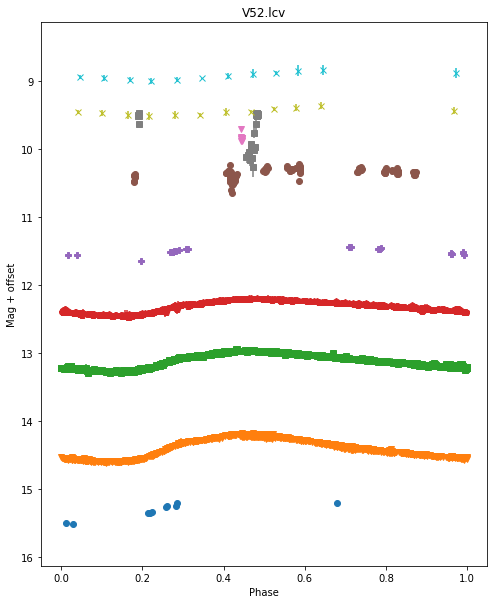

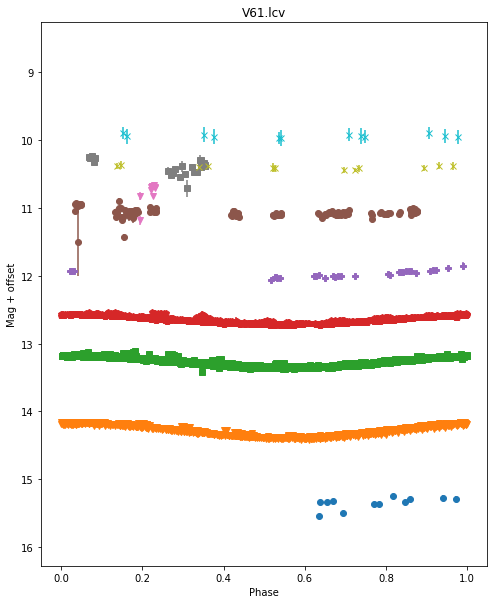

V64  not found.


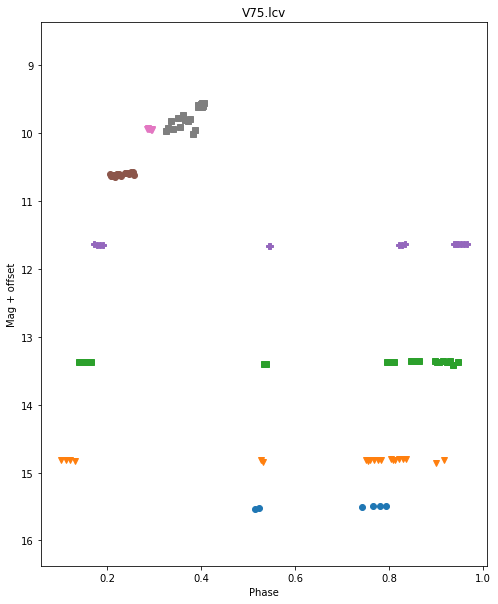

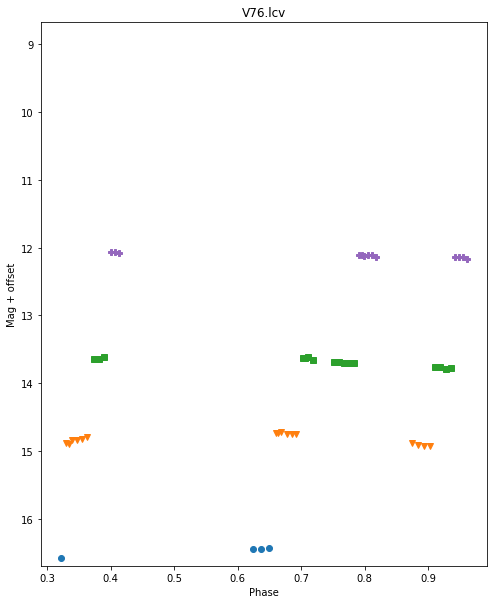

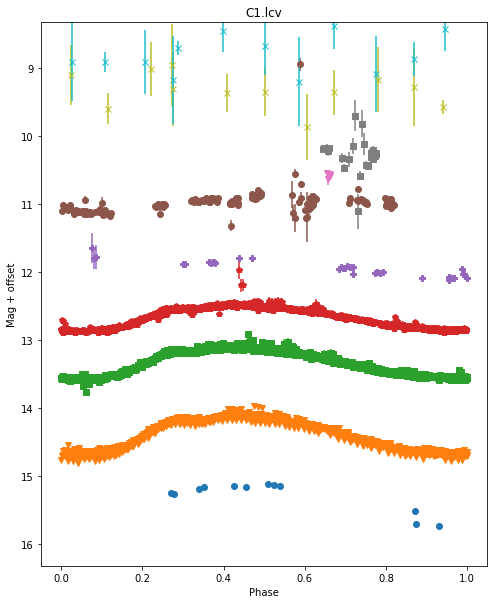

In [19]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
for ind, star in enumerate(data['id']):
    try:
        if np.isnan(data['new_period'][ind]):
            lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['cc_period'][ind], 0, bin_mir=1, data_dir=folder)
        else:
            lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['new_period'][ind], 0, bin_mir=1, data_dir=folder, old=1)
    except:
        print star, ' not found.'
        continue

## Fit light curves

V1
/Volumes/Annie/CRRP/NGC6121/lcvs/V1.phased


lightcurves.py:1028: RuntimeWarning: overflow encountered in exp
  weight = err_copy * np.exp(dist**2/sigma**2)


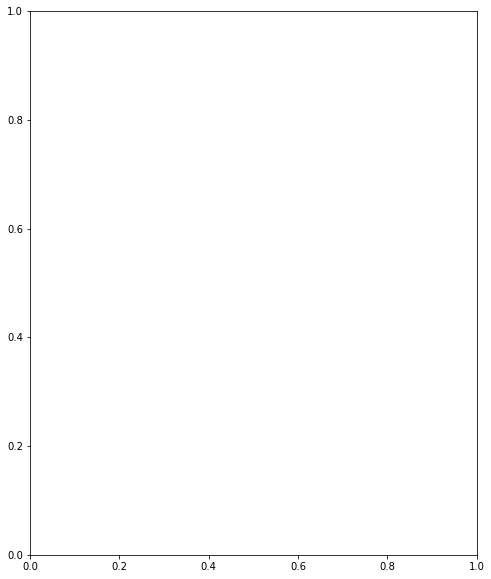

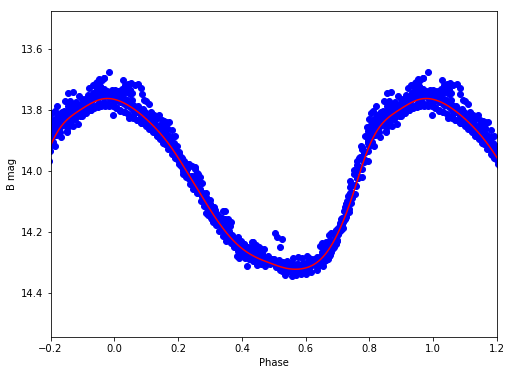

B 14.0284391037 0.55863065532


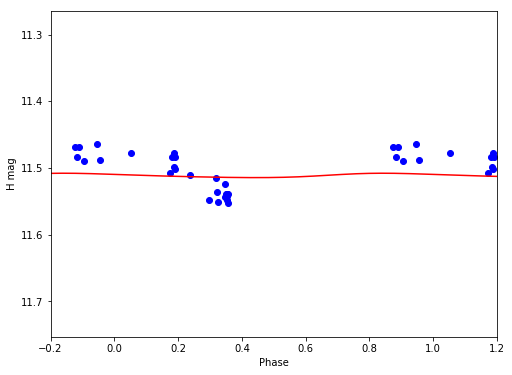

H 11.5113732208 0.00657636630375


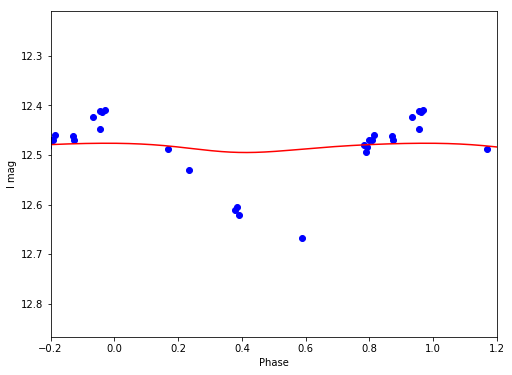

I 12.4841619072 0.0186436120851


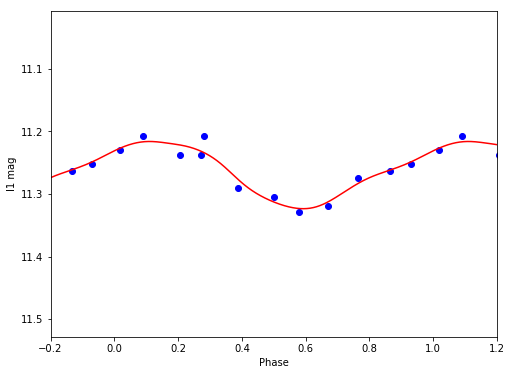

I1 11.2651338769 0.10736365076


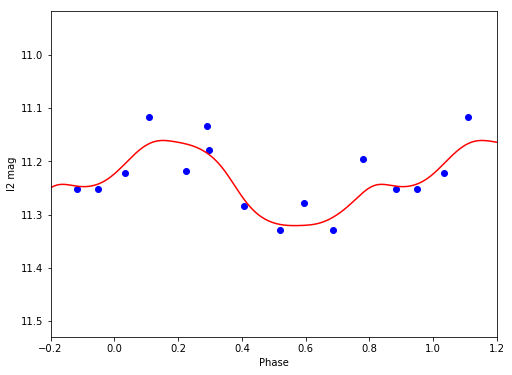

I2 11.2427878896 0.159768496944


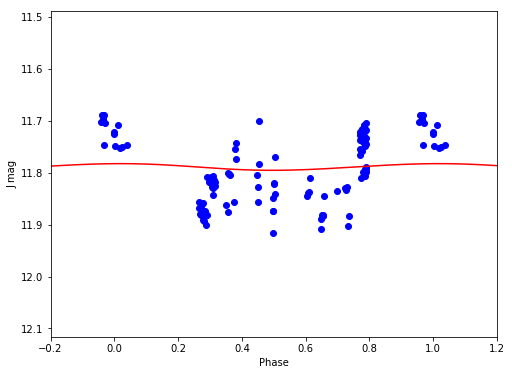

J 11.788953241 0.0128682061413


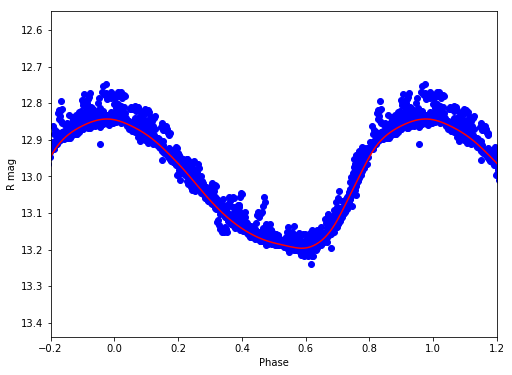

R 13.0128253857 0.353853920625


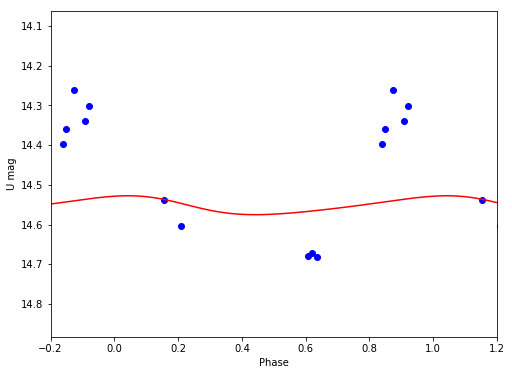

U 14.5526646745 0.0477101141126


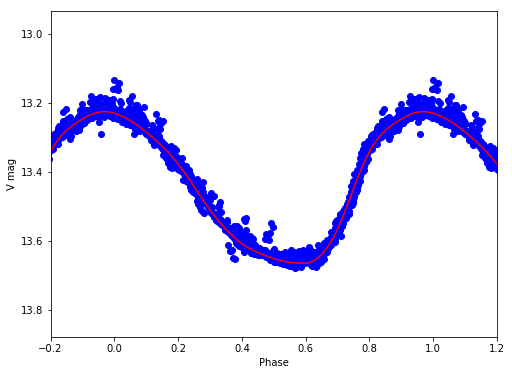

V 13.4353848614 0.43976334192
V2
/Volumes/Annie/CRRP/NGC6121/lcvs/V2.phased


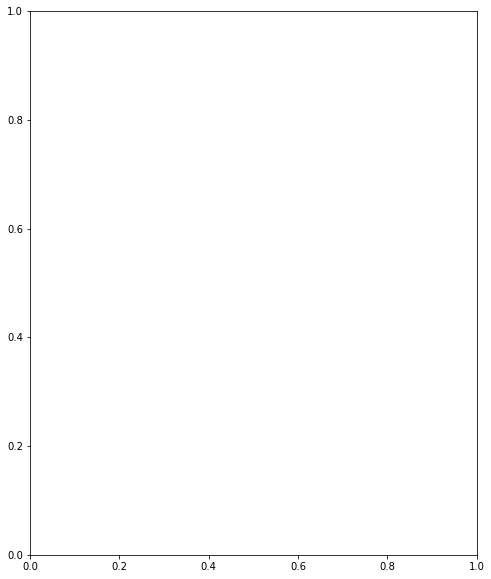

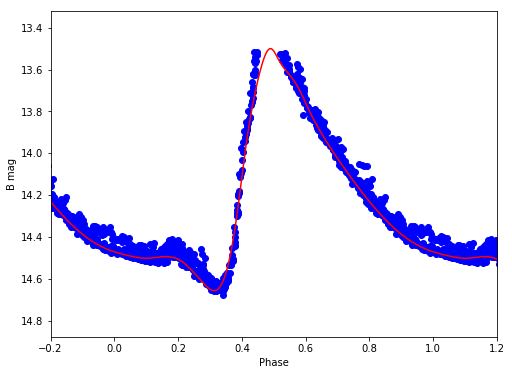

B 14.1578422284 1.15695131967


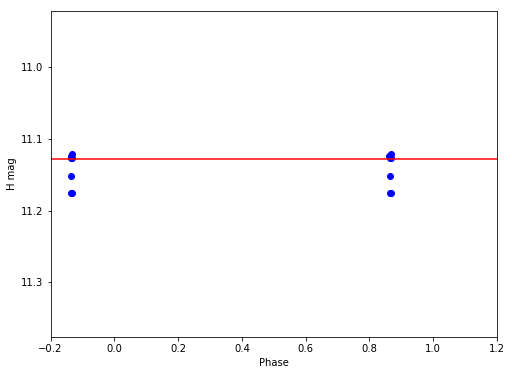

H 11.1279536837 1.9025584864e-05


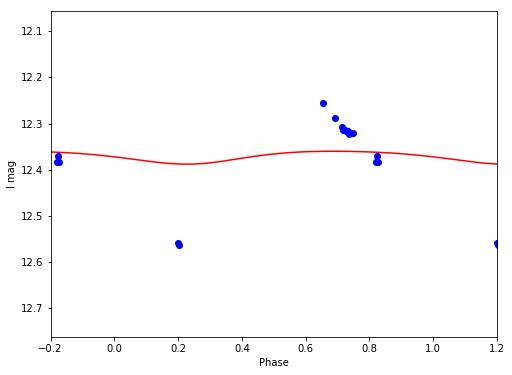

I 12.3716508697 0.0280510966479


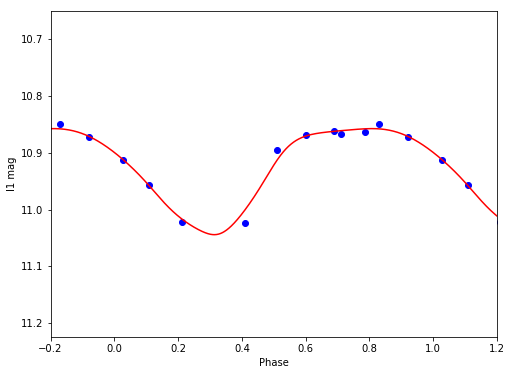

I1 10.9273121445 0.186645142937


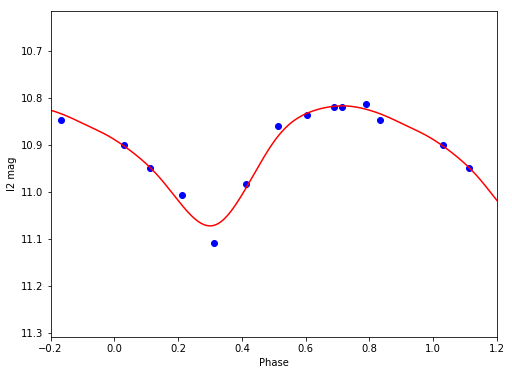

I2 10.9112478291 0.256105613157


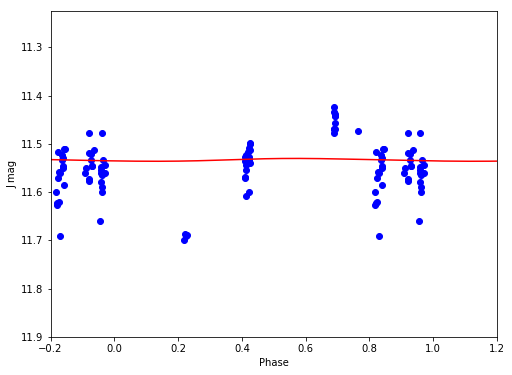

J 11.5333578433 0.00587569595723


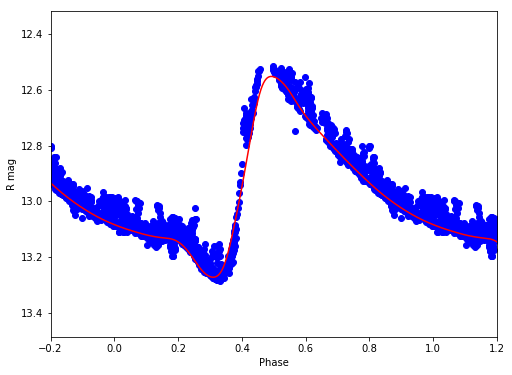

R 12.9375498125 0.719179668535


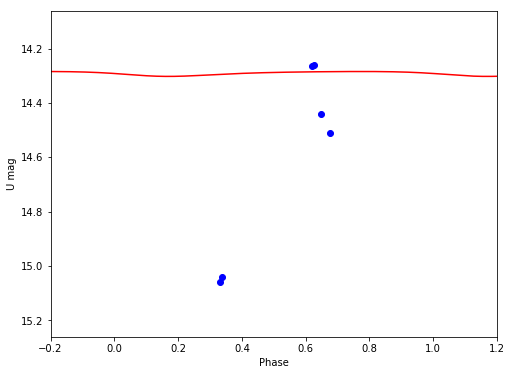

U 14.2905975461 0.018027589219


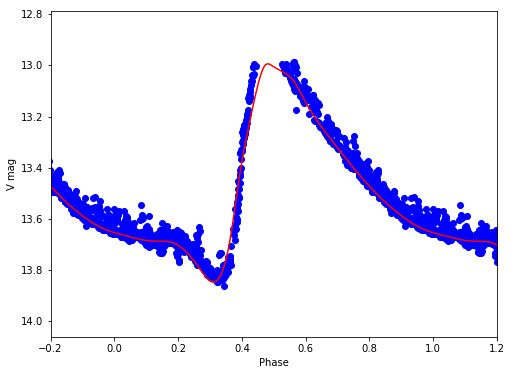

V 13.4479323408 0.852429611674
V3
/Volumes/Annie/CRRP/NGC6121/lcvs/V3.phased


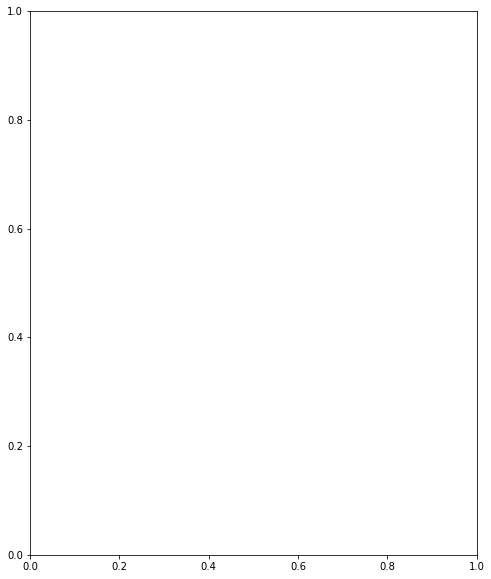

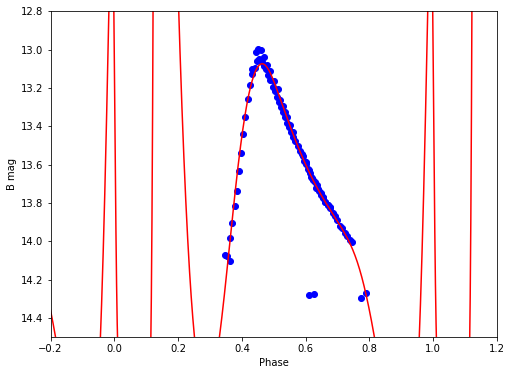

B 11.6242637394 7.87936675367


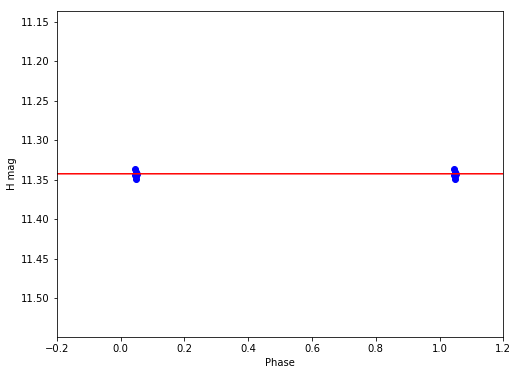

H 11.3425910479 9.61966406798e-06


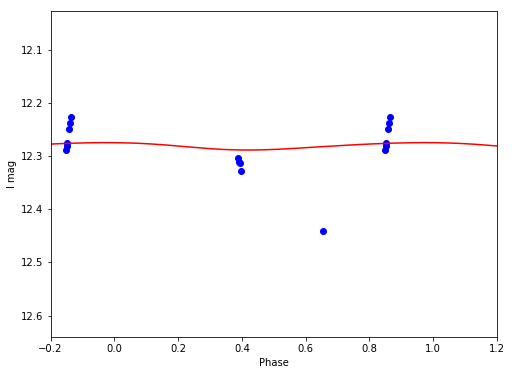

I 12.2809654348 0.0139430482672


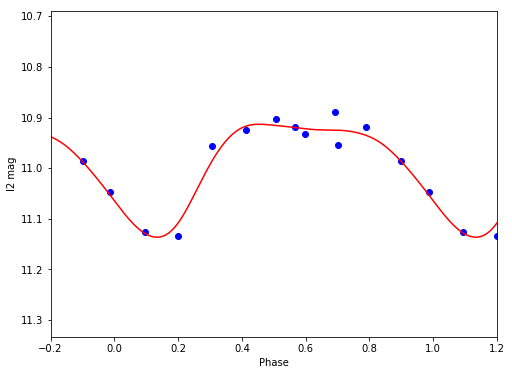

I2 10.9875780304 0.223008005377


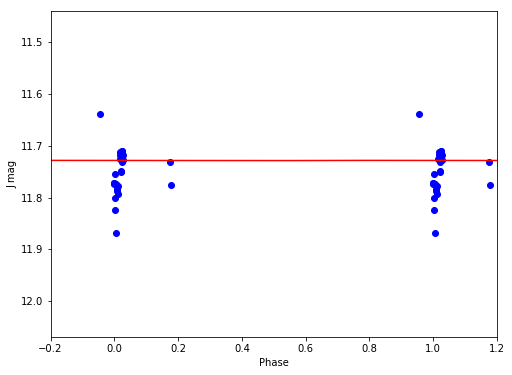

J 11.7284352917 0.000464573682185


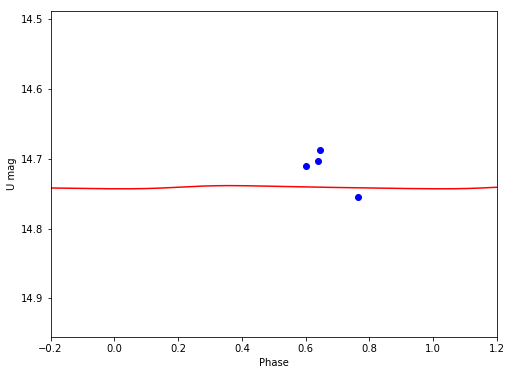

U 14.7409854418 0.00455686888114


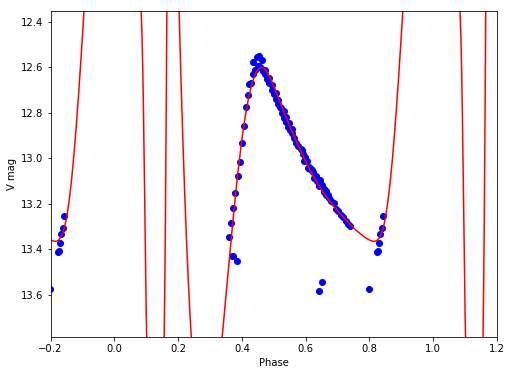

V 12.0857804548 4.91031263589
V5
/Volumes/Annie/CRRP/NGC6121/lcvs/V5.phased


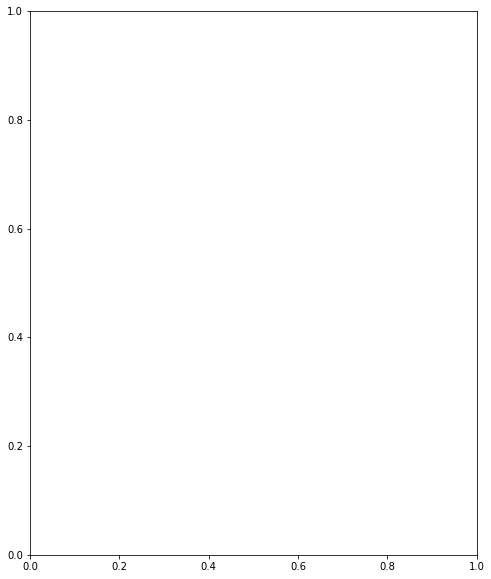

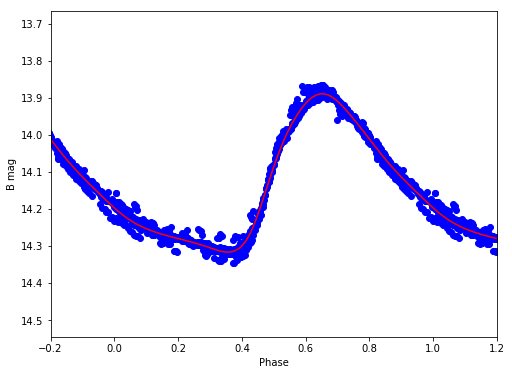

B 14.1267507828 0.426575909


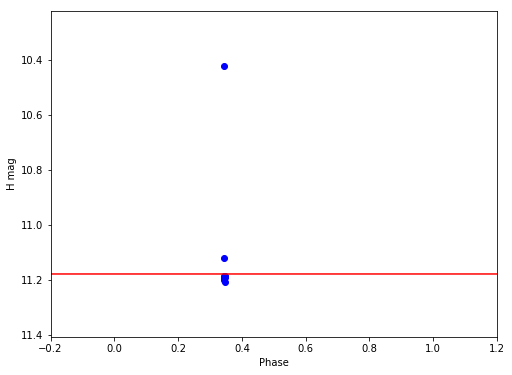

H 11.1783612678 6.49347557005e-05


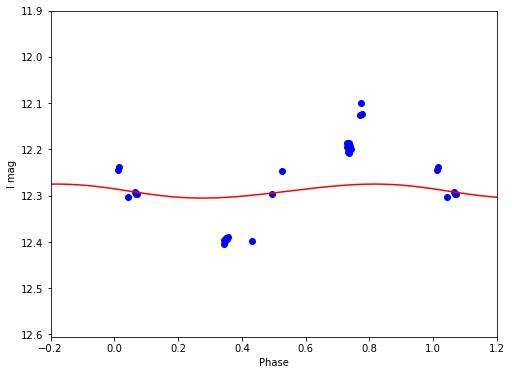

I 12.2899792178 0.0302650117376


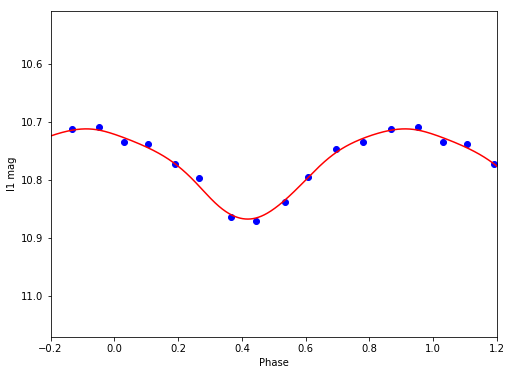

I1 10.7759643442 0.155406154616


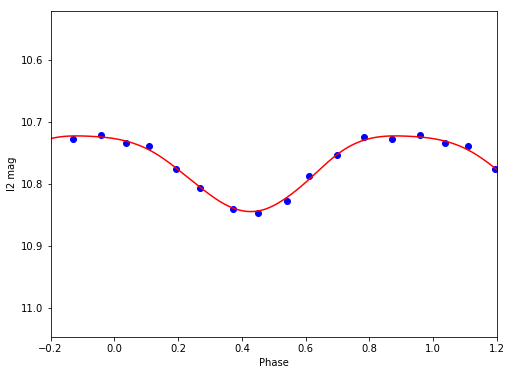

I2 10.7732081415 0.121816160594


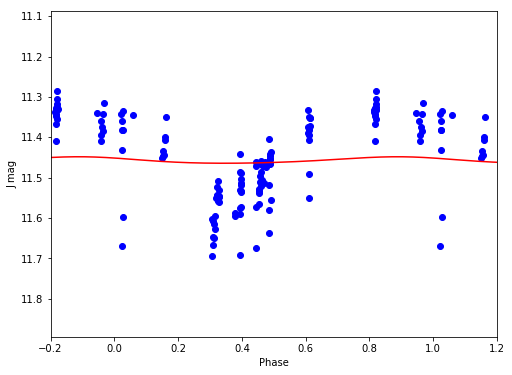

J 11.4570224174 0.0160634912311


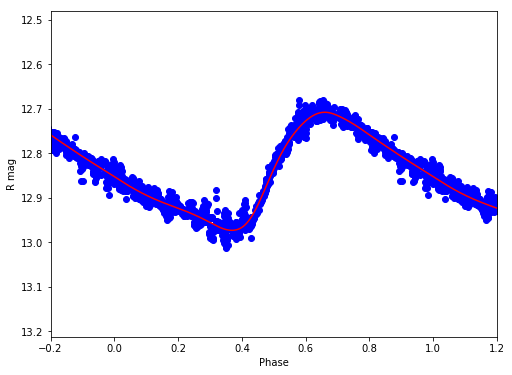

R 12.8396469375 0.265344661933


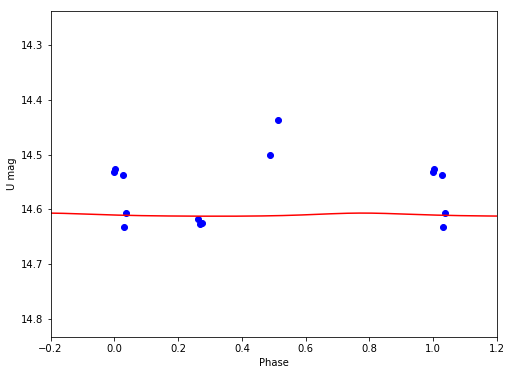

U 14.6102301583 0.00569270247441


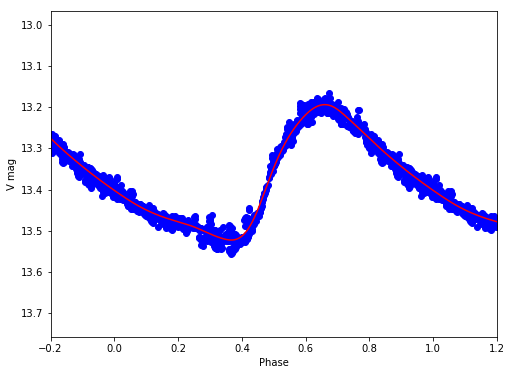

V 13.3685953678 0.328340323357
V6
/Volumes/Annie/CRRP/NGC6121/lcvs/V6.phased


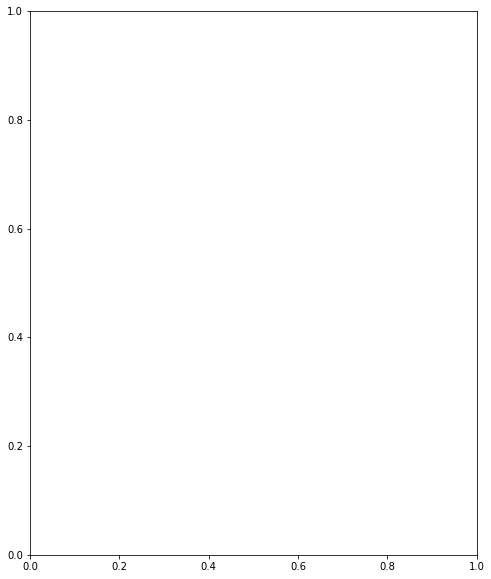

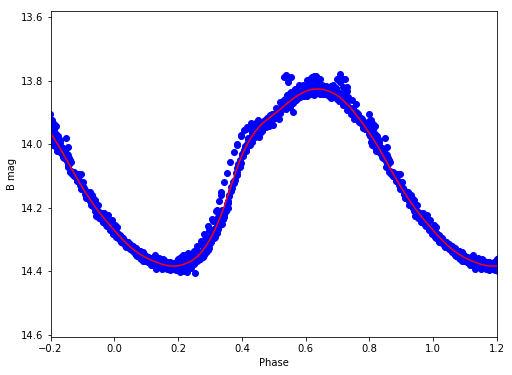

B 14.0846379216 0.55761954828


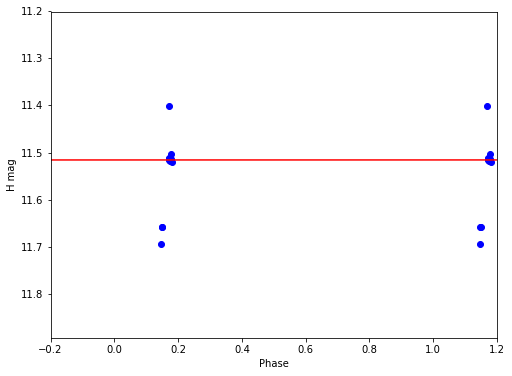

H 11.5156399266 8.28347362951e-05


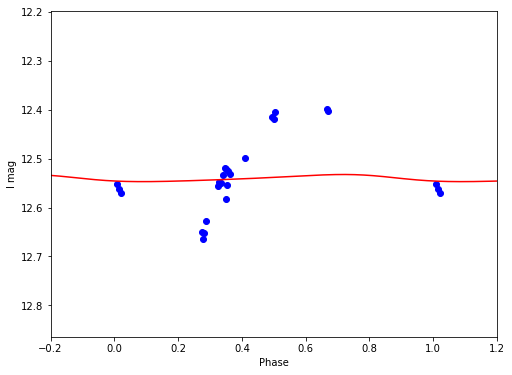

I 12.5405491659 0.0145697139716


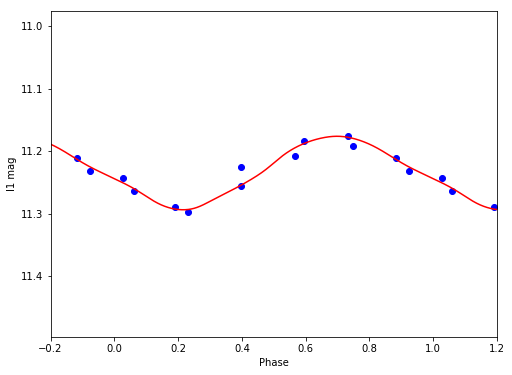

I1 11.2324658883 0.117628802816


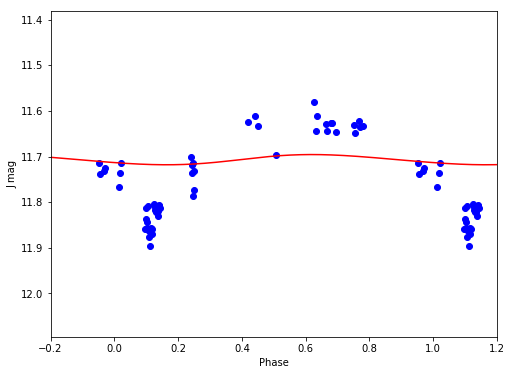

J 11.7067632565 0.0223859675543


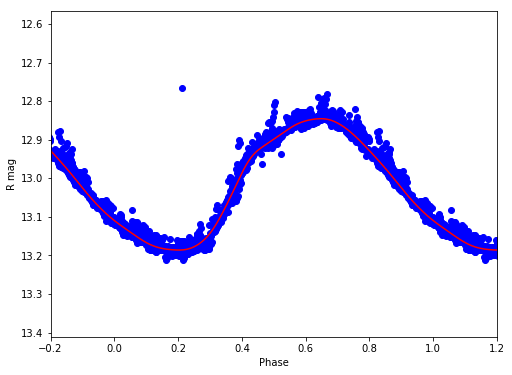

R 13.0078092713 0.340655060039


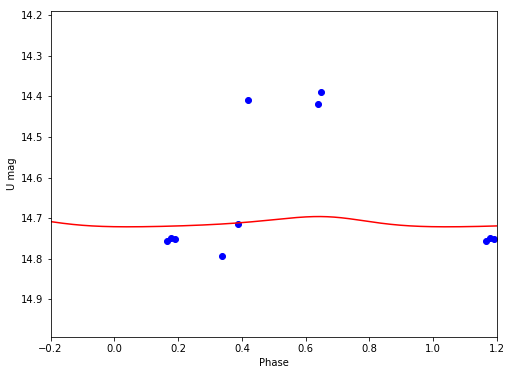

U 14.7111624646 0.0252532888771


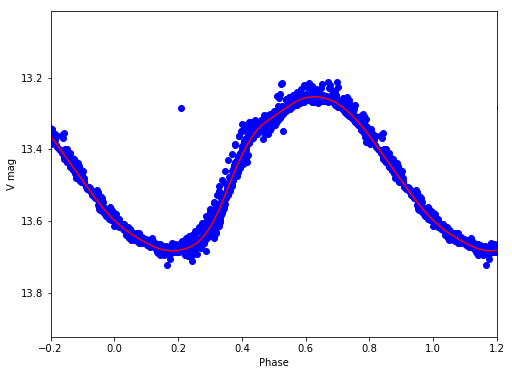

V 13.4547907649 0.429631433854
V7
/Volumes/Annie/CRRP/NGC6121/lcvs/V7.phased


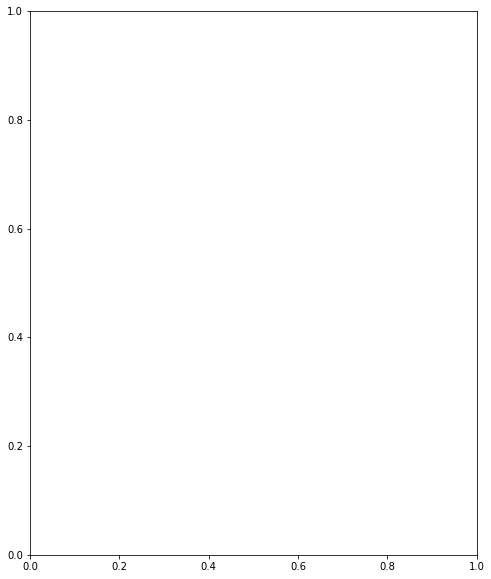

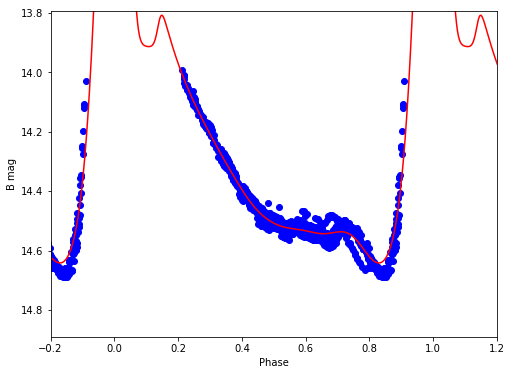

B 14.1266911101 1.91018522314


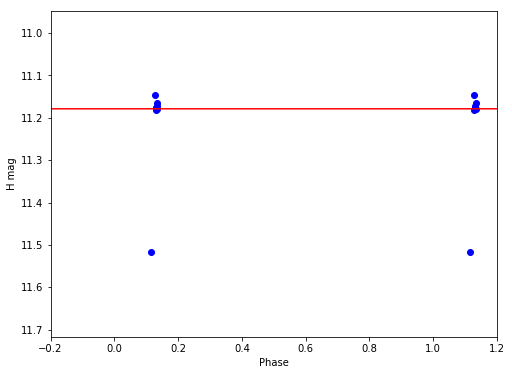

H 11.1787074134 7.2039036553e-05


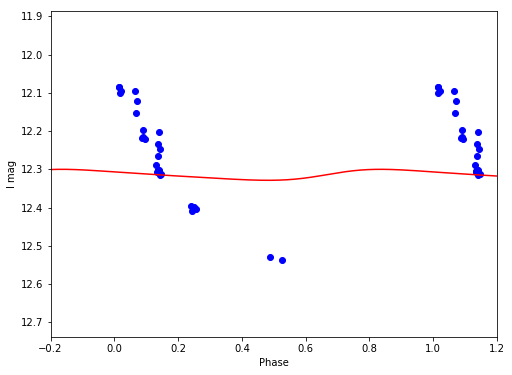

I 12.3148332088 0.0287250922164


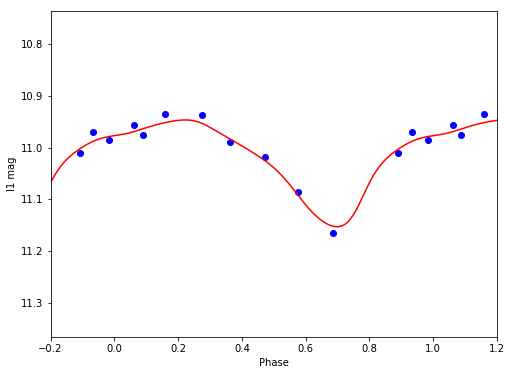

I1 11.0195387501 0.205953283148


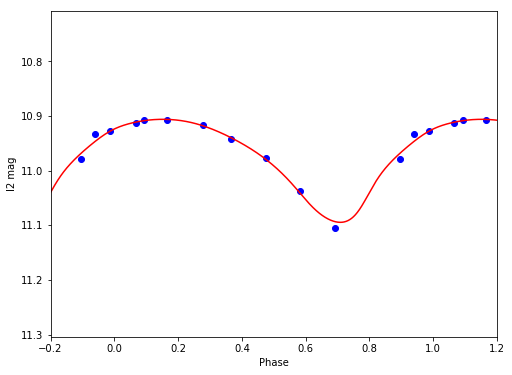

I2 10.9738149302 0.188564646406


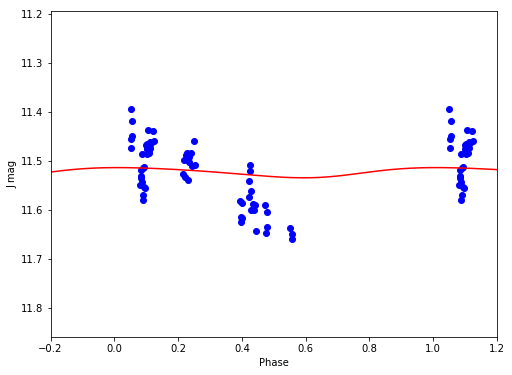

J 11.5224868959 0.0208302835639


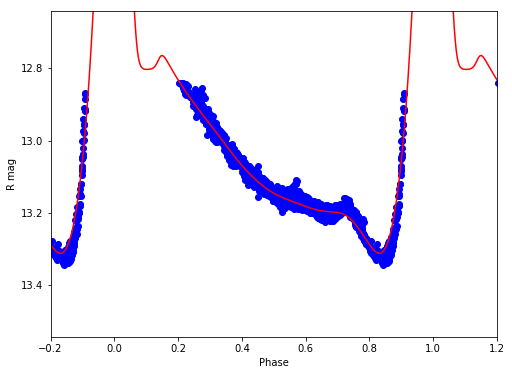

R 12.9295006753 1.37865131096


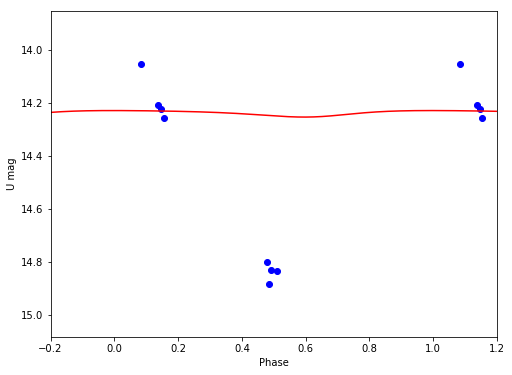

U 14.2366527437 0.0246079354746


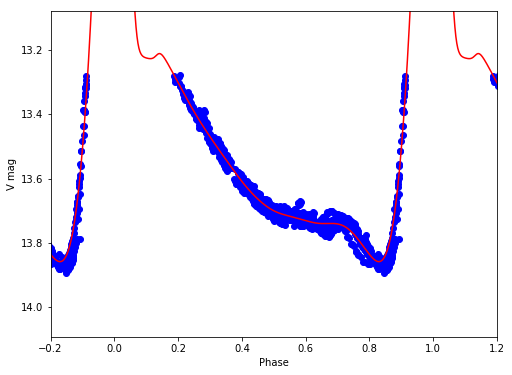

V 13.3902063354 1.58375262995
V8
/Volumes/Annie/CRRP/NGC6121/lcvs/V8.phased


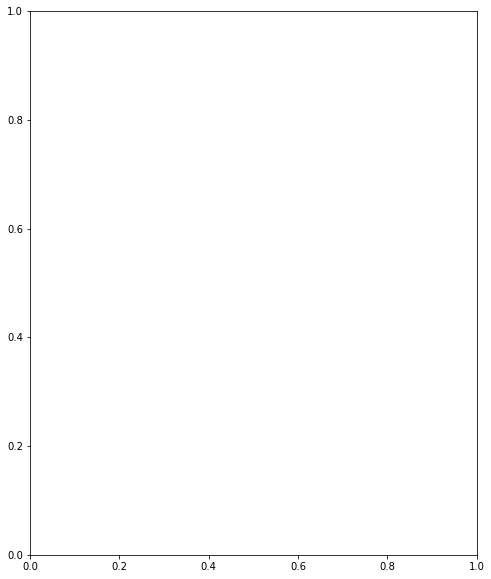

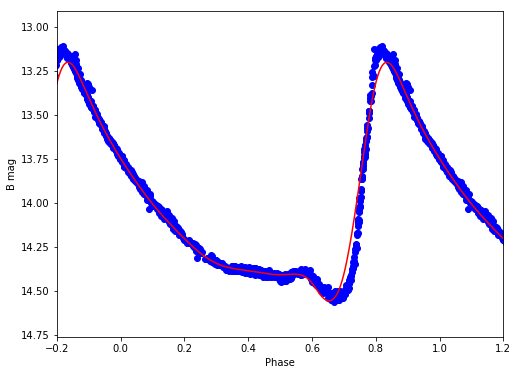

B 13.9857280066 1.35733055031


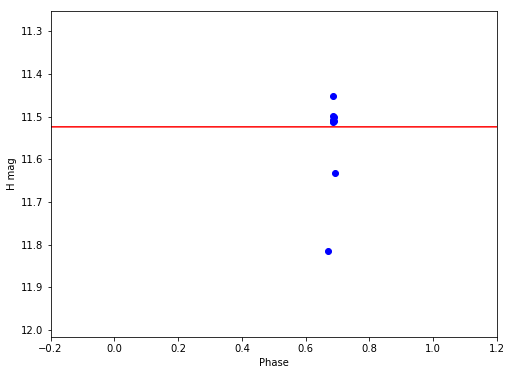

H 11.5241886714 0.000147031831389


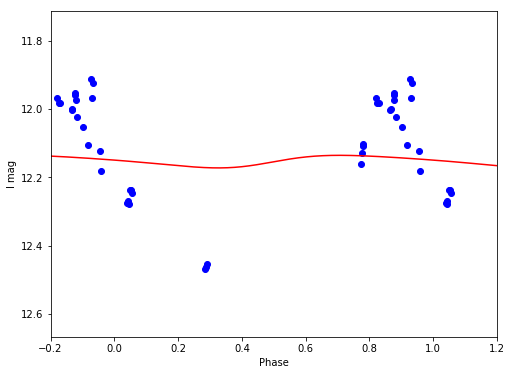

I 12.1519440225 0.0368965487561


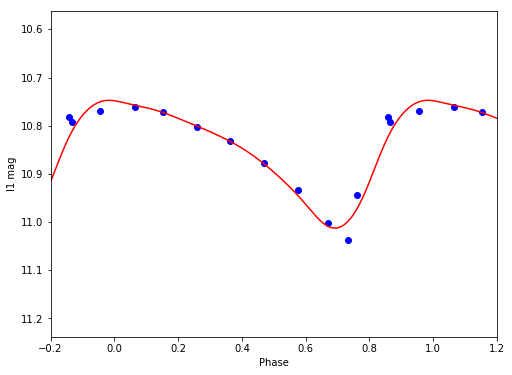

I1 10.8485056445 0.265280581738


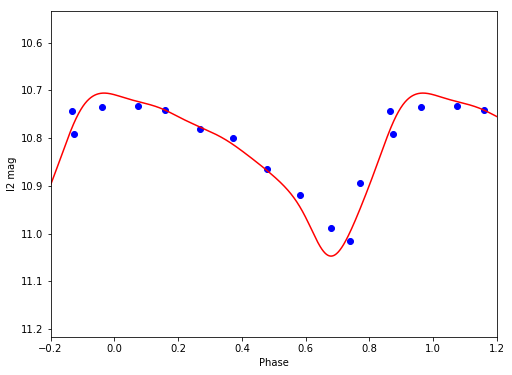

I2 10.8274046326 0.341399270502


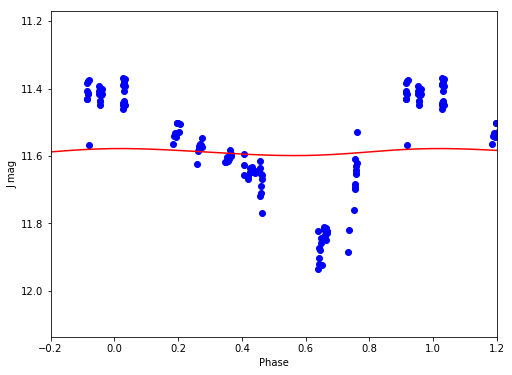

J 11.5883477719 0.0208078043859


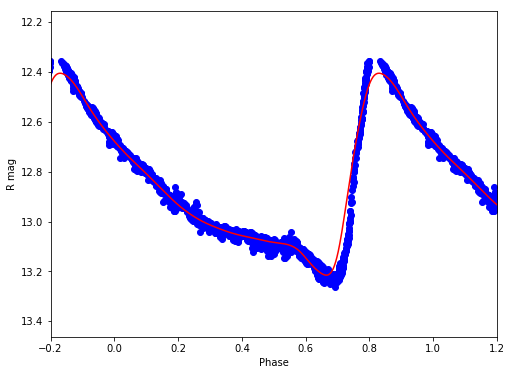

R 12.8499782031 0.809841029131


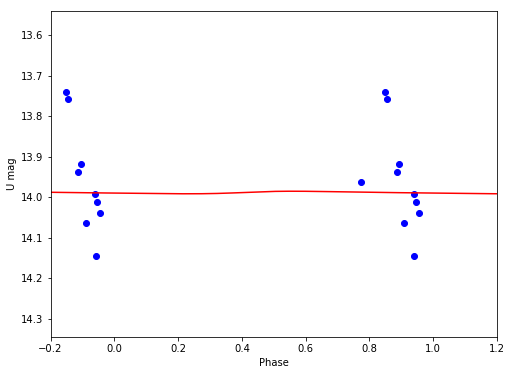

U 13.9886309241 0.00633363779528


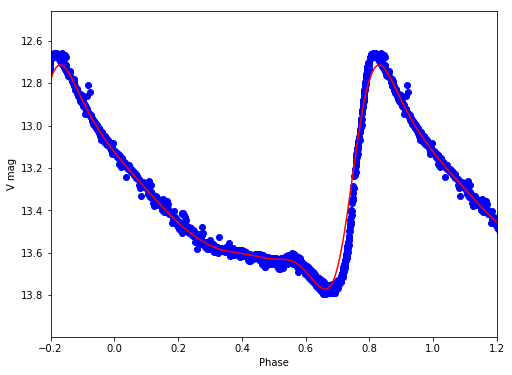

V 13.3218377222 1.05609997996
V9
/Volumes/Annie/CRRP/NGC6121/lcvs/V9.phased


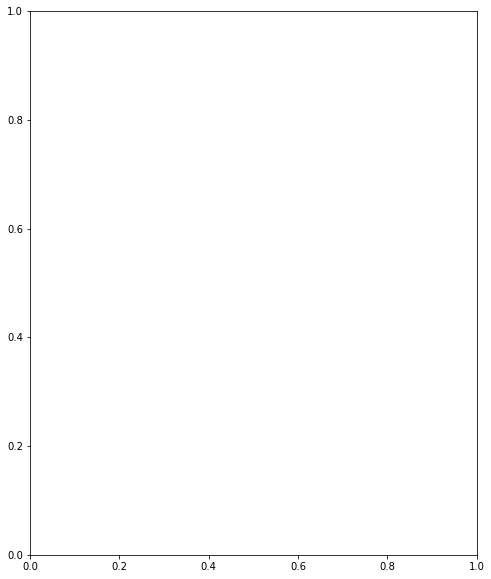

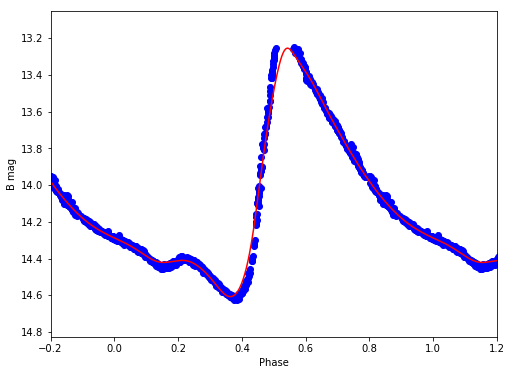

B 14.0027142253 1.35361937419


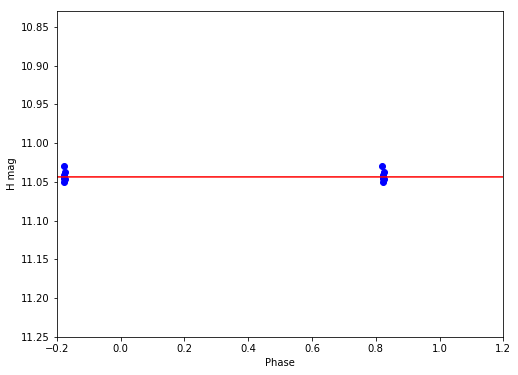

H 11.0436238926 1.63403682052e-06


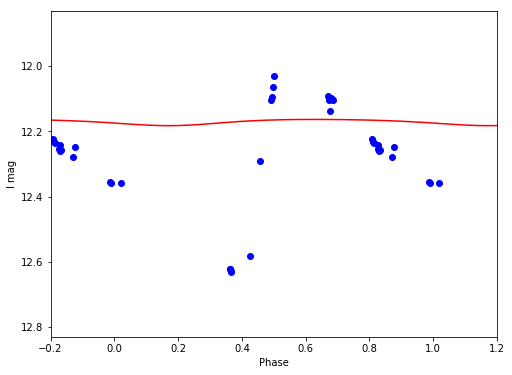

I 12.1707632234 0.0190946896167


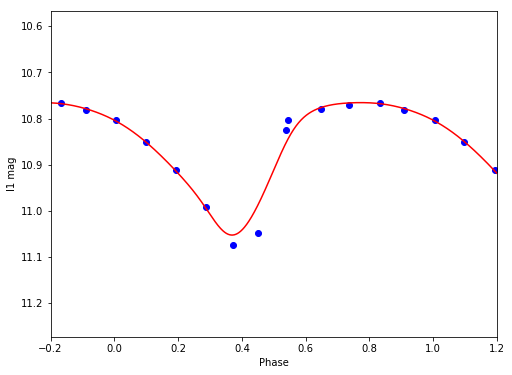

I1 10.85964244 0.287107725186


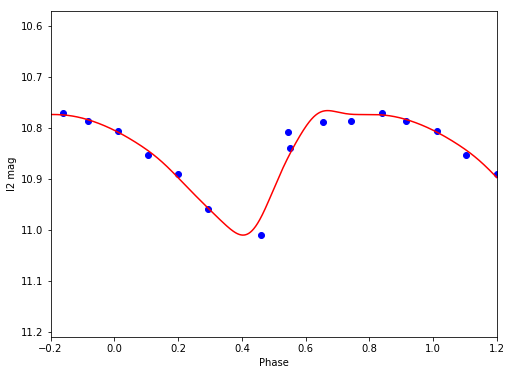

I2 10.8526630547 0.244306849731


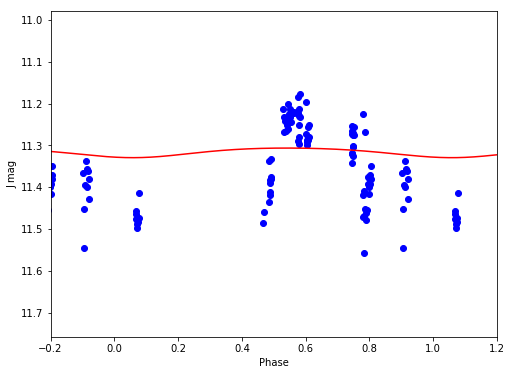

J 11.3159528904 0.0229423749789


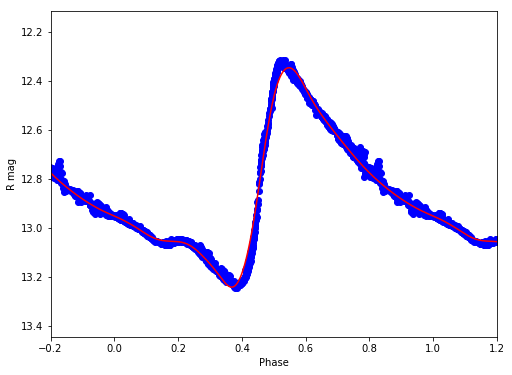

R 12.8231546338 0.897287834103


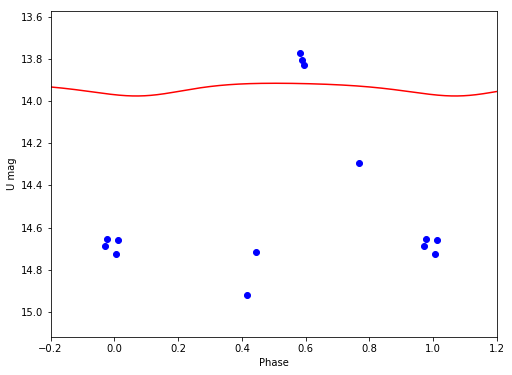

U 13.9379072758 0.0603937639413


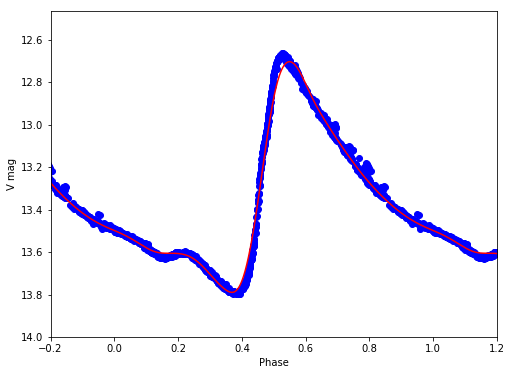

V 13.3072810288 1.08627222143
V10
/Volumes/Annie/CRRP/NGC6121/lcvs/V10.phased


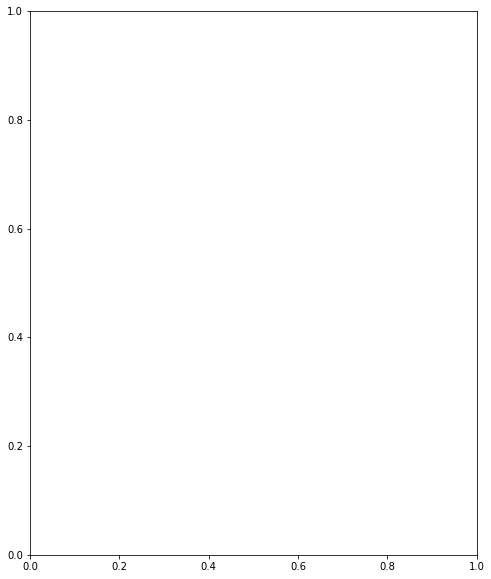

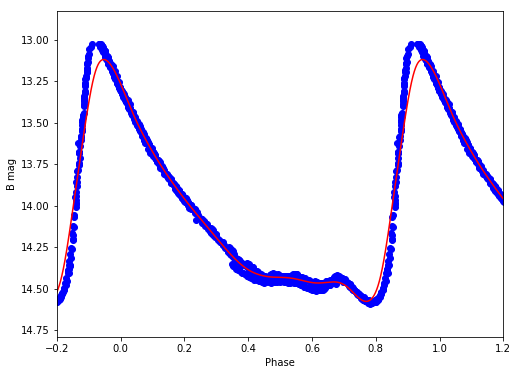

B 13.9709772715 1.45822248112


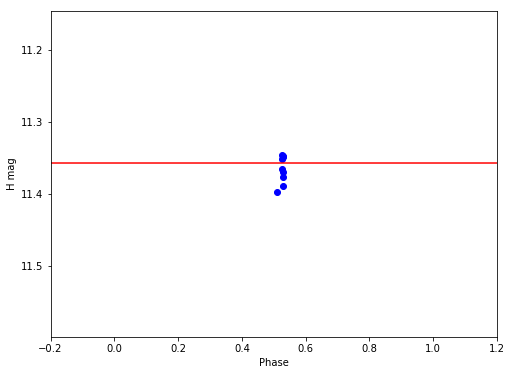

H 11.3571544964 3.29126007692e-06


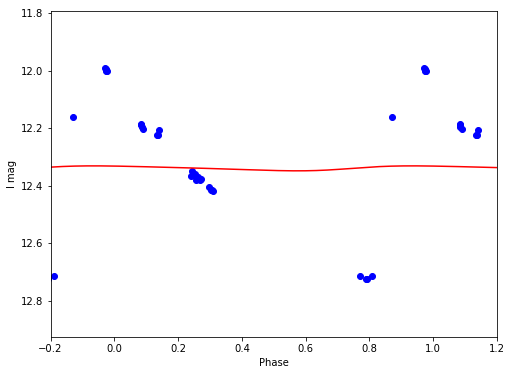

I 12.3393463081 0.0172672886122


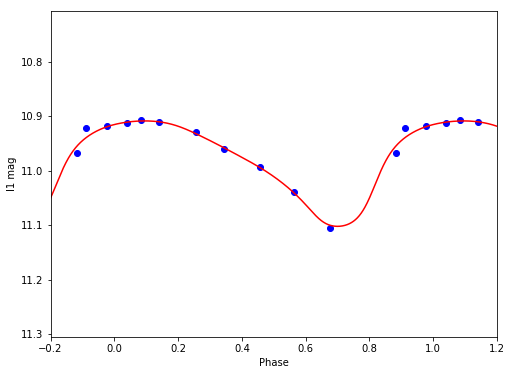

I1 10.9811444595 0.193604698207


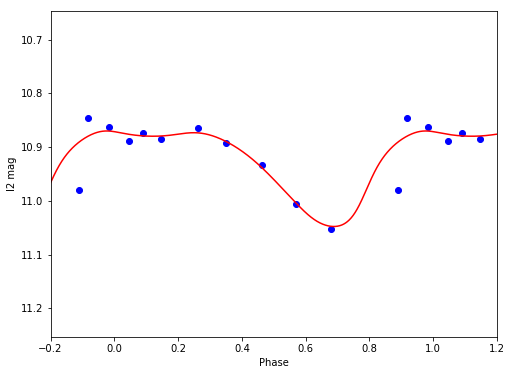

I2 10.9276701068 0.17776408516


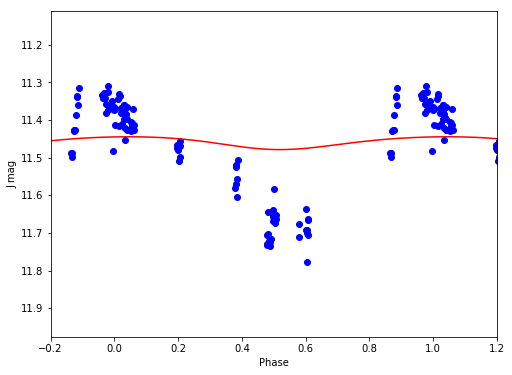

J 11.45897798 0.0341511256939


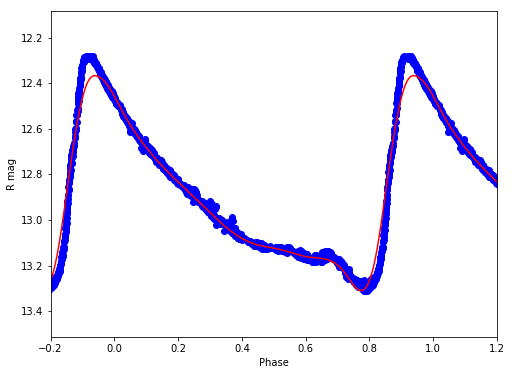

R 12.8860733774 0.942312250467


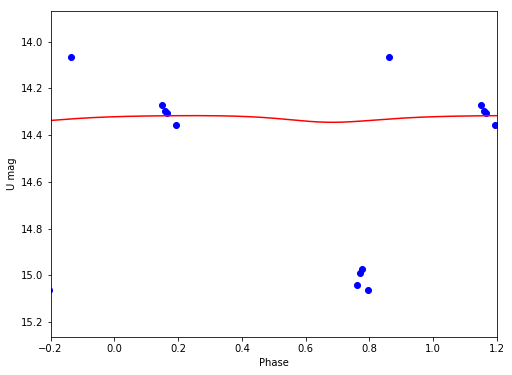

U 14.32744987 0.028520057887


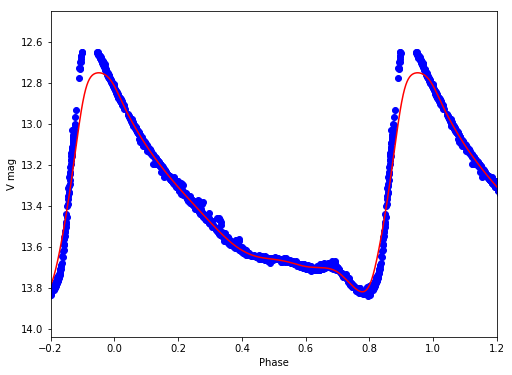

V 13.3566692221 1.06838758847
V11
/Volumes/Annie/CRRP/NGC6121/lcvs/V11.phased


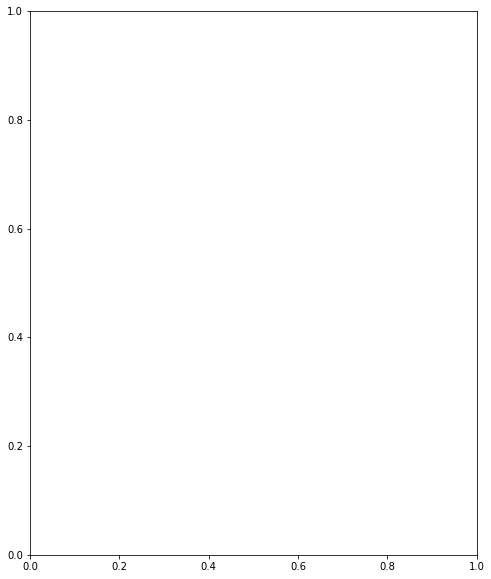

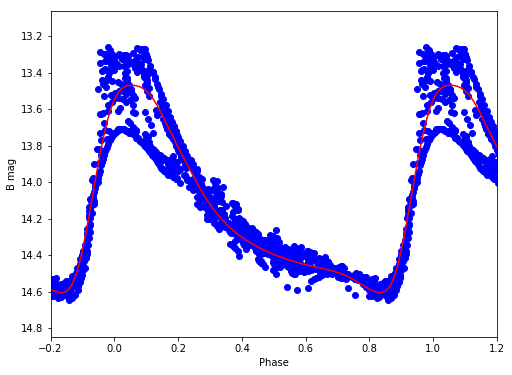

B 14.087664742 1.13629544052


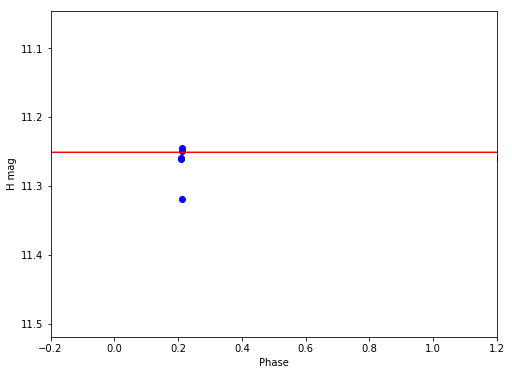

H 11.2508746954 1.20846084908e-05


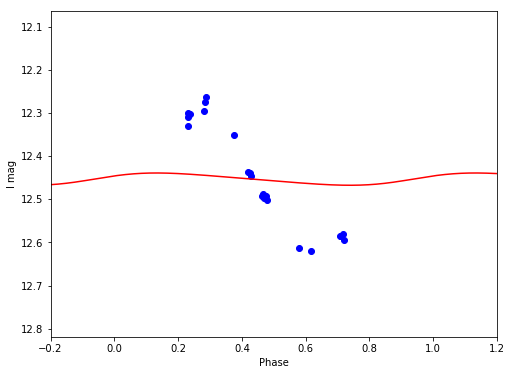

I 12.4530717273 0.0284867883186


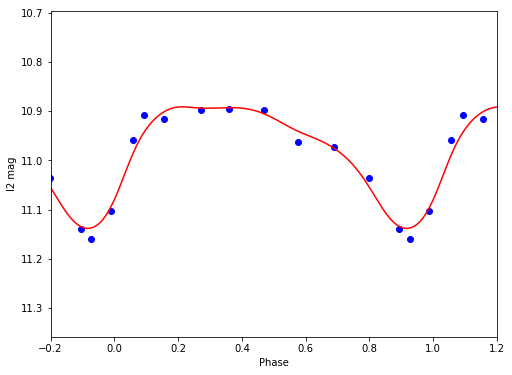

I2 10.9695379508 0.247463242931


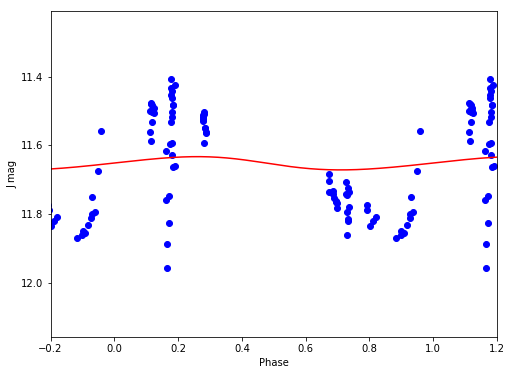

J 11.652341481 0.0386457323284


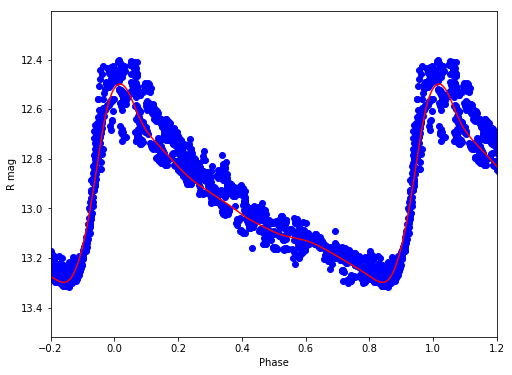

R 12.9588112453 0.799150798752


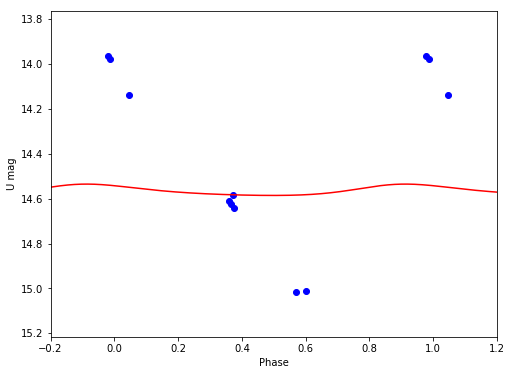

U 14.5659984964 0.0504940739589


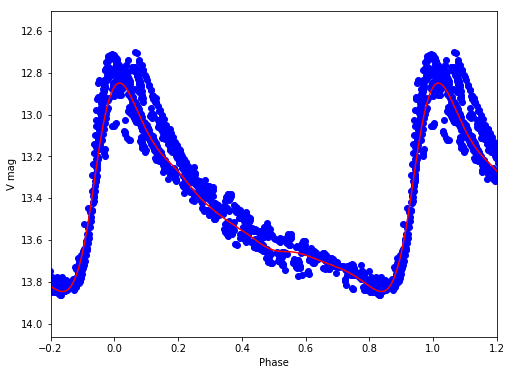

V 13.4320265441 0.997575155959
V12
/Volumes/Annie/CRRP/NGC6121/lcvs/V12.phased


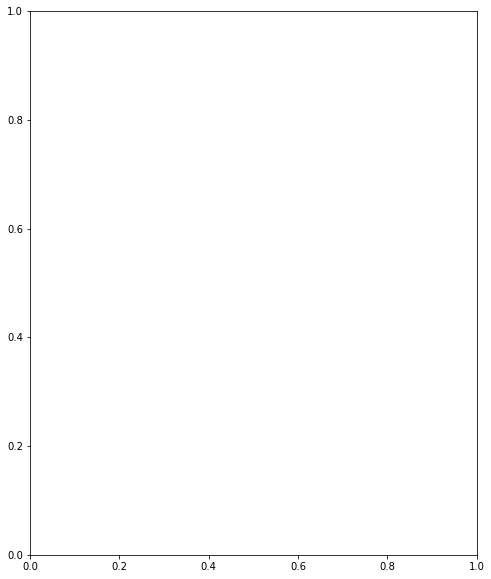

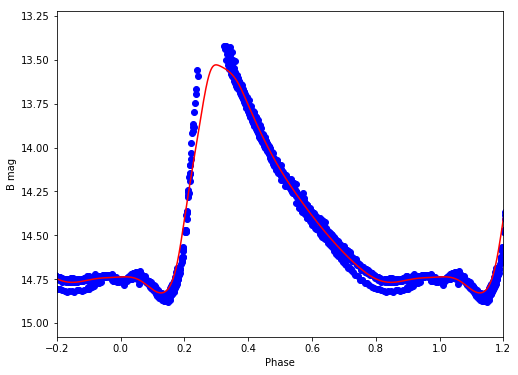

B 14.2958571361 1.29631070095


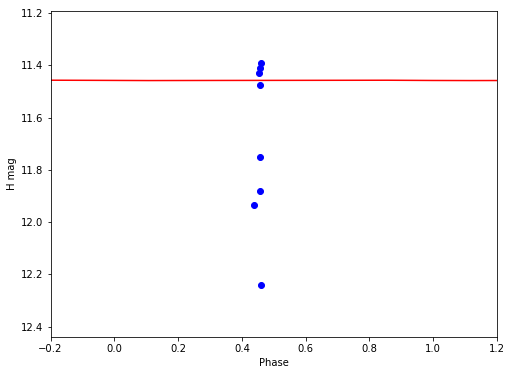

H 11.4578390539 0.00135400515081


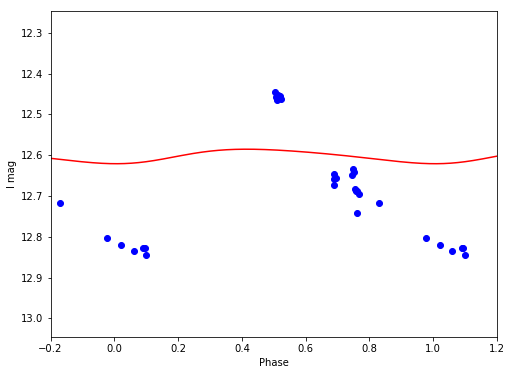

I 12.6017598618 0.0355507087442


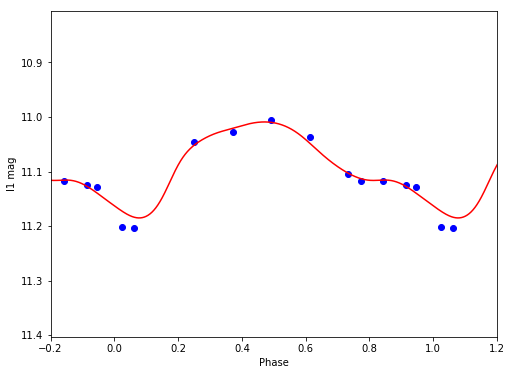

I1 11.0851356043 0.176002473596


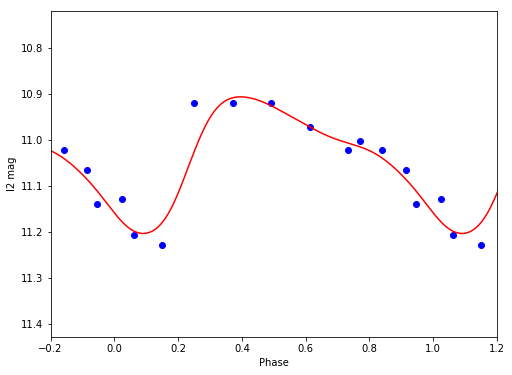

I2 11.0288271797 0.29614490228


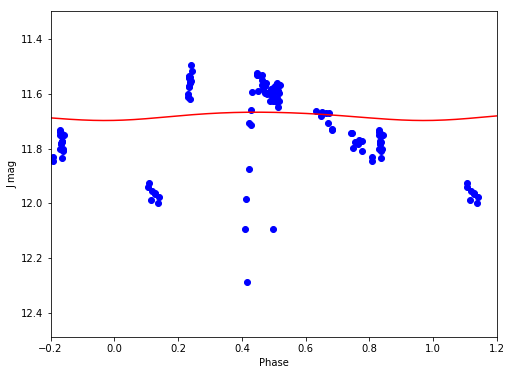

J 11.6813070736 0.0302919418158


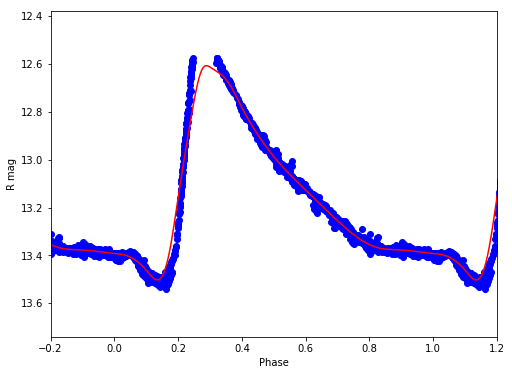

R 13.1151586603 0.895990988754


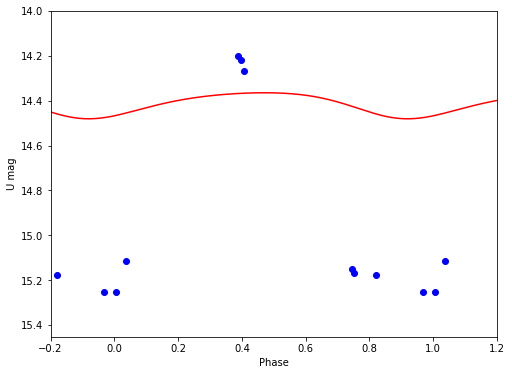

U 14.4113407367 0.115980564508


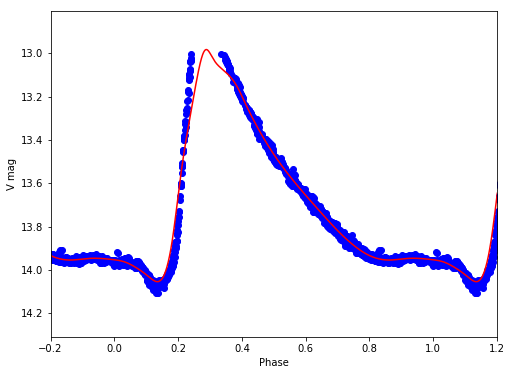

V 13.6141760591 1.0711449776
V14
/Volumes/Annie/CRRP/NGC6121/lcvs/V14.phased


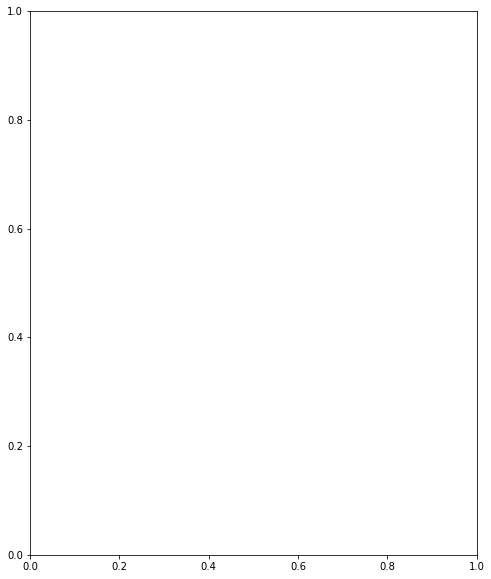

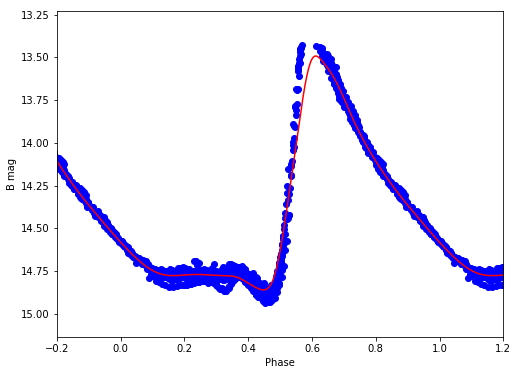

B 14.3127231992 1.36730431959


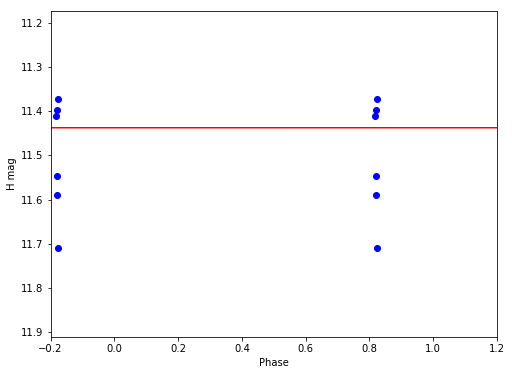

H 11.4376201058 2.64231600546e-05


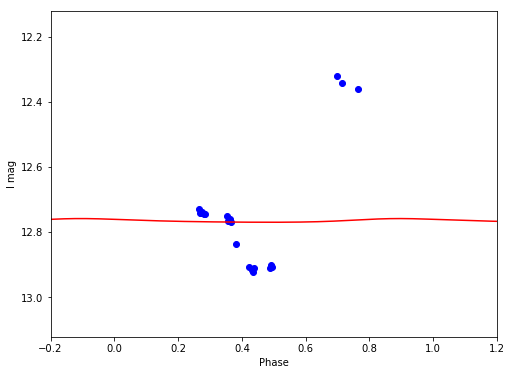

I 12.7643424333 0.0113468355303


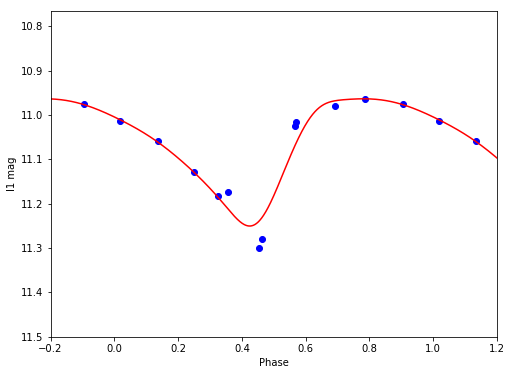

I1 11.0624293399 0.286703305049


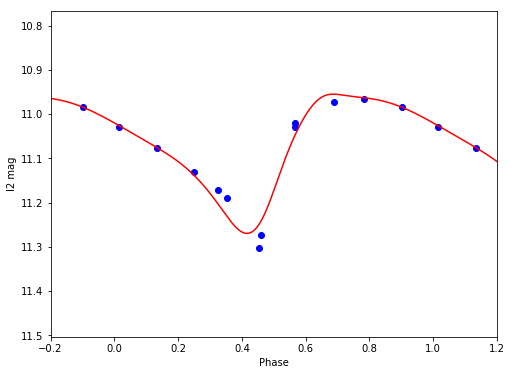

I2 11.0664517277 0.314698697226


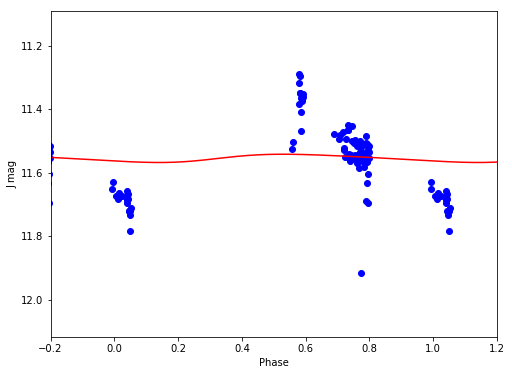

J 11.5540882547 0.0260092832477


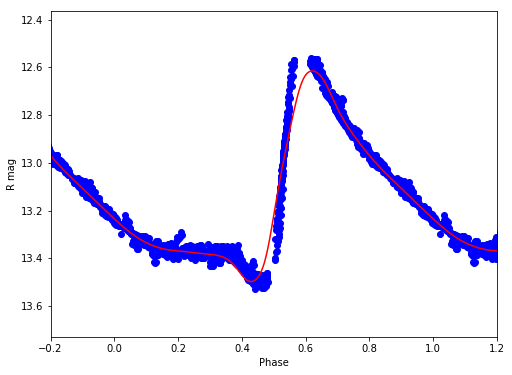

R 13.1162165287 0.882853908106


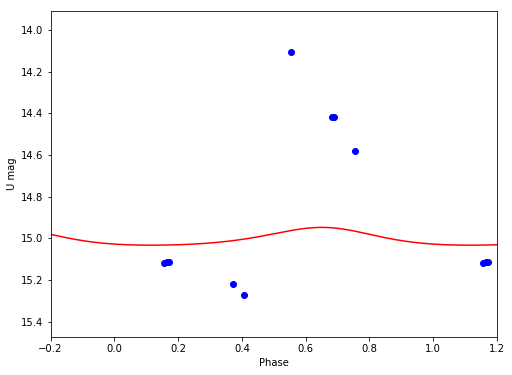

U 14.9987006964 0.0853570182191


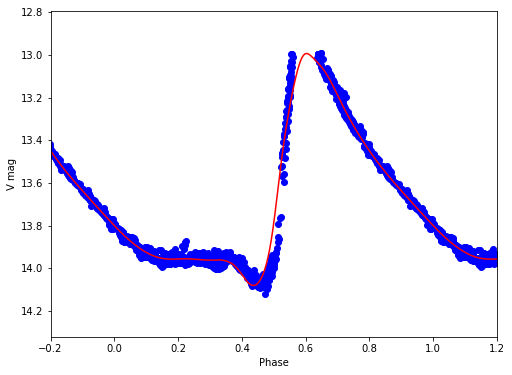

V 13.6163945095 1.08743646415
V15
/Volumes/Annie/CRRP/NGC6121/lcvs/V15.phased


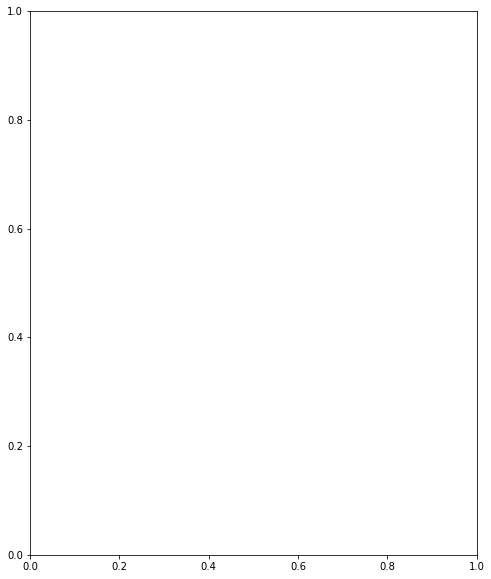

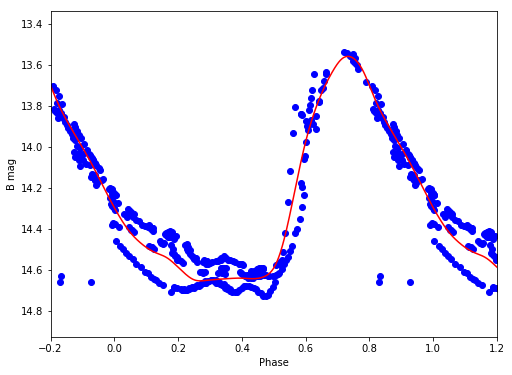

B 14.1830552943 1.09370116506


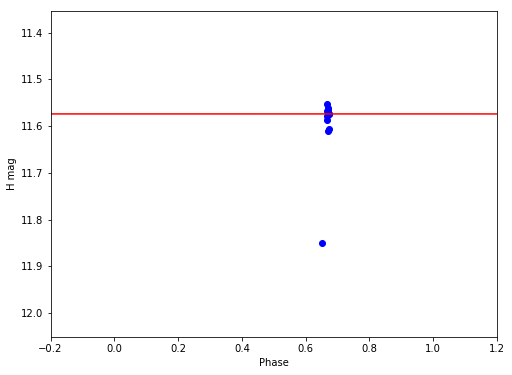

H 11.5740622123 0.000123002611392


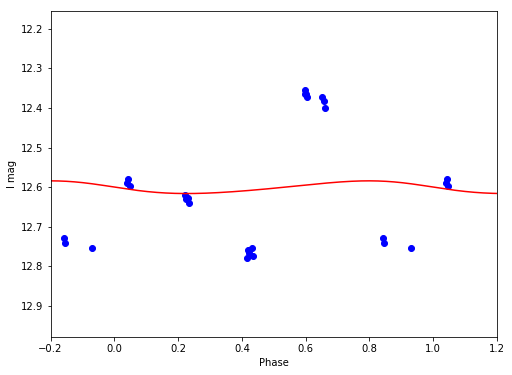

I 12.6007459046 0.0320686729462


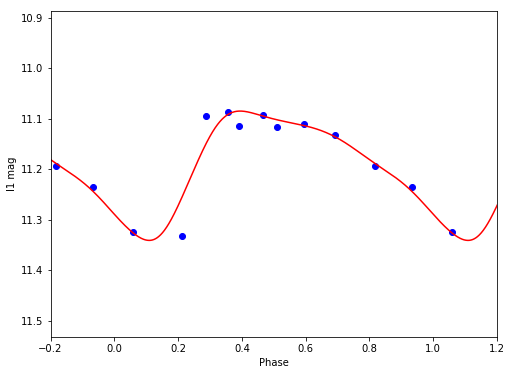

I1 11.1849735088 0.256165291834


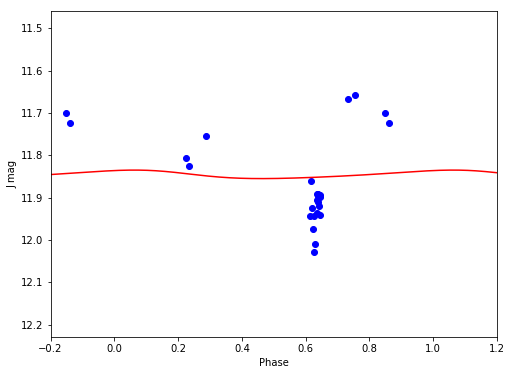

J 11.8459362001 0.0201037797951


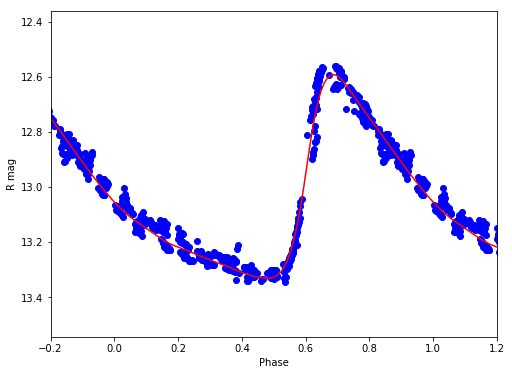

R 13.0243220475 0.738756577975


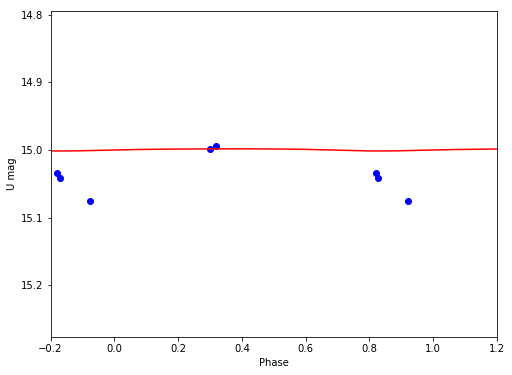

U 14.9994016481 0.00317635518934


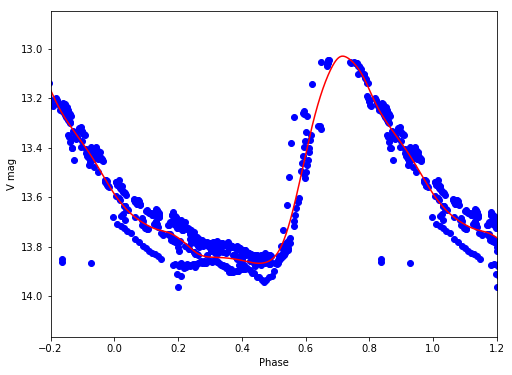

V 13.5247108191 0.835816807194
V16
/Volumes/Annie/CRRP/NGC6121/lcvs/V16.phased


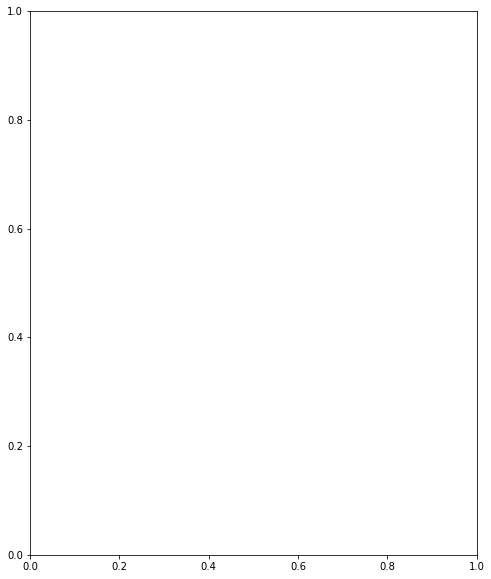

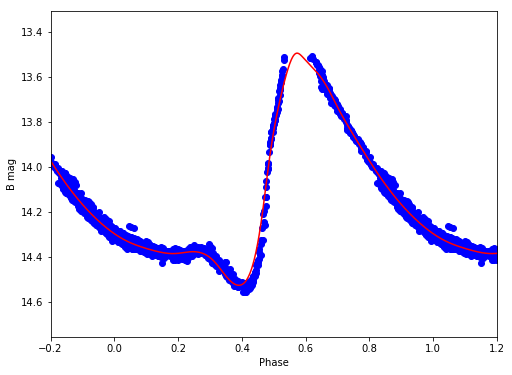

B 14.071359712 1.03342324784


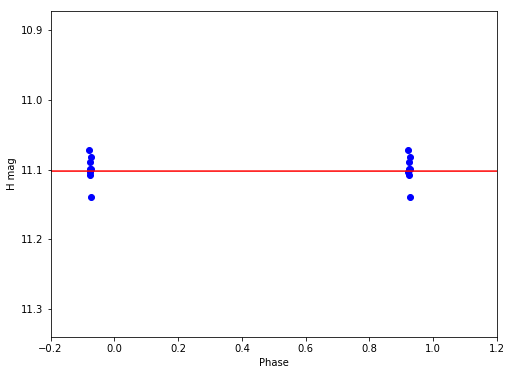

H 11.1022121823 4.61970135834e-05


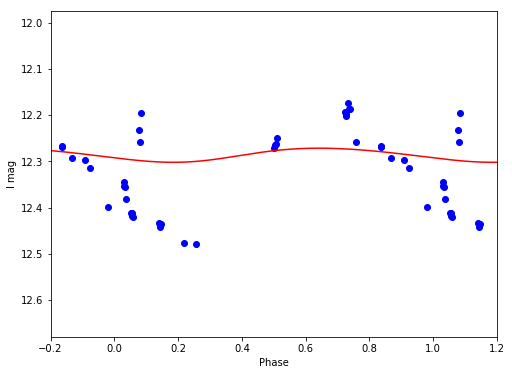

I 12.2856878448 0.0305257493739


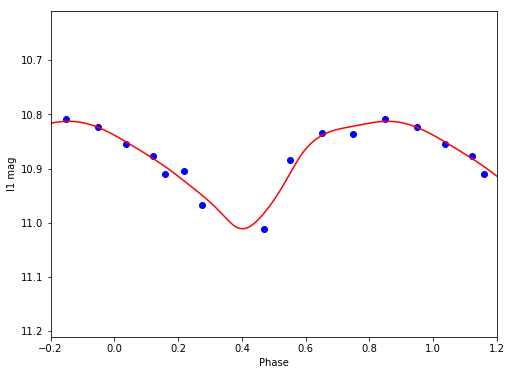

I1 10.885979155 0.198635927205


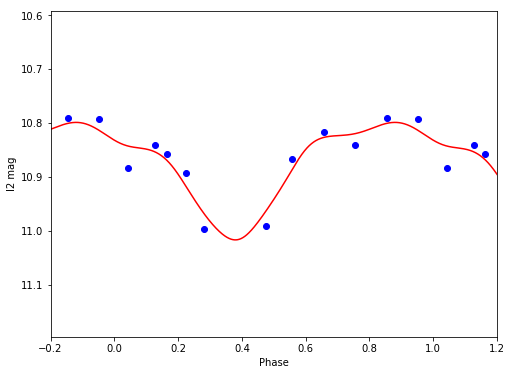

I2 10.876883636 0.217948796993


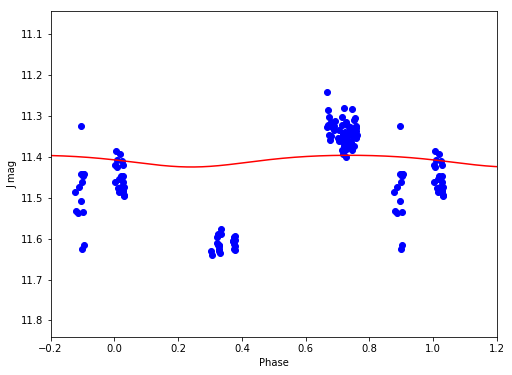

J 11.4087007874 0.0285811165563


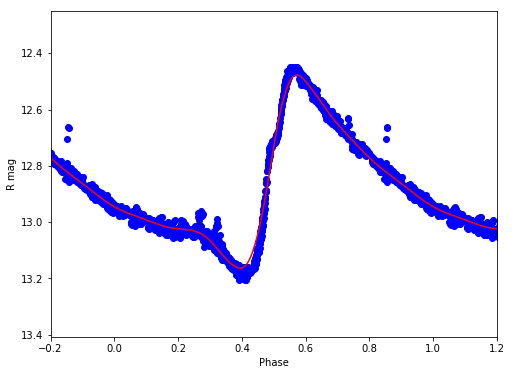

R 12.8518738568 0.685507086302


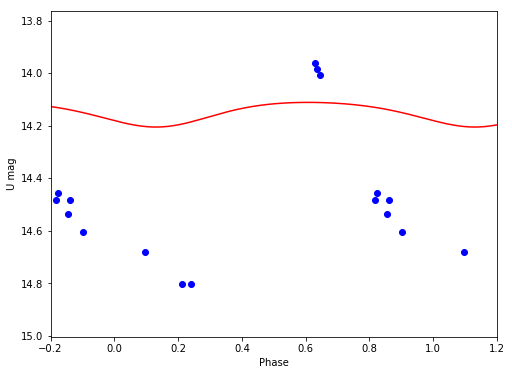

U 14.1492768909 0.0938527882011


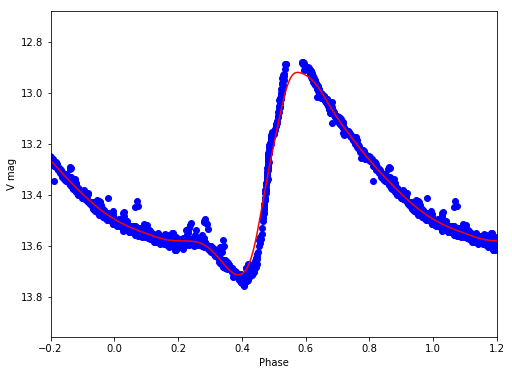

V 13.3549578422 0.792025112362
V18
/Volumes/Annie/CRRP/NGC6121/lcvs/V18.phased


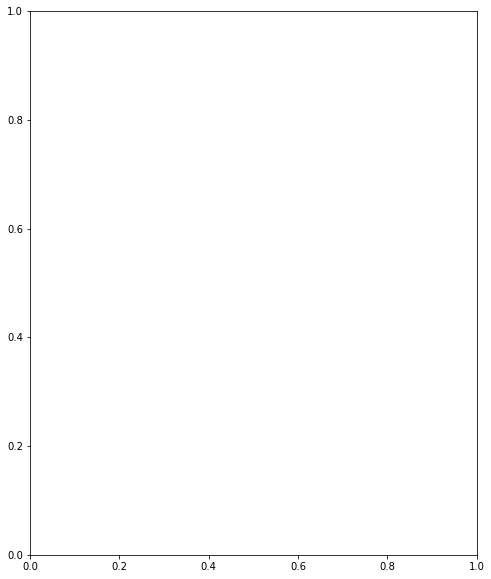

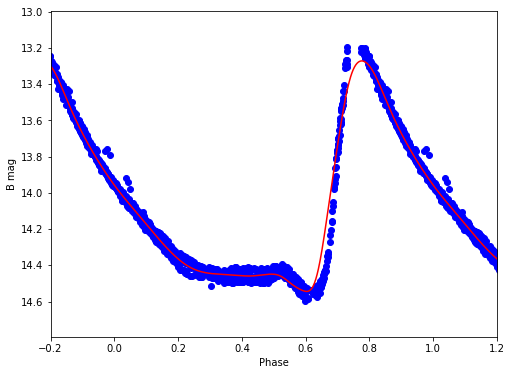

B 14.028541133 1.2722265212


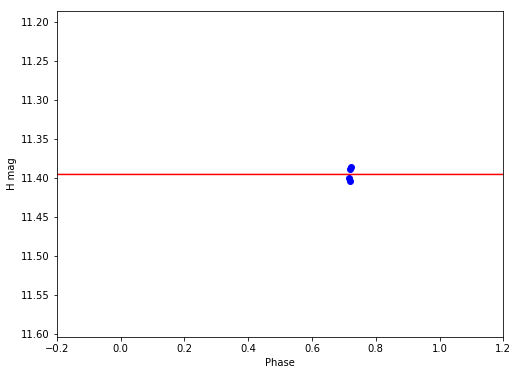

H 11.3959220776 1.11758294743e-05


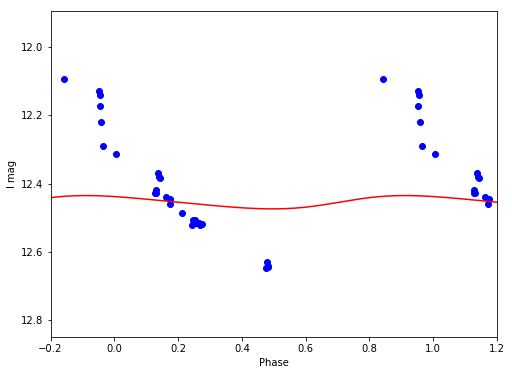

I 12.4544384256 0.0389708579251


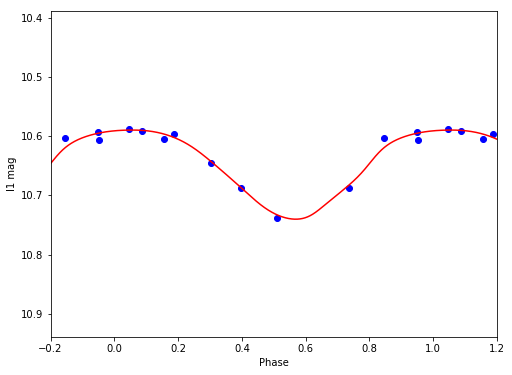

I1 10.6518524556 0.150584631027


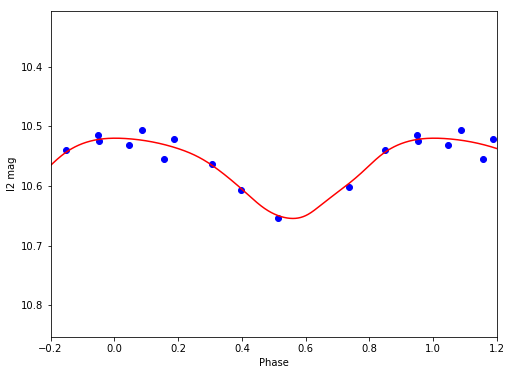

I2 10.5741055895 0.134599075915


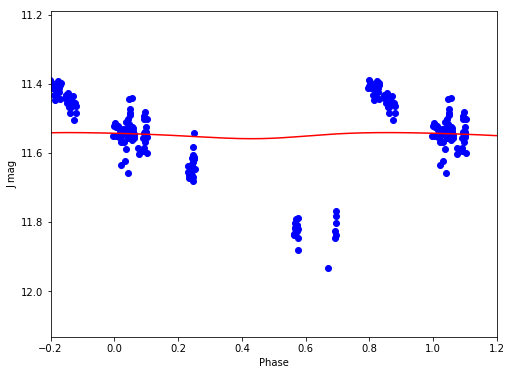

J 11.5482871809 0.0176705343391


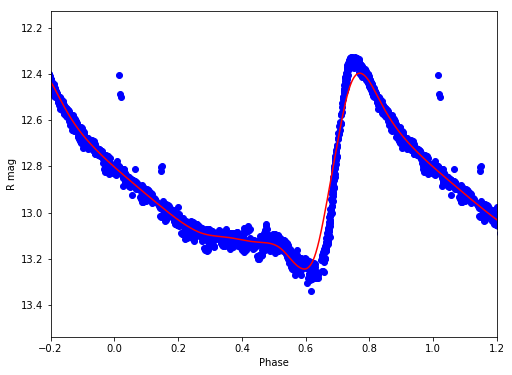

R 12.8840652155 0.845824567684


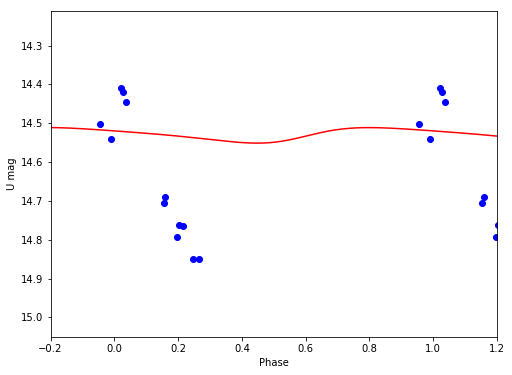

U 14.5293394485 0.0399818708999


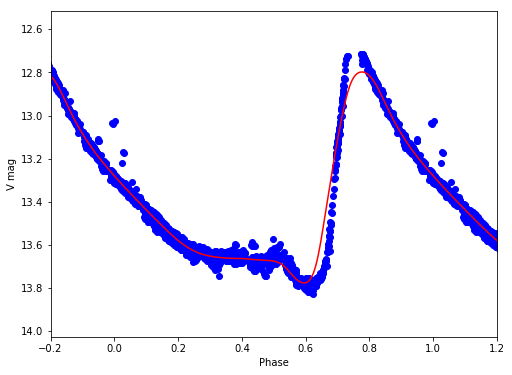

V 13.3630556267 0.979528512785
V19
/Volumes/Annie/CRRP/NGC6121/lcvs/V19.phased


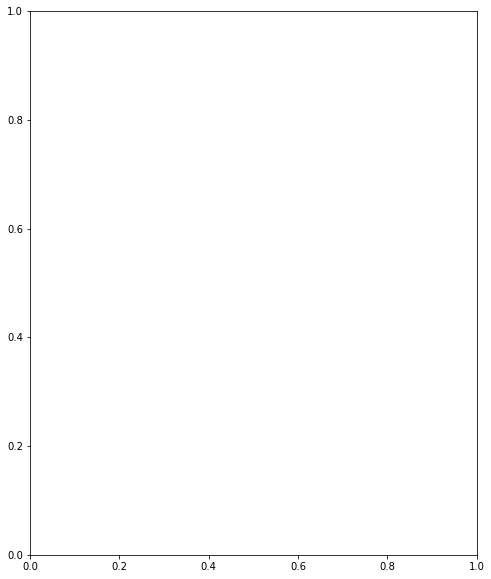

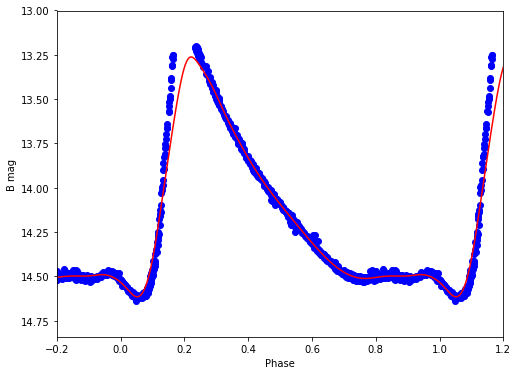

B 14.0580892991 1.35234783603


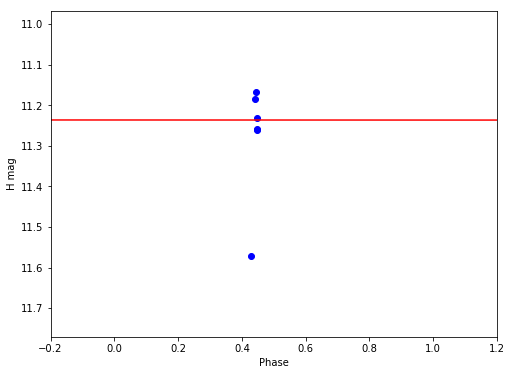

H 11.2359772399 0.000272727926209


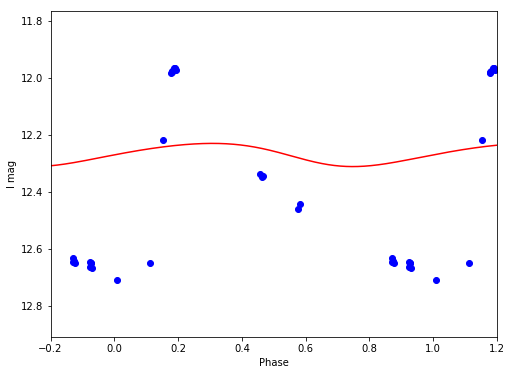

I 12.2675782864 0.0812393828012


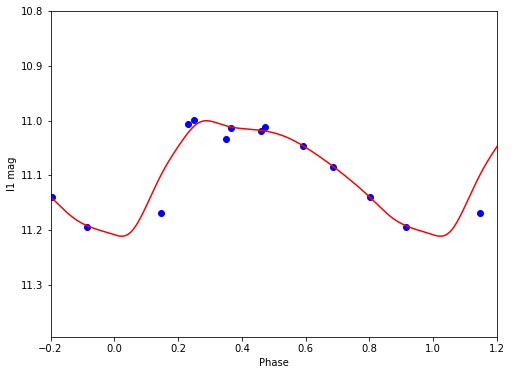

I1 11.0892231838 0.211005872966


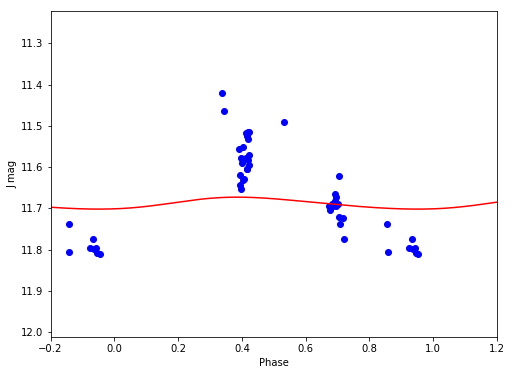

J 11.6878340022 0.0289644689308


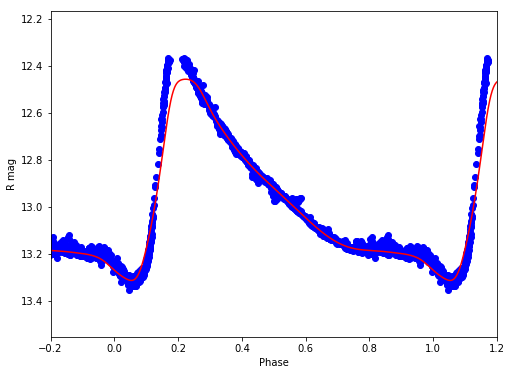

R 12.9449193192 0.855769975412


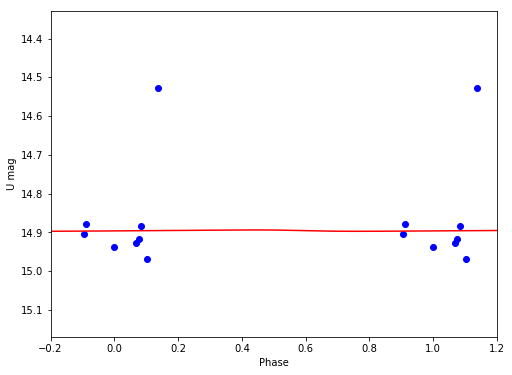

U 14.8953362743 0.00351170693945


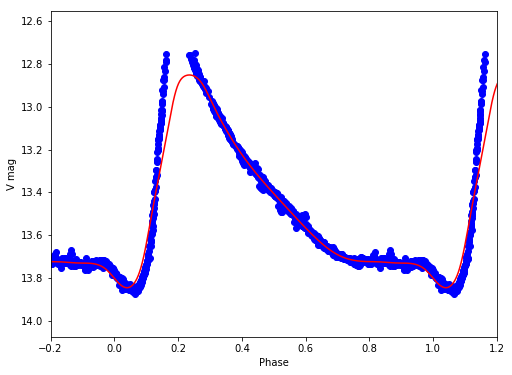

V 13.4191994182 0.994108444645
V20
/Volumes/Annie/CRRP/NGC6121/lcvs/V20.phased


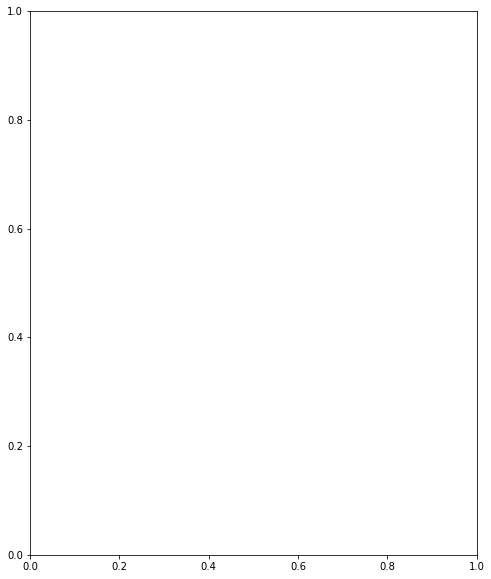

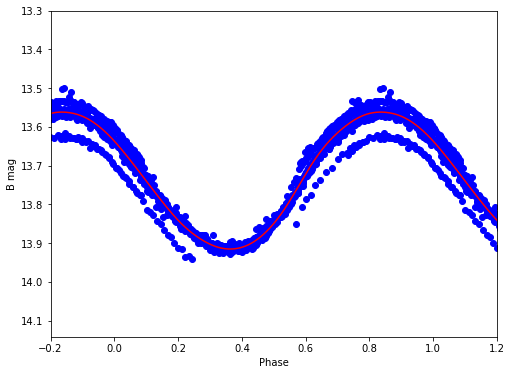

B 13.7281605812 0.353532717689


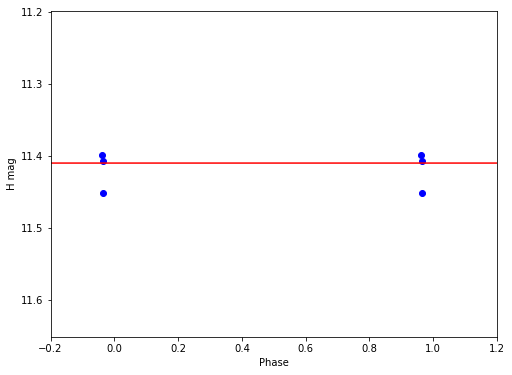

H 11.4097020606 1.15383628341e-06


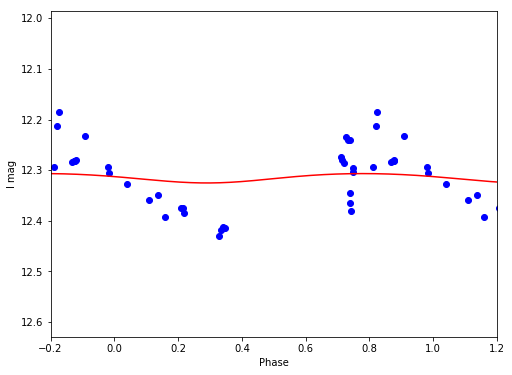

I 12.3152483627 0.0184995489177


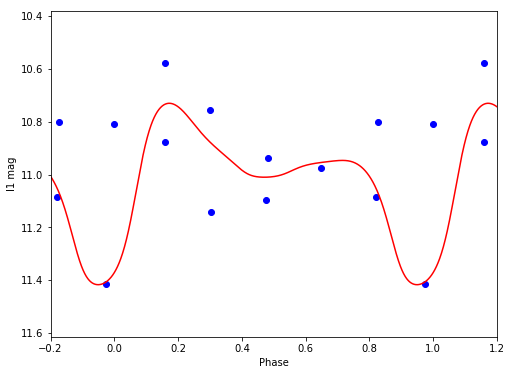

I1 10.9974872064 0.68692916857


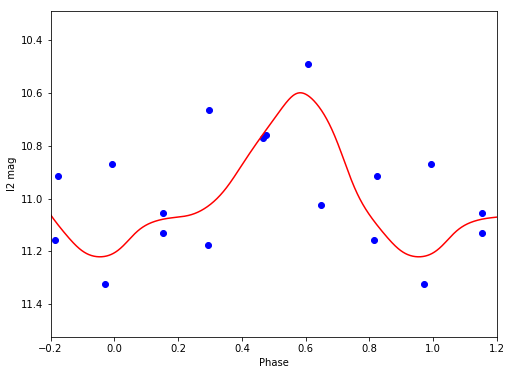

I2 10.9442670891 0.620614936122


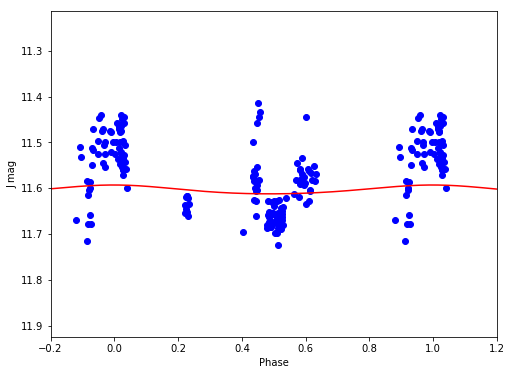

J 11.6031929494 0.0192679834268


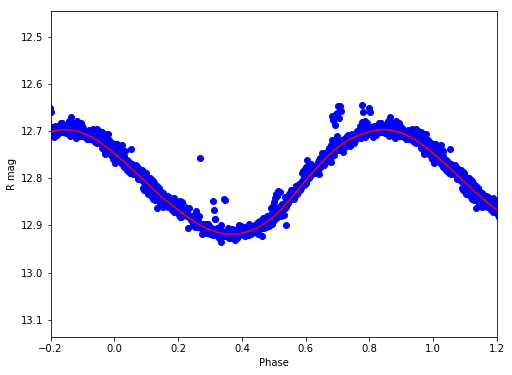

R 12.8047794066 0.221241784169


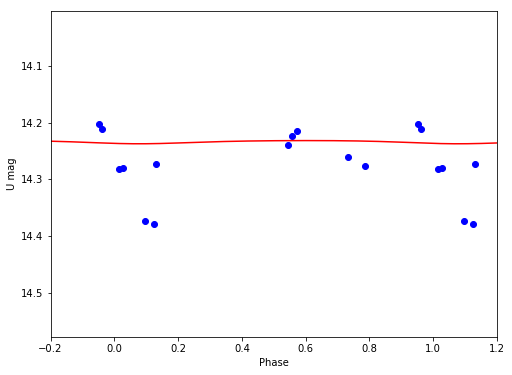

U 14.2337209661 0.00564608113345


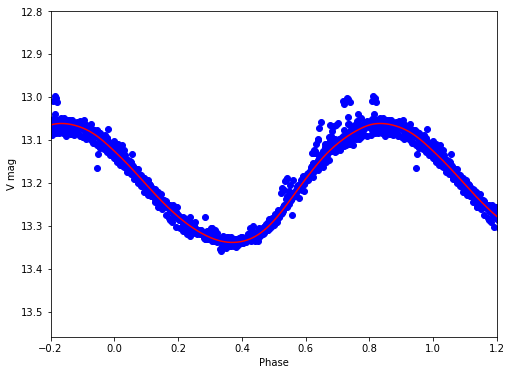

V 13.1945261438 0.27715468988
V21
/Volumes/Annie/CRRP/NGC6121/lcvs/V21.phased


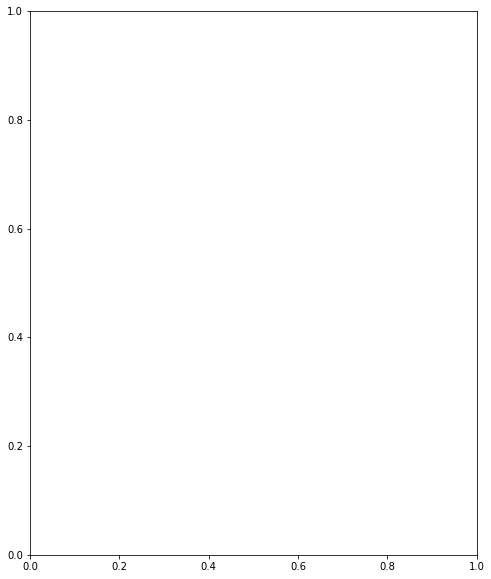

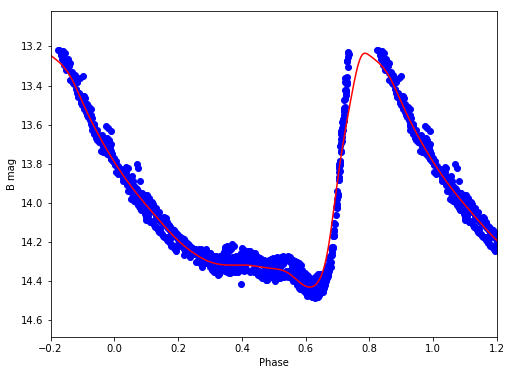

B 13.9284160579 1.19606182065


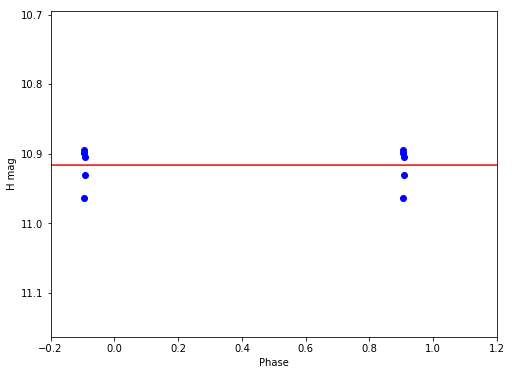

H 10.9160667848 9.55876812547e-06


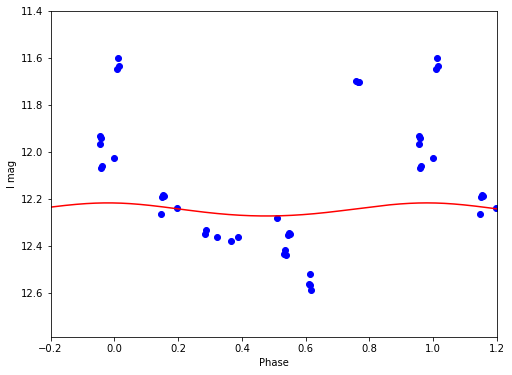

I 12.2453700375 0.0557343405892


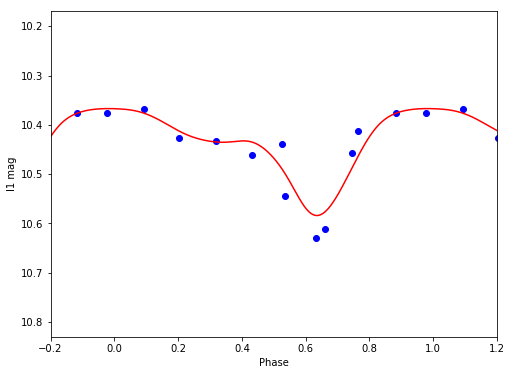

I1 10.4376756062 0.216998059853


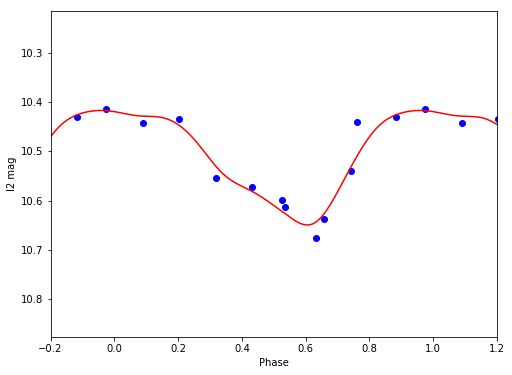

I2 10.5085573408 0.232105114473


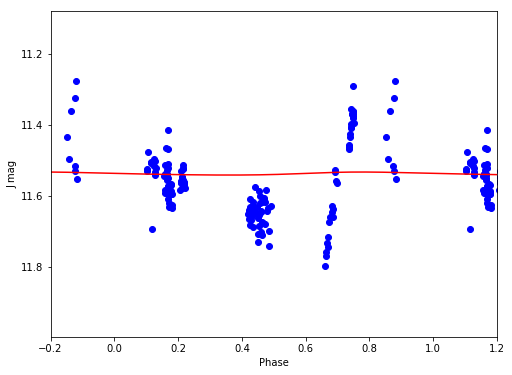

J 11.537423449 0.00854351547259


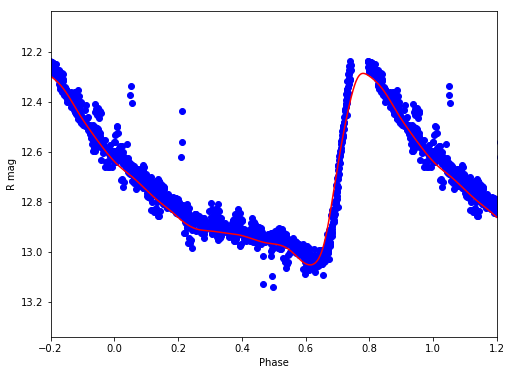

R 12.7298753121 0.766405355167


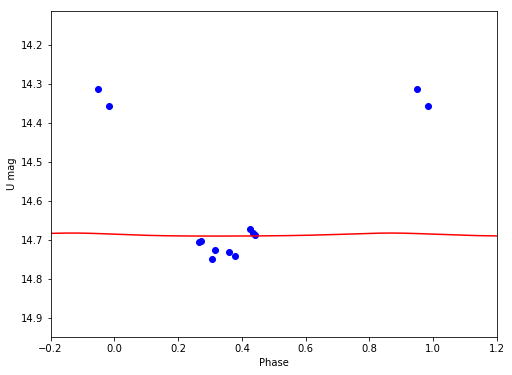

U 14.6869462801 0.00775493363428


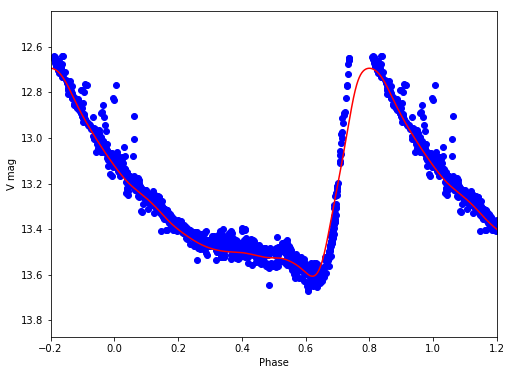

V 13.2308104623 0.913103138403
V22
/Volumes/Annie/CRRP/NGC6121/lcvs/V22.phased


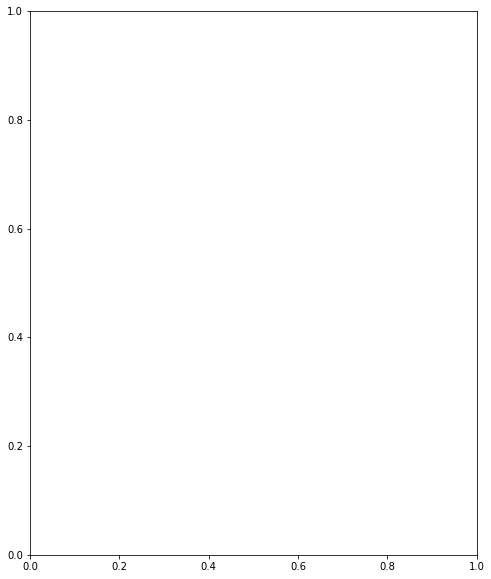

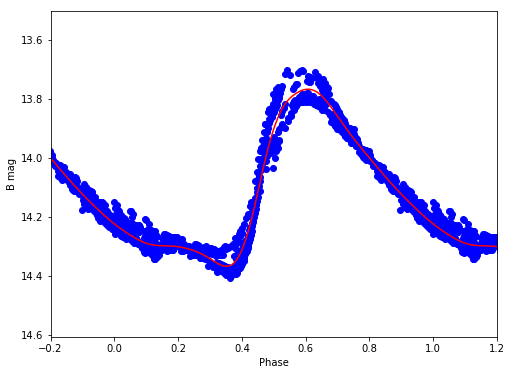

B 14.092582606 0.599788145564


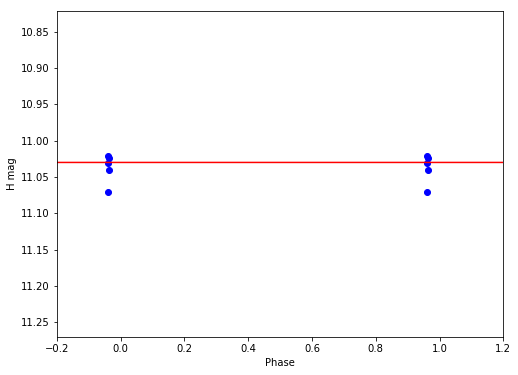

H 11.0299679206 5.16710665366e-07


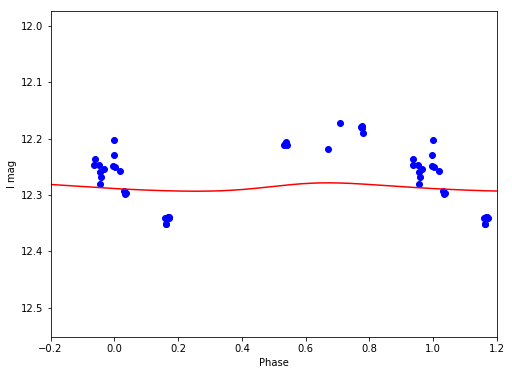

I 12.286824479 0.0148756716447


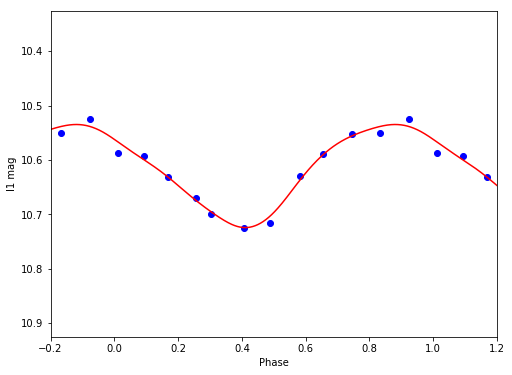

I1 10.6176906306 0.189643937783


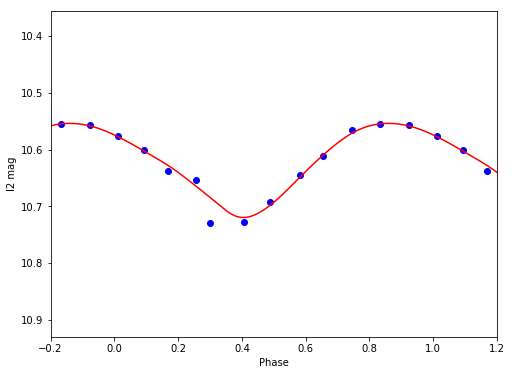

I2 10.6242642315 0.165374485666


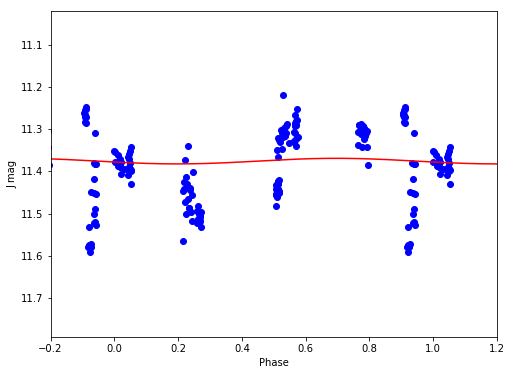

J 11.3756301813 0.0132506167819


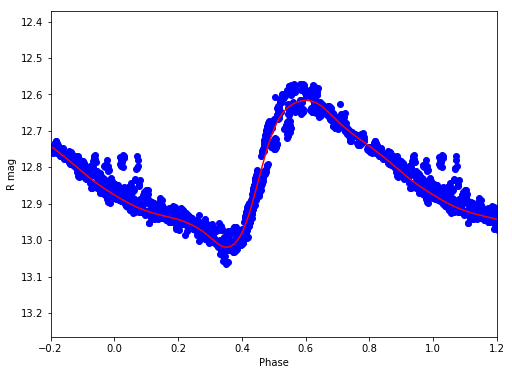

R 12.8173739835 0.402644593396


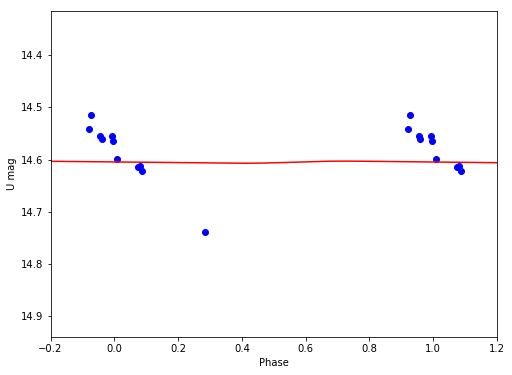

U 14.6049745964 0.00408288466098


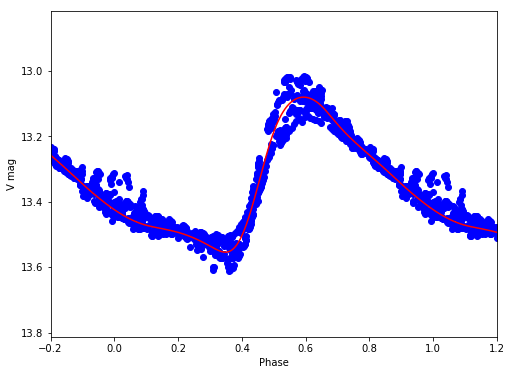

V 13.3346505328 0.474313972522
V23
/Volumes/Annie/CRRP/NGC6121/lcvs/V23.phased


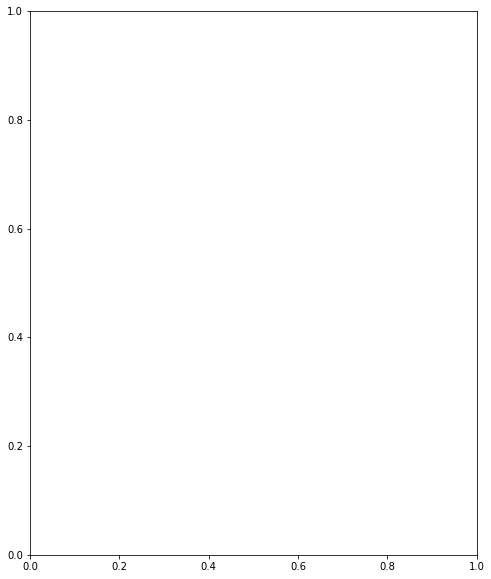

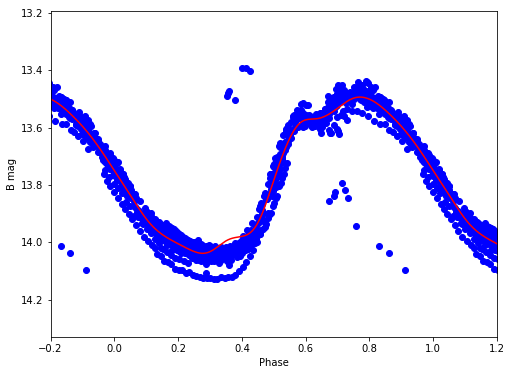

B 13.7490752572 0.544702412844


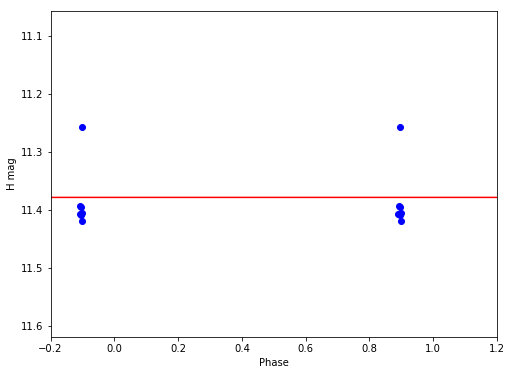

H 11.3788035102 3.36826922265e-06


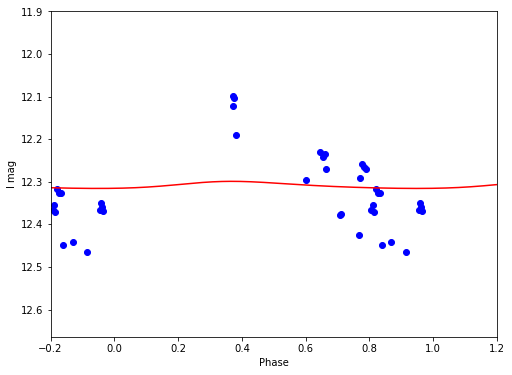

I 12.3084738144 0.0166571500206


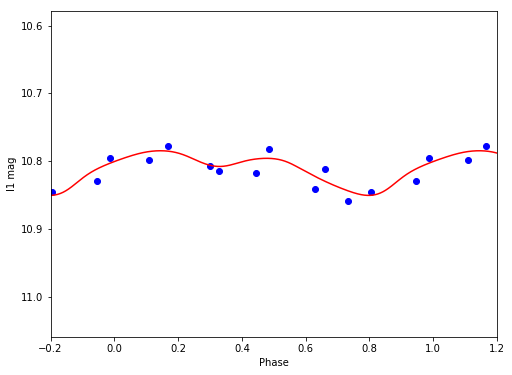

I1 10.8105473453 0.0658421370173


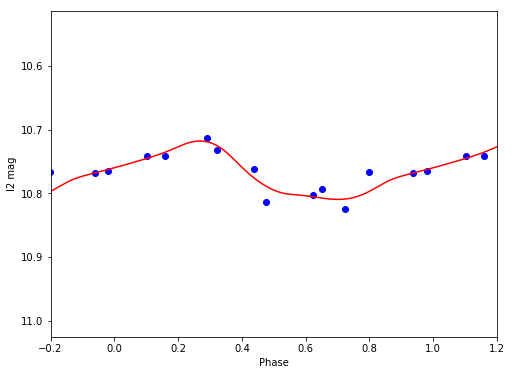

I2 10.7683069989 0.0916282873963


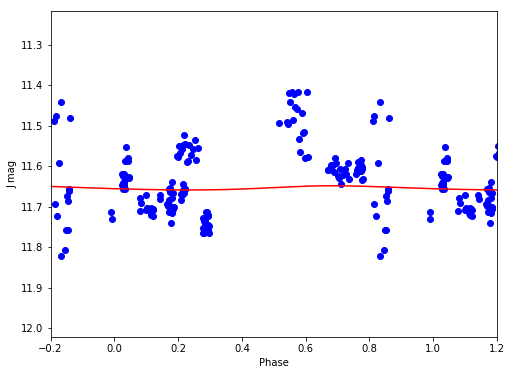

J 11.6538919283 0.0103617708574


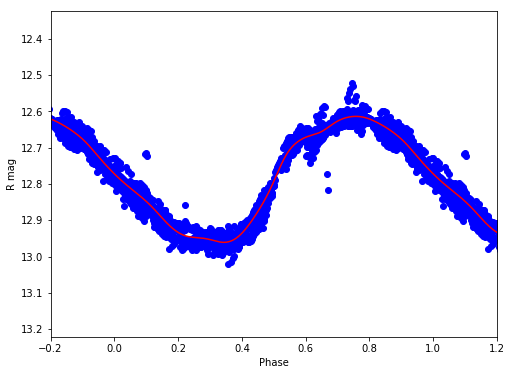

R 12.7758041775 0.347216684498


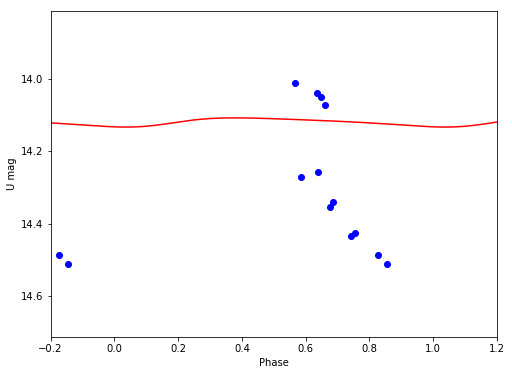

U 14.1187395704 0.0254516760248


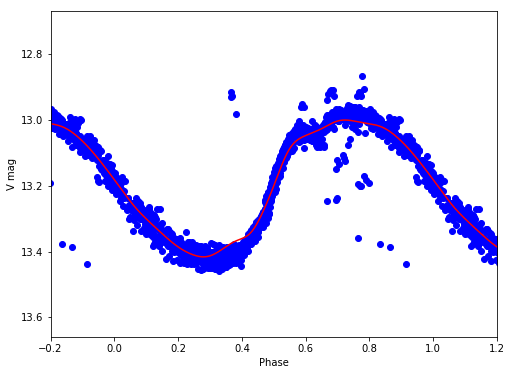

V 13.1854180583 0.416105628393
V24
/Volumes/Annie/CRRP/NGC6121/lcvs/V24.phased


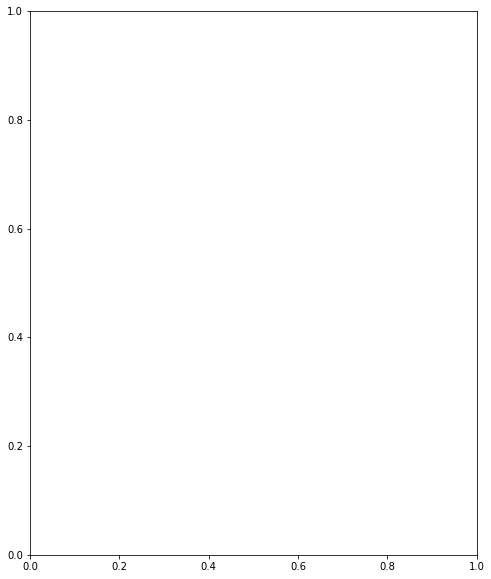

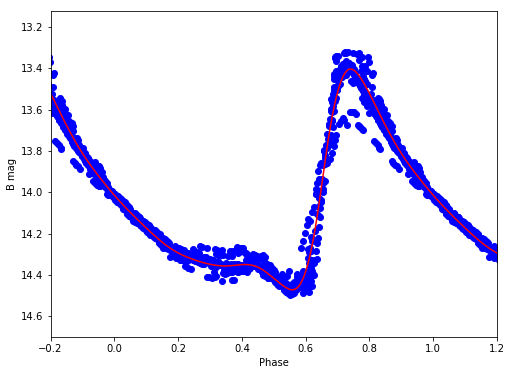

B 14.0298872366 1.06718965491


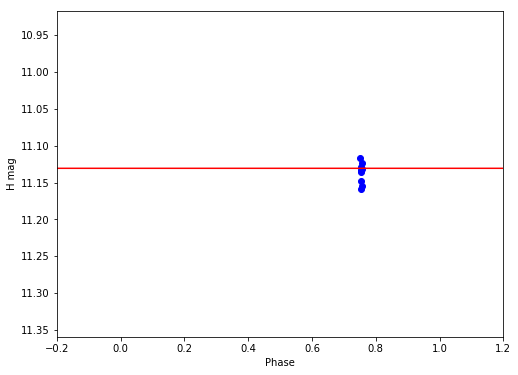

H 11.1306667684 1.12864240354e-05


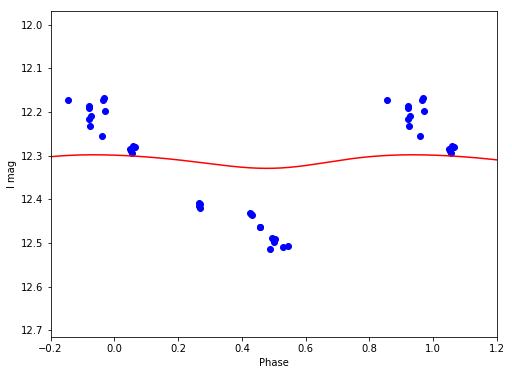

I 12.312070798 0.0310360350938


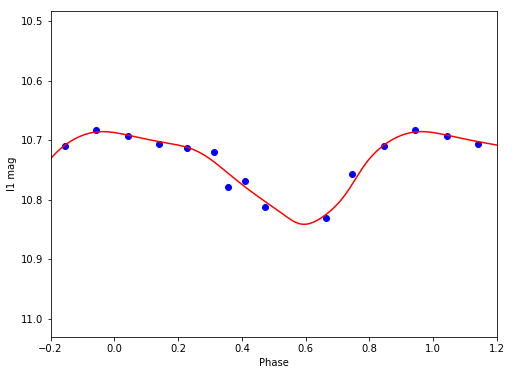

I1 10.7467878817 0.155720020869


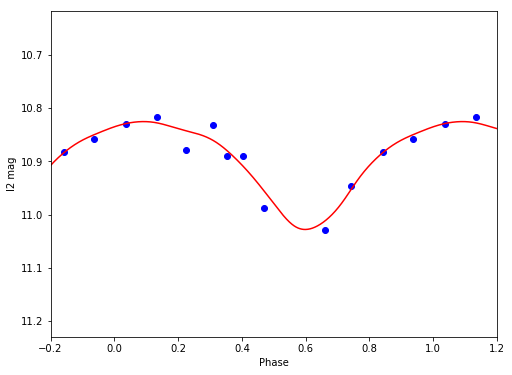

I2 10.9002990232 0.20243520289


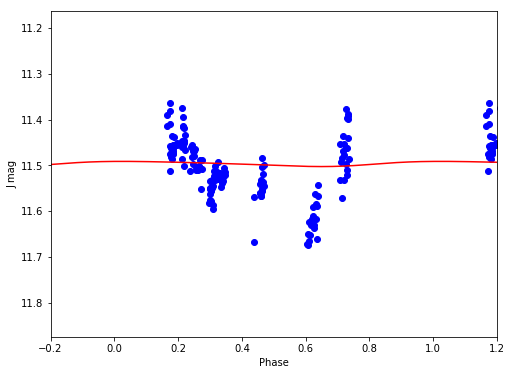

J 11.4962516705 0.0112681942212


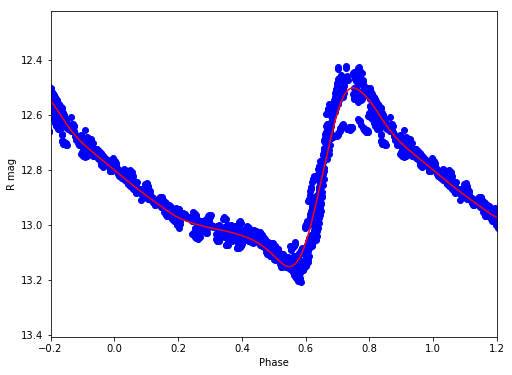

R 12.8553418688 0.648677011171


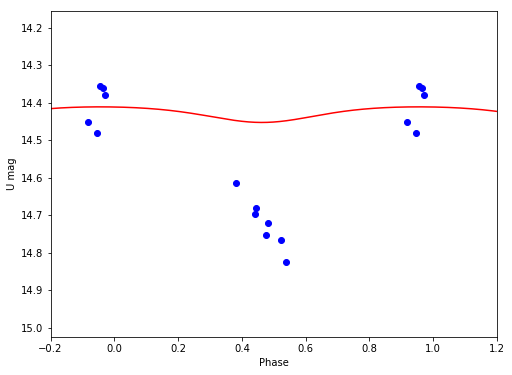

U 14.4281505394 0.0415292866372


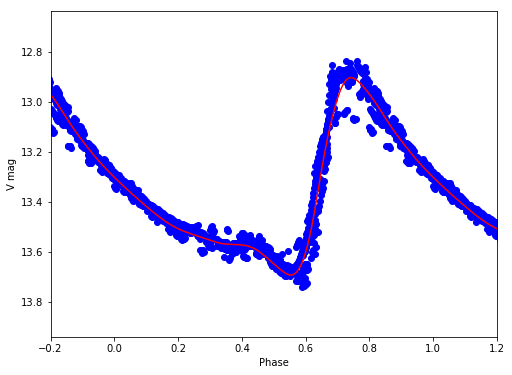

V 13.3430355385 0.790948751501
V25
/Volumes/Annie/CRRP/NGC6121/lcvs/V25.phased


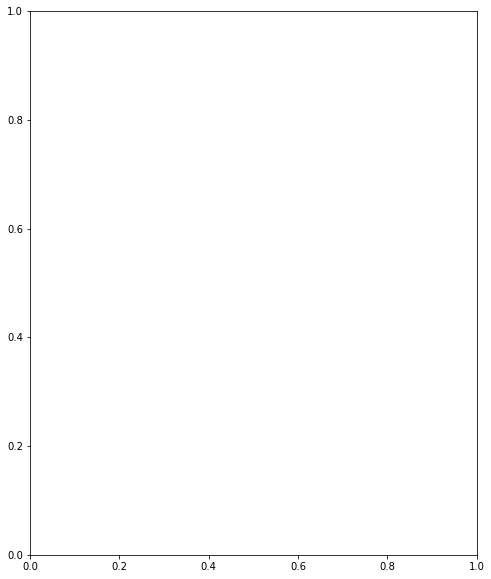

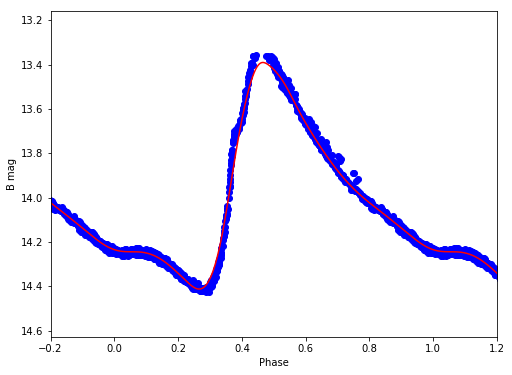

B 13.9484167146 1.02271718651


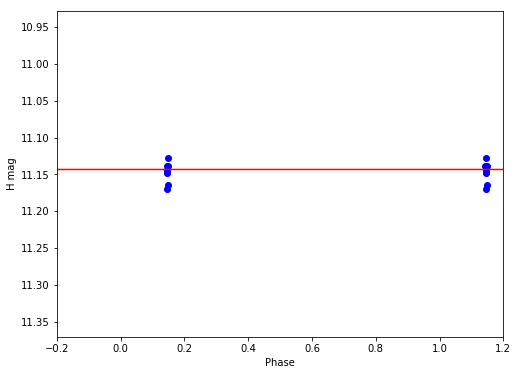

H 11.1432469961 1.94674827974e-05


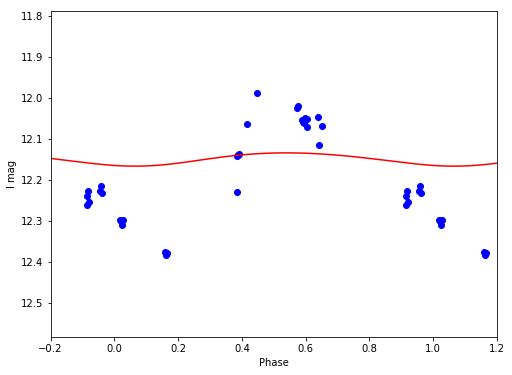

I 12.1491559044 0.0323629606214


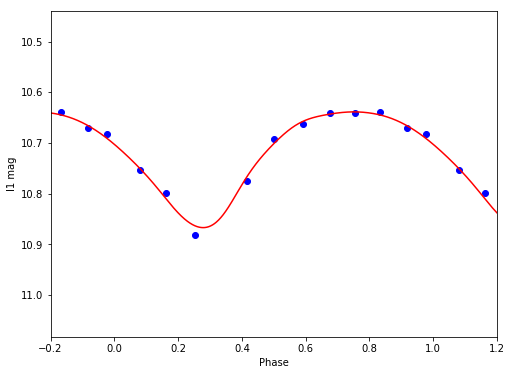

I1 10.7219871399 0.228182615016


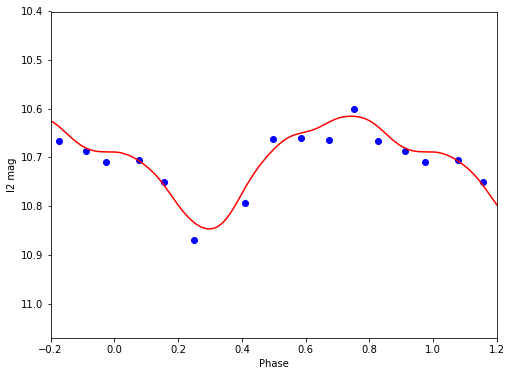

I2 10.7054618925 0.231099219277


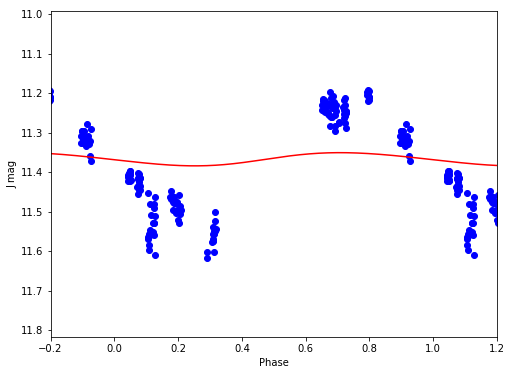

J 11.367003638 0.033419595939


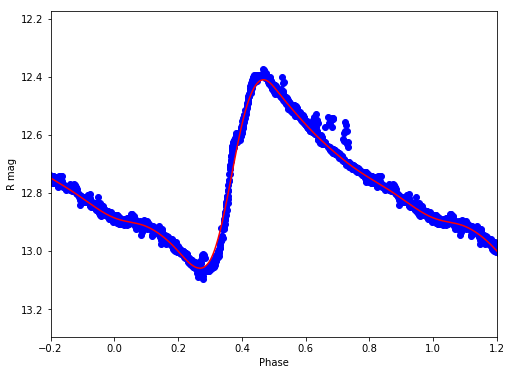

R 12.745021156 0.648800909439


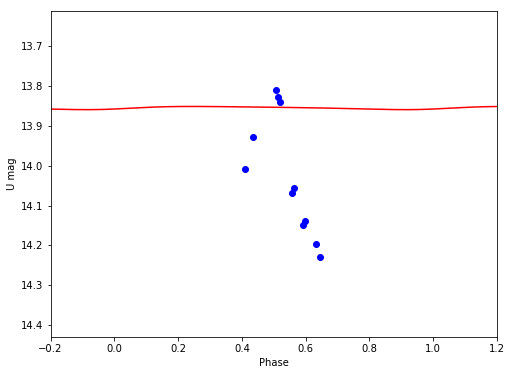

U 13.8543504939 0.00804630614785


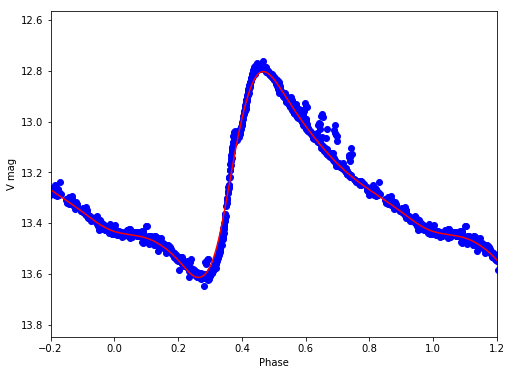

V 13.2361052101 0.811587393863
V26
/Volumes/Annie/CRRP/NGC6121/lcvs/V26.phased


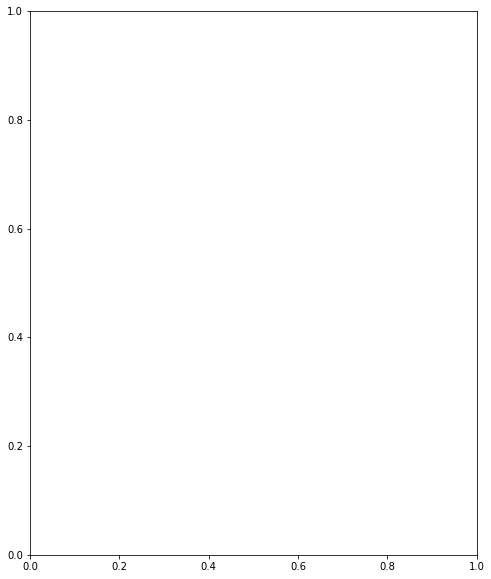

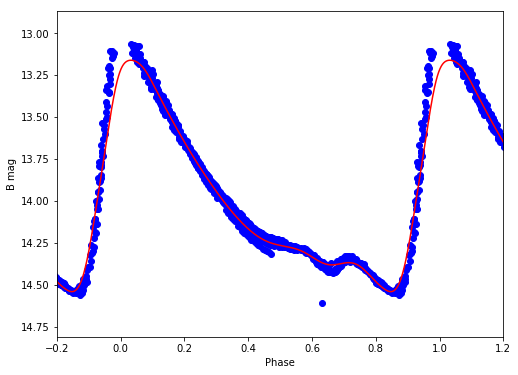

B 13.9101549436 1.37861586193


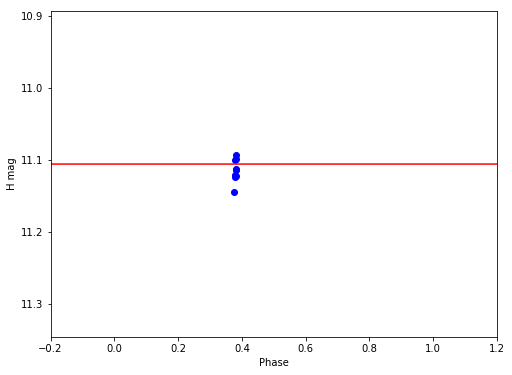

H 11.1056128952 1.07137204779e-05


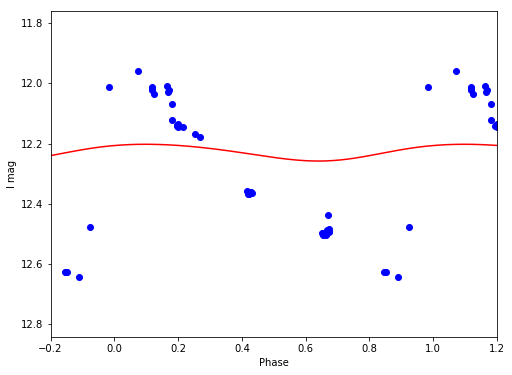

I 12.2280904307 0.0558216804178


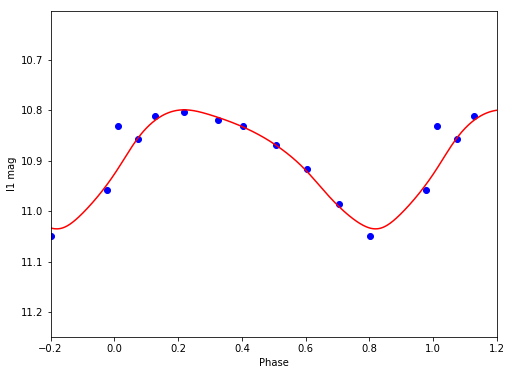

I1 10.8986768913 0.235799492969


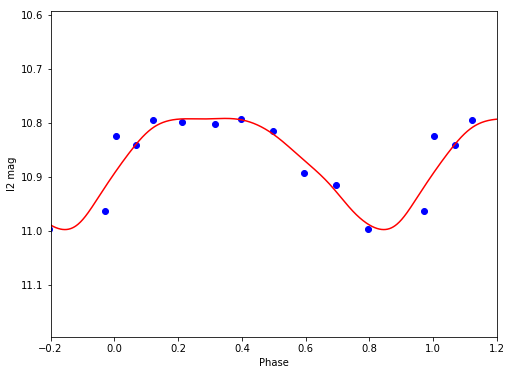

I2 10.8655274424 0.205465708912


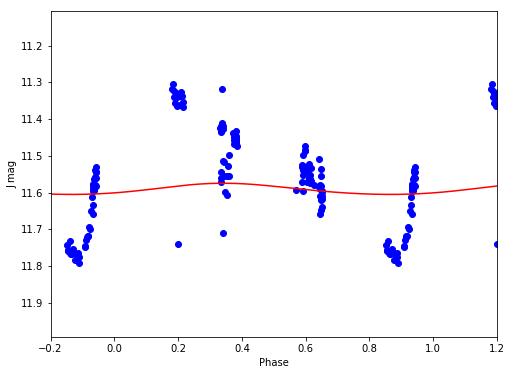

J 11.5906619131 0.0304062807039


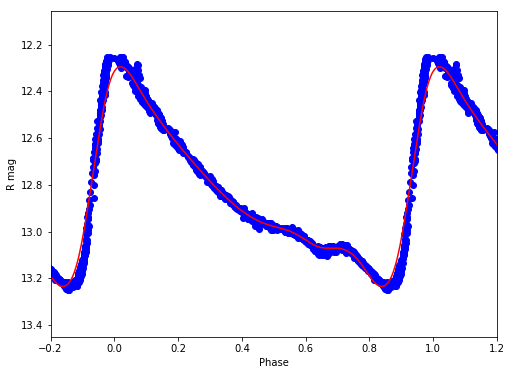

R 12.8024811212 0.93935880629


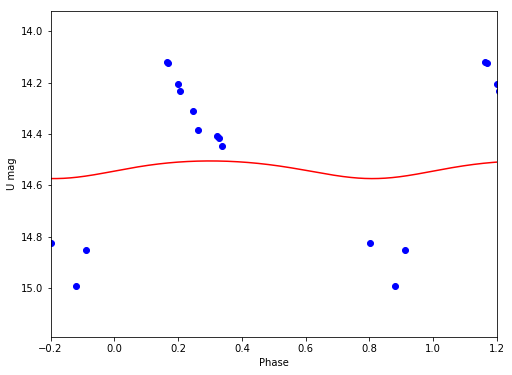

U 14.5356188778 0.0687964509365


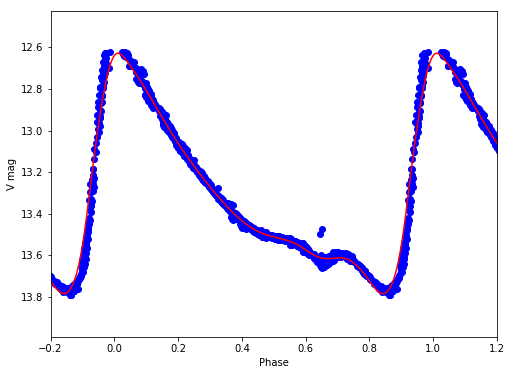

V 13.2606191166 1.15492723873
V27
/Volumes/Annie/CRRP/NGC6121/lcvs/V27.phased


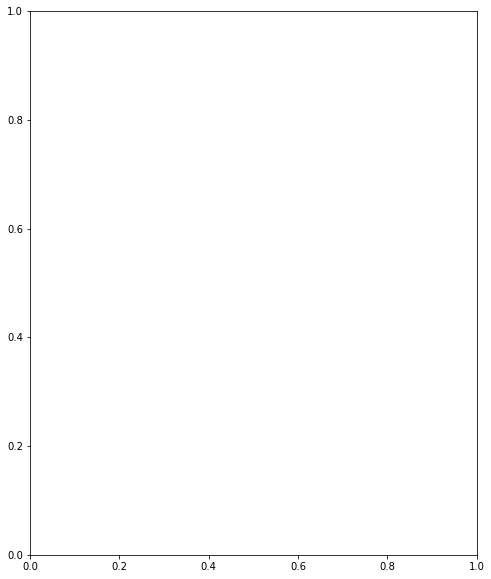

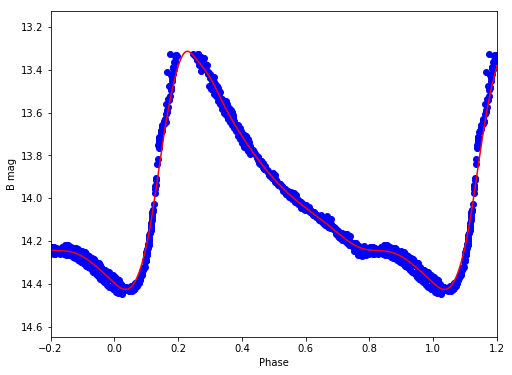

B 13.9233571748 1.10964172863


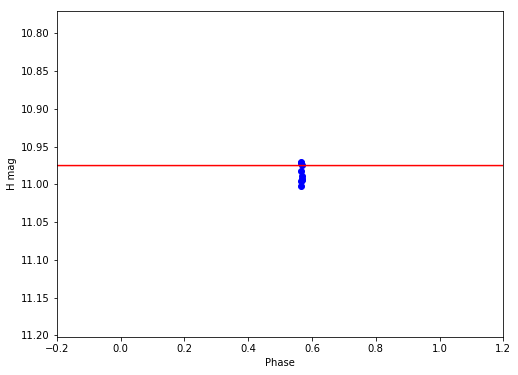

H 10.9752033487 1.32065781244e-06


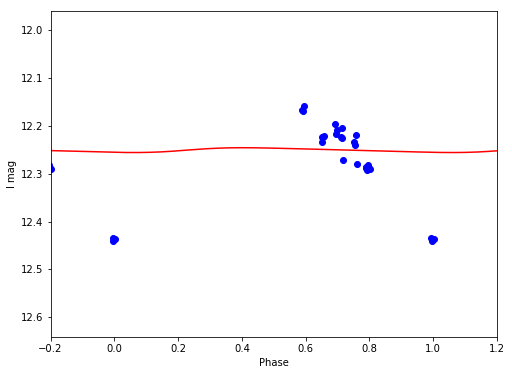

I 12.2505590283 0.0100788133312


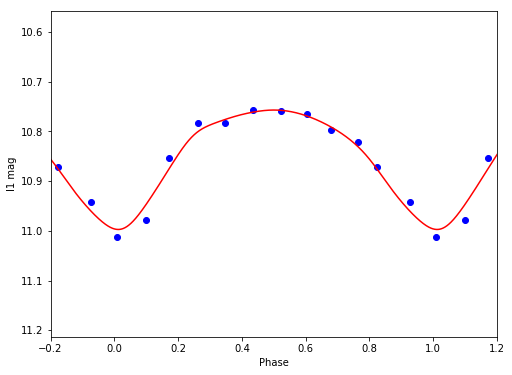

I1 10.8431589475 0.240200022071


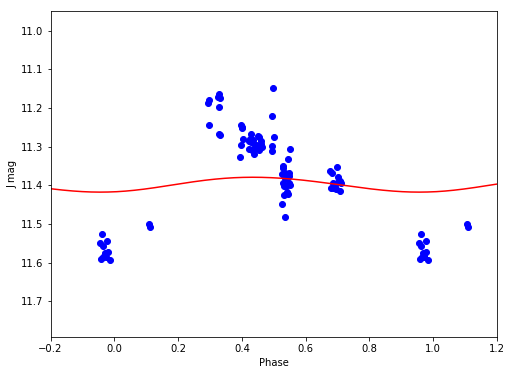

J 11.397790063 0.0384638843742


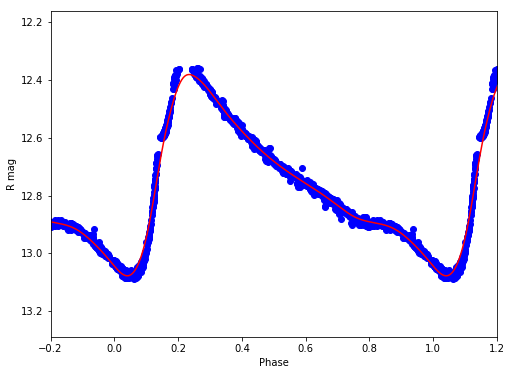

R 12.7330227403 0.69678199015


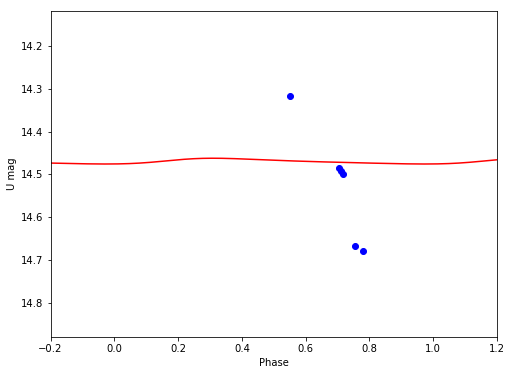

U 14.4698017258 0.0134670018114


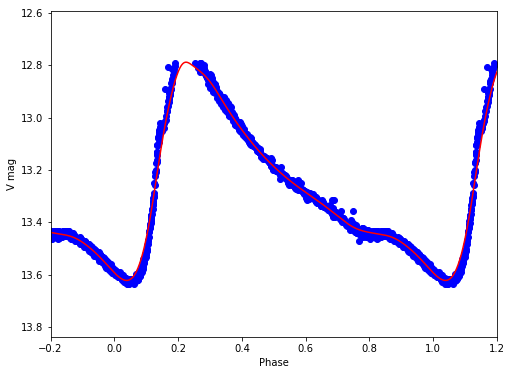

V 13.2260993288 0.833101773355
V28
/Volumes/Annie/CRRP/NGC6121/lcvs/V28.phased


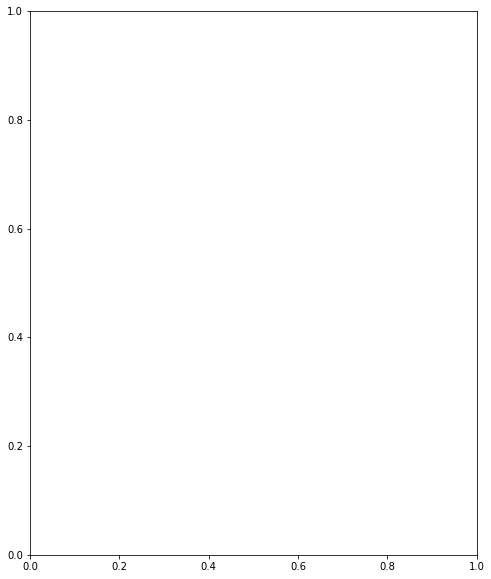

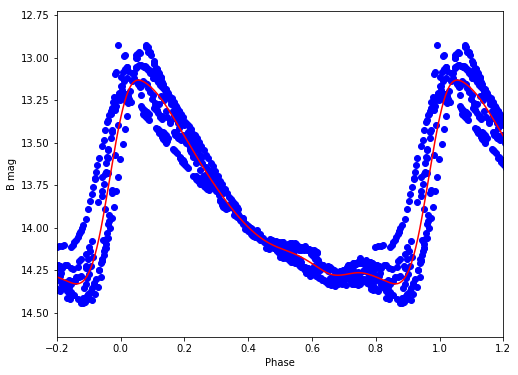

B 13.8137953662 1.19829567779


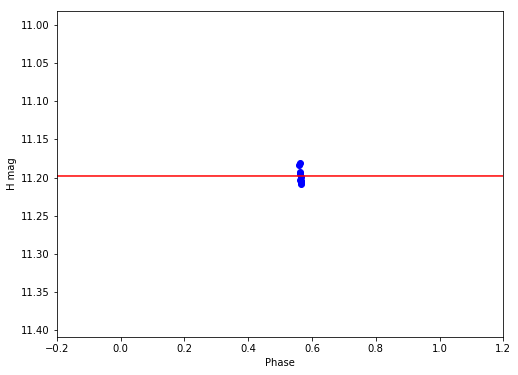

H 11.1979610667 4.83017372694e-05


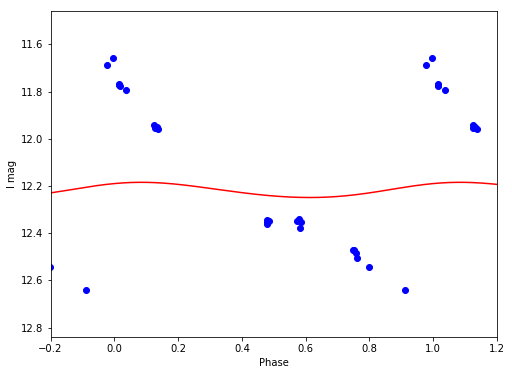

I 12.2175710768 0.0644010173386


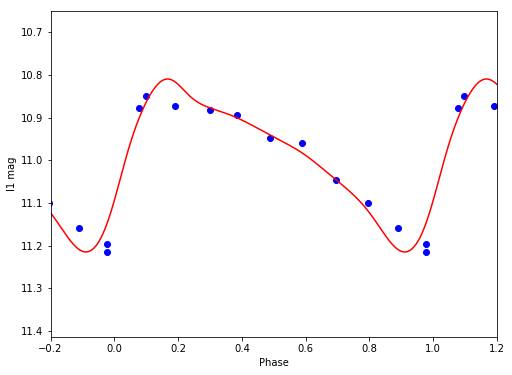

I1 10.981244449 0.405677154754


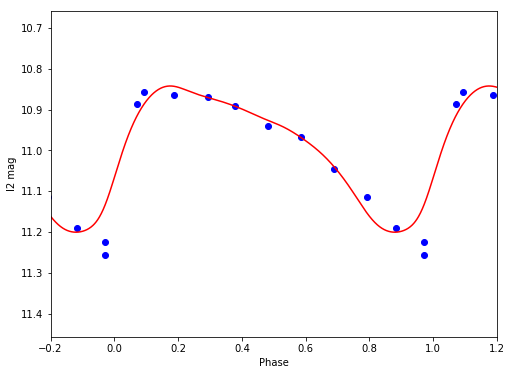

I2 10.9814392239 0.358628821052


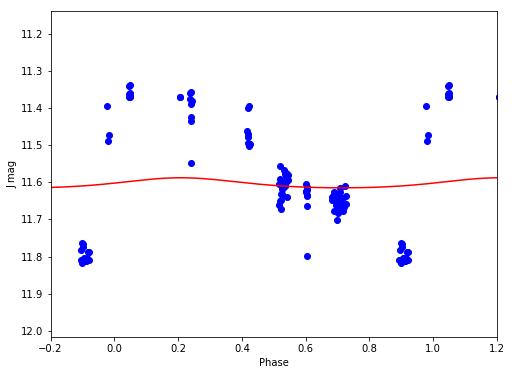

J 11.6035348347 0.0270614498484


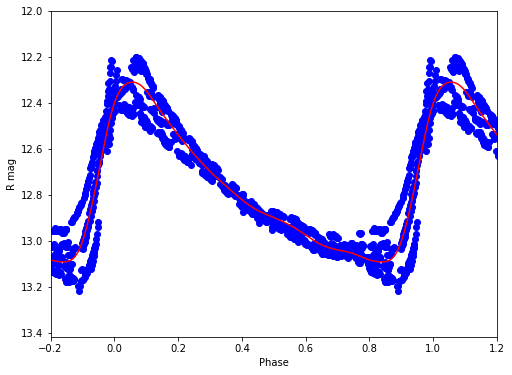

R 12.7512567456 0.781275790784


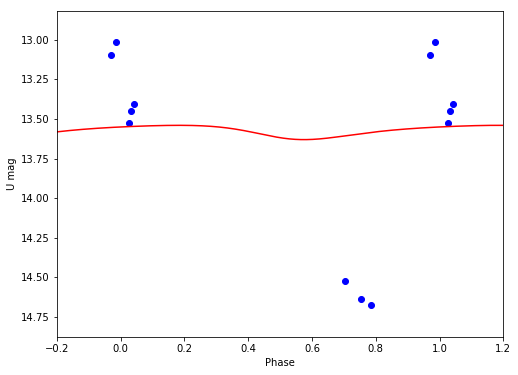

U 13.5754465154 0.0902085795622


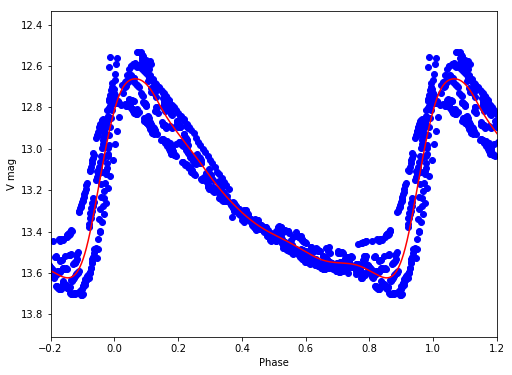

V 13.1987856795 0.961102432343
V29
/Volumes/Annie/CRRP/NGC6121/lcvs/V29.phased


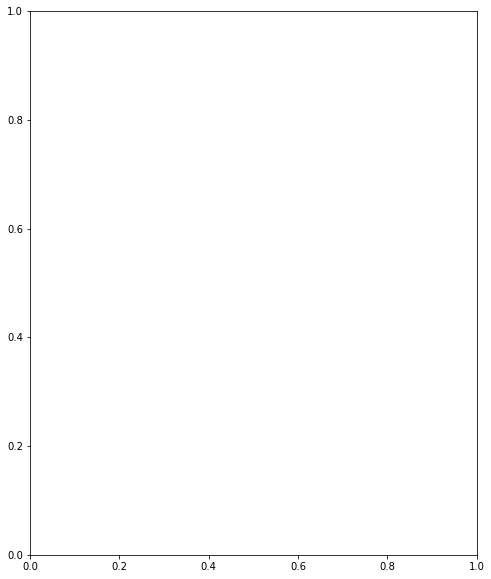

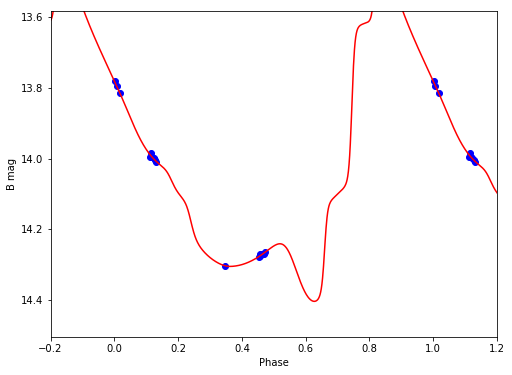

B 13.975779246 1.16735880297


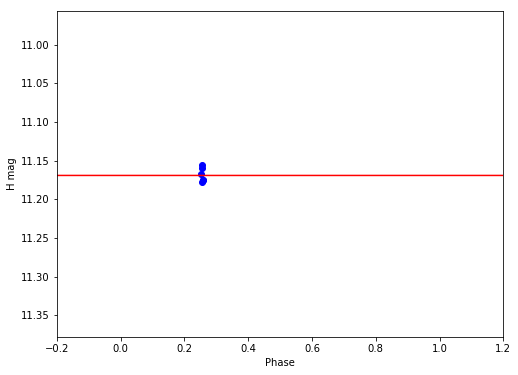

H 11.169228075 4.00062286126e-05


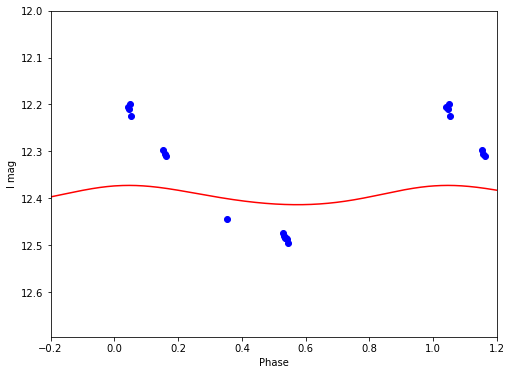

I 12.3942400779 0.0410829101614


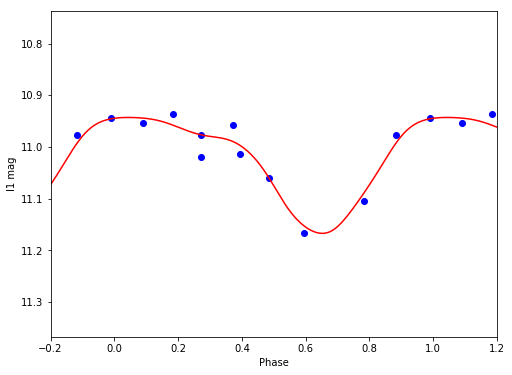

I1 11.023658889 0.224231385478


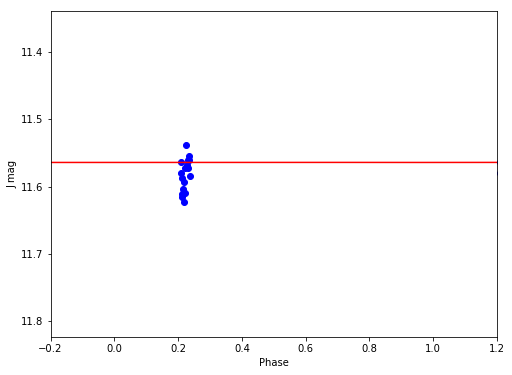

J 11.564207125 0.000172559095663


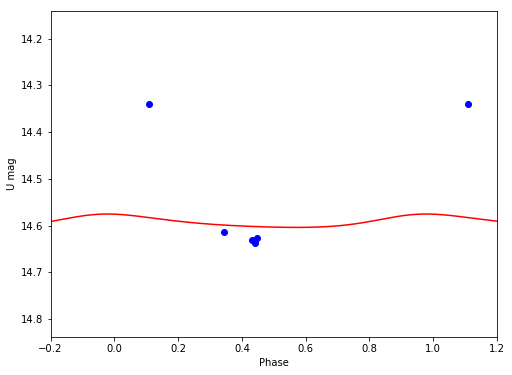

U 14.5923884552 0.0286554329249


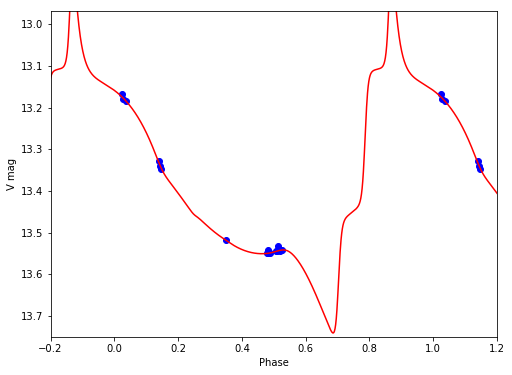

V 13.3679447901 0.886085281125
V30
/Volumes/Annie/CRRP/NGC6121/lcvs/V30.phased


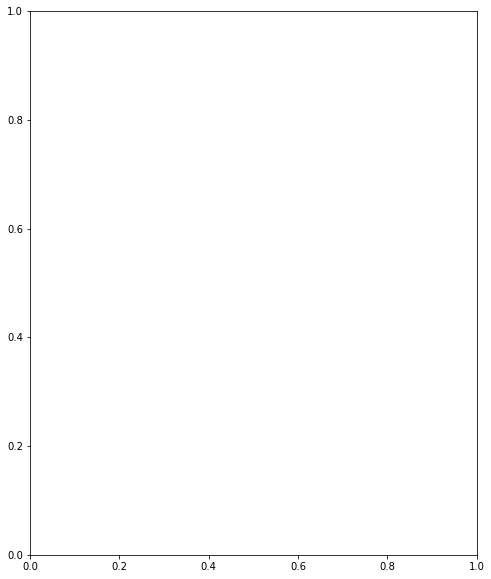

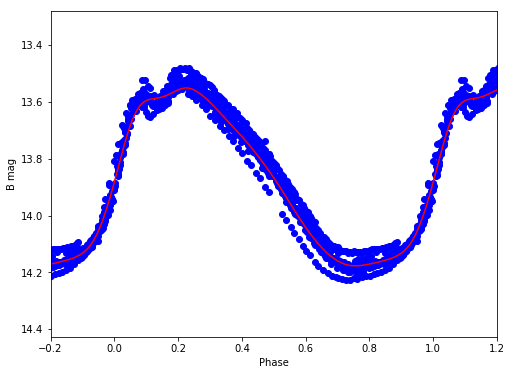

B 13.8484588025 0.624987363227


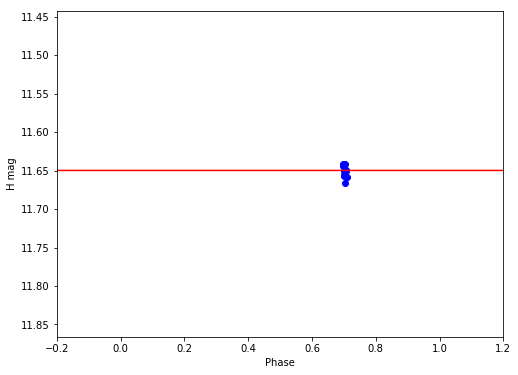

H 11.6497316928 1.82108580162e-05


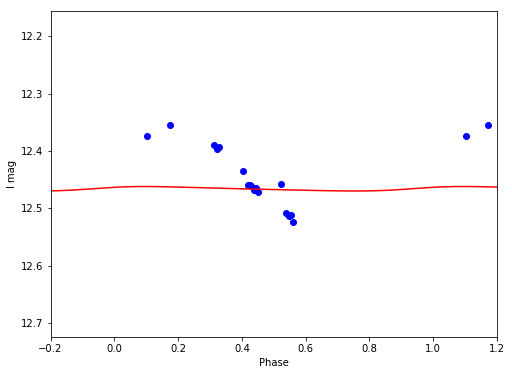

I 12.4659284498 0.00786588310947


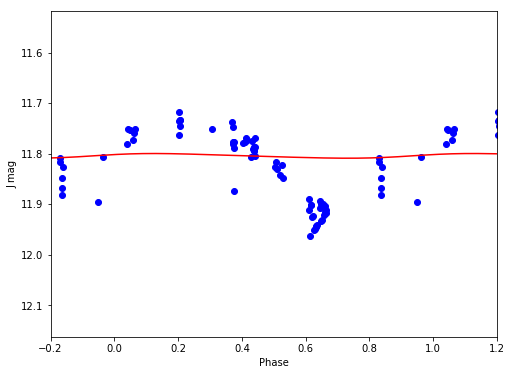

J 11.8043006744 0.00927769053542


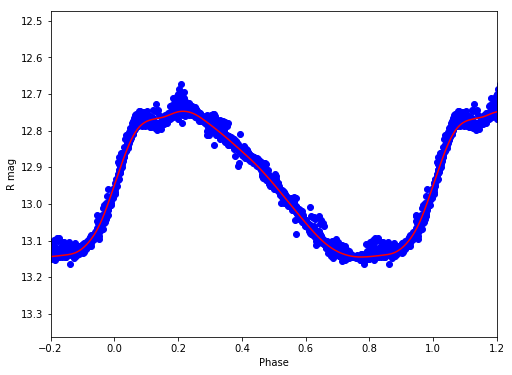

R 12.9406804566 0.398037136802


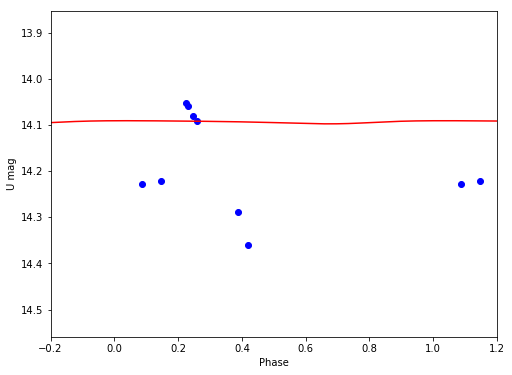

U 14.0932945495 0.00679638290257


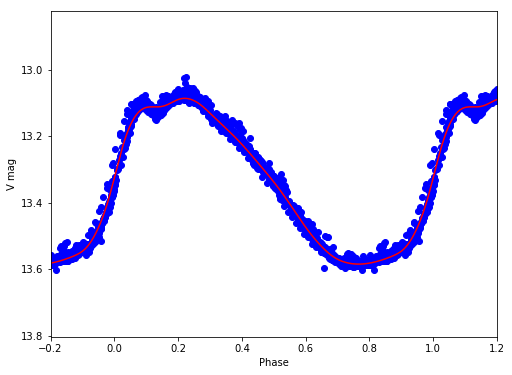

V 13.3234973081 0.49806540936
V31
/Volumes/Annie/CRRP/NGC6121/lcvs/V31.phased


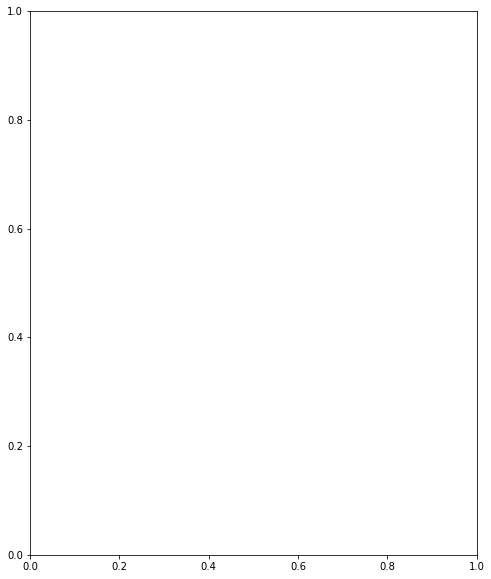

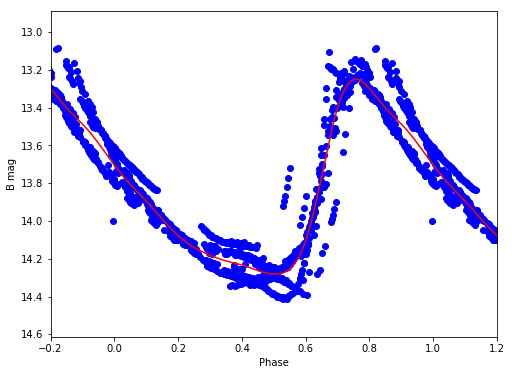

B 13.8089521956 1.03093130725


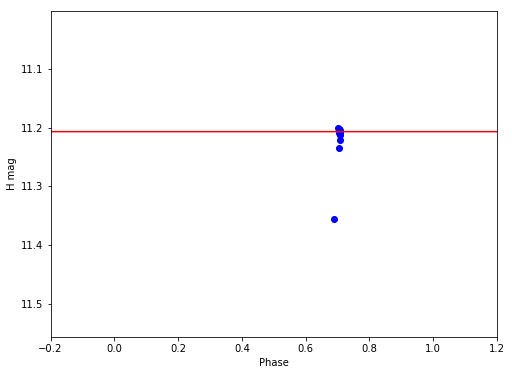

H 11.2068835789 5.50342843653e-06


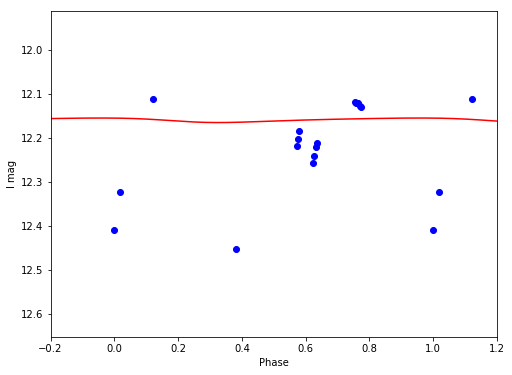

I 12.159066886 0.010265261221


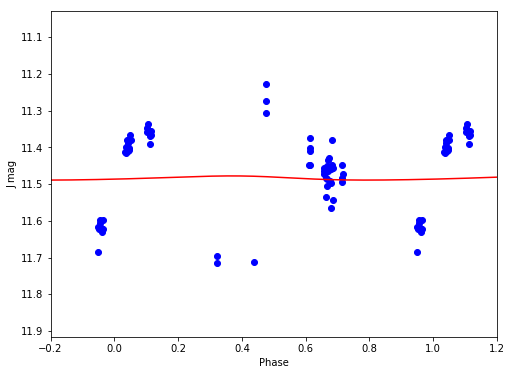

J 11.4837312296 0.0113557066805


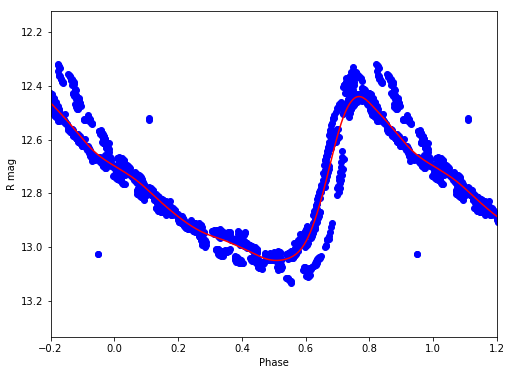

R 12.7820593674 0.61008665468


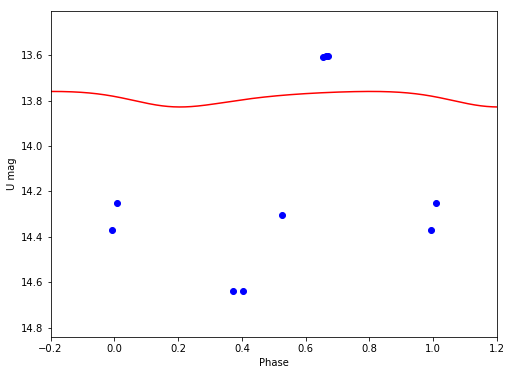

U 13.7864091246 0.0684557358663


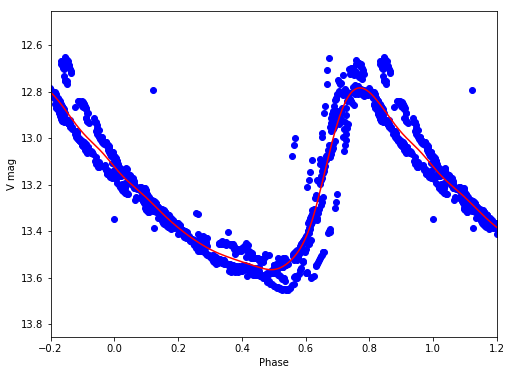

V 13.2160164007 0.782563969866
V32
/Volumes/Annie/CRRP/NGC6121/lcvs/V32.phased


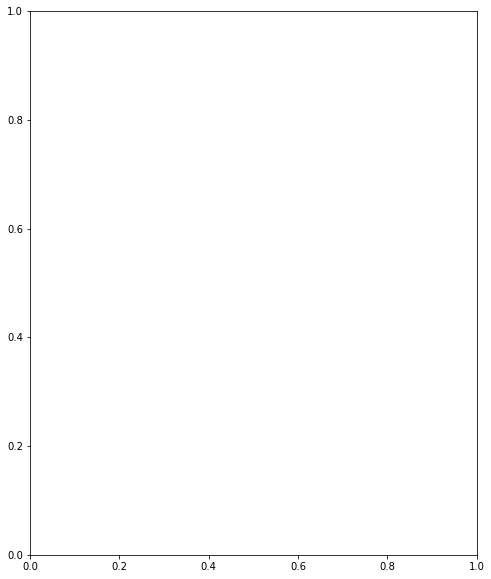

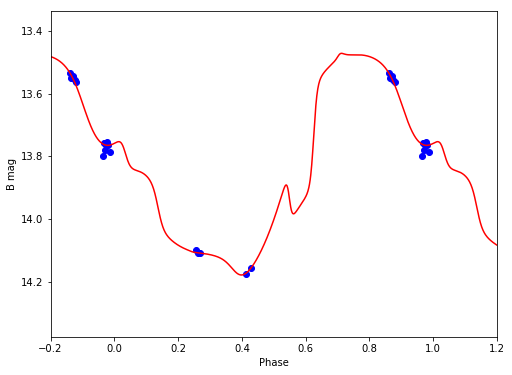

B 13.8193467761 0.707467319287


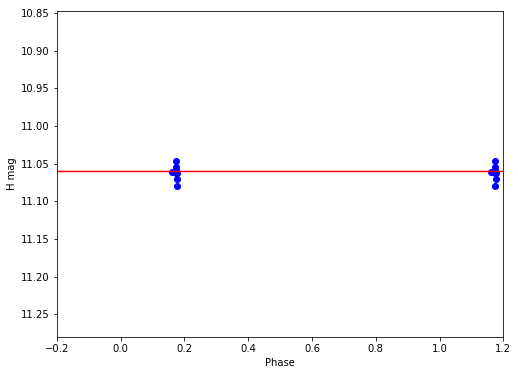

H 11.0605340525 1.82011383707e-05


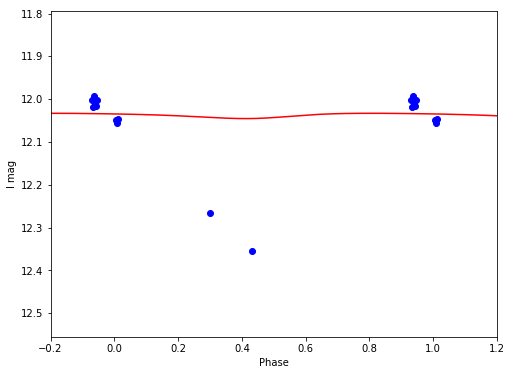

I 12.0376149941 0.0123808790426


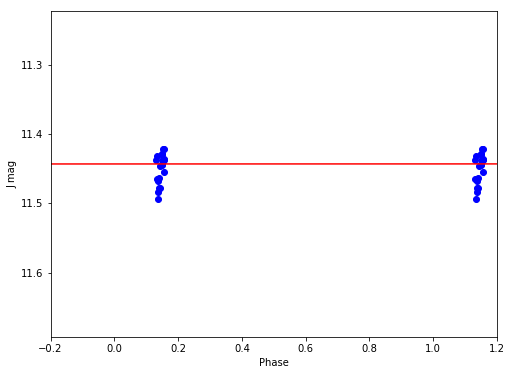

J 11.4428107501 0.000147946073589


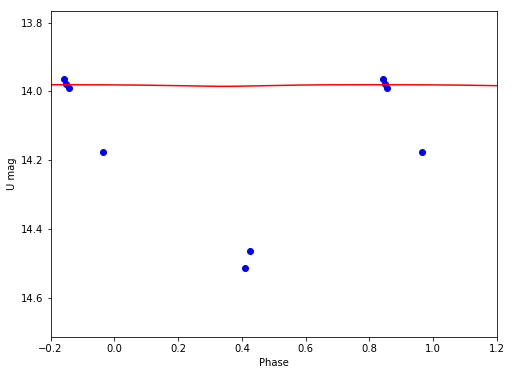

U 13.9821953593 0.00466244926458


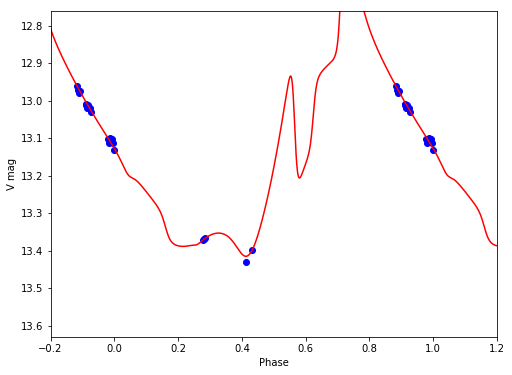

V 13.099771362 0.95262283905
V33
/Volumes/Annie/CRRP/NGC6121/lcvs/V33.phased


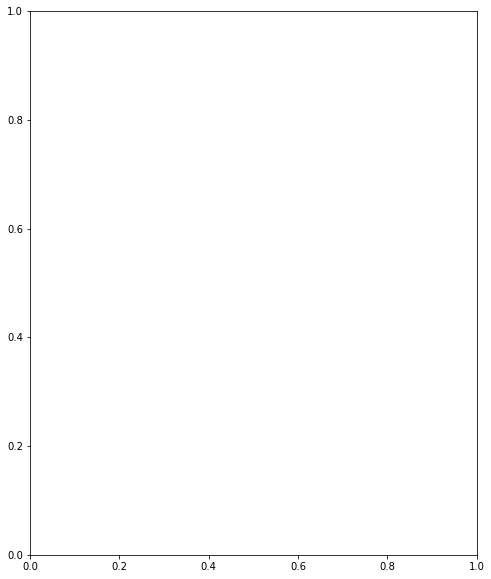

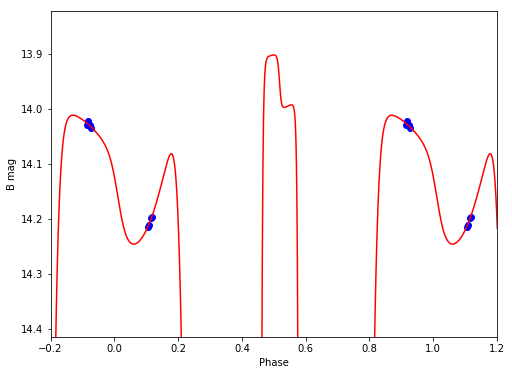

B 14.7469211631 18.7551063663


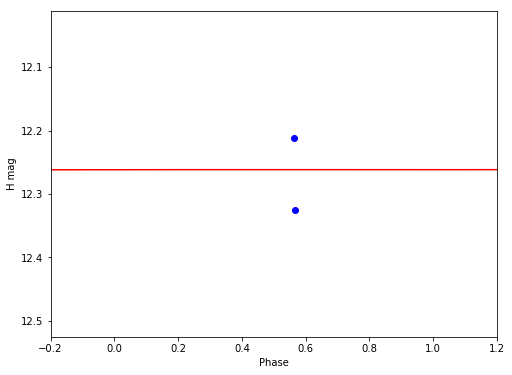

H 12.2616862019 0.000232568697049


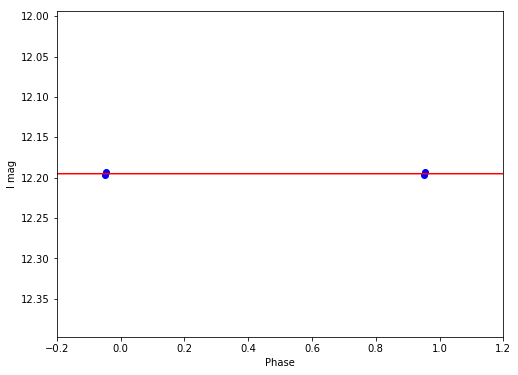

I 12.1949999975 1.12201674547e-05


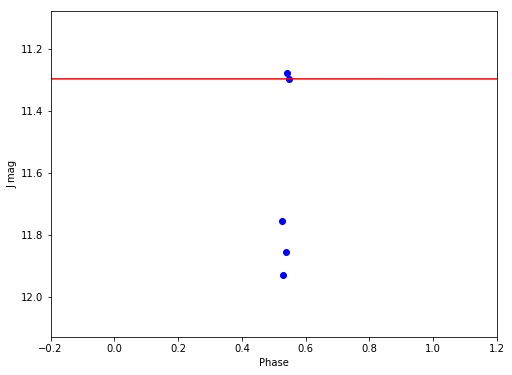

J 11.2951579299 0.000130724850266


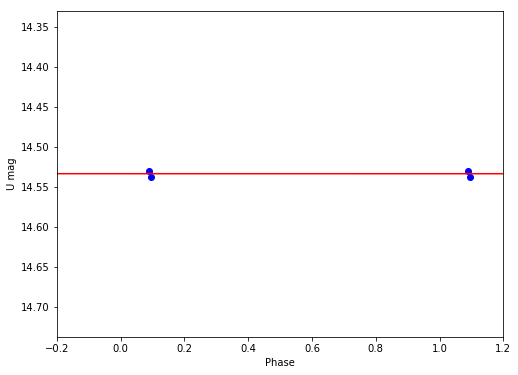

U 14.5334999918 4.13185918671e-05


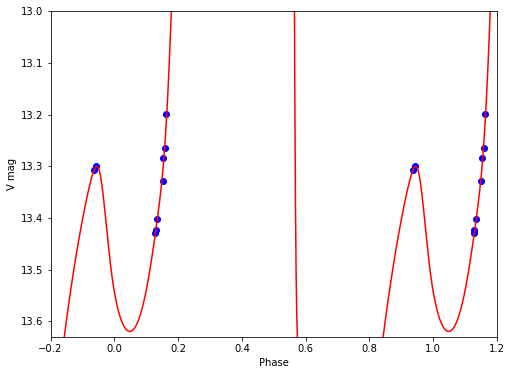

V -5.88181582836 25.3694206565
V34
/Volumes/Annie/CRRP/NGC6121/lcvs/V34.phased


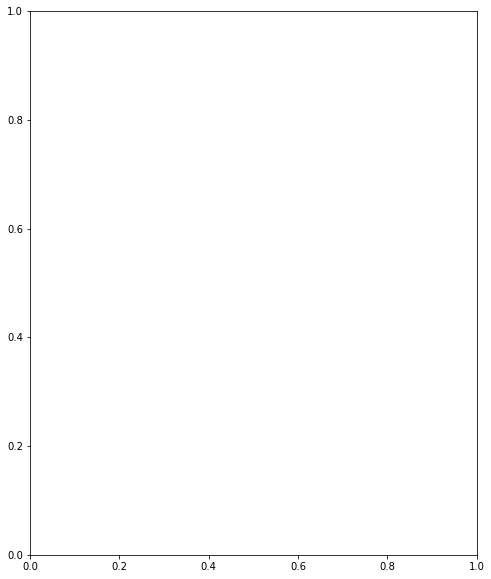

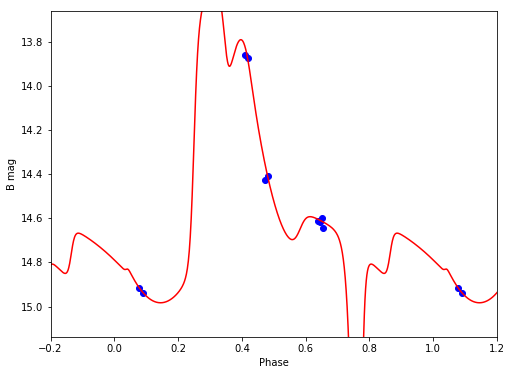

B 14.4889393275 3.3726243257


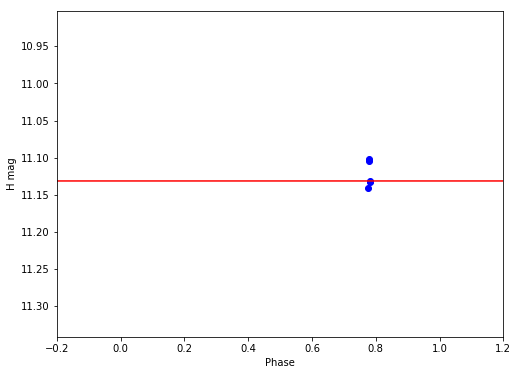

H 11.1312468955 2.03123396361e-05


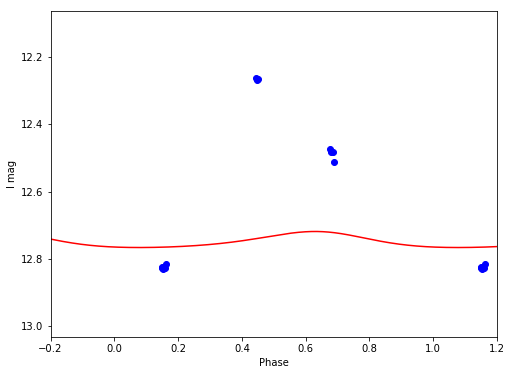

I 12.7464095026 0.0476589452665


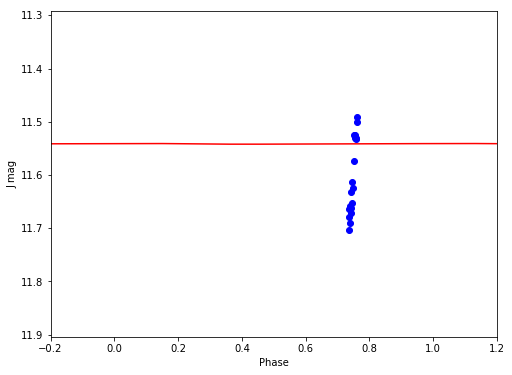

J 11.5413637576 0.00126760769872
V35
/Volumes/Annie/CRRP/NGC6121/lcvs/V35.phased


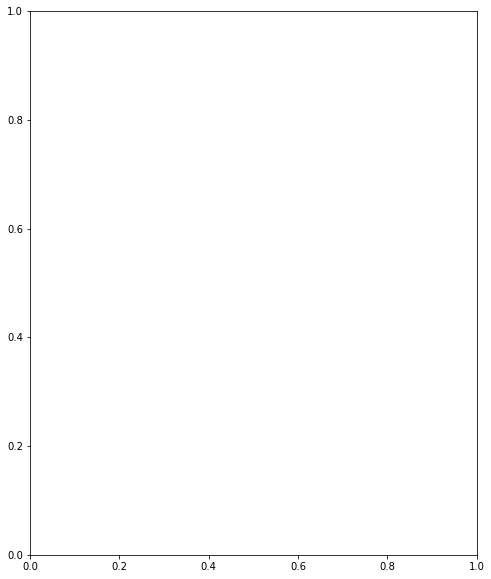

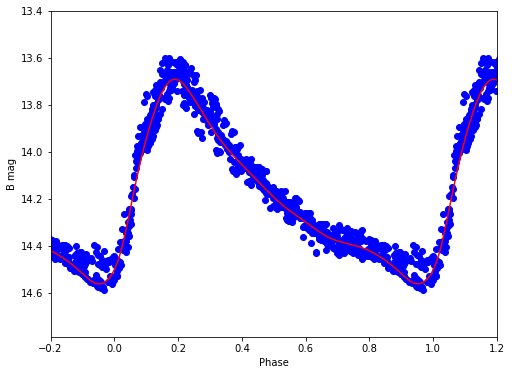

B 14.1553948353 0.871043357625


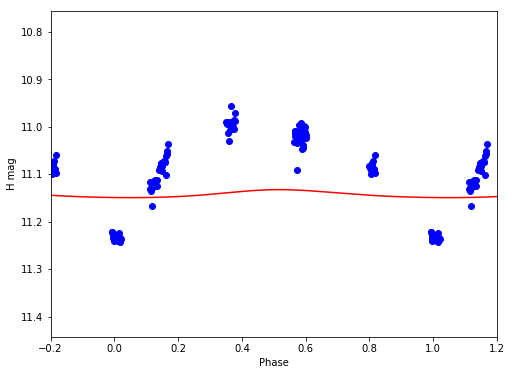

H 11.141755991 0.0168524217948


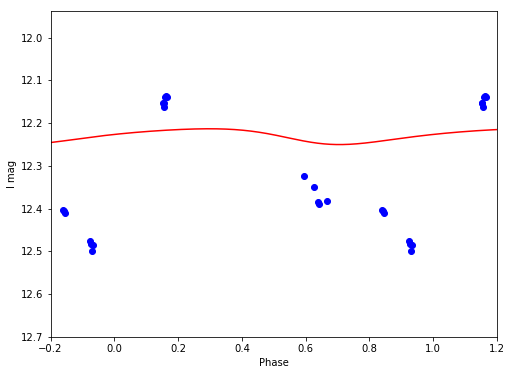

I 12.2292642701 0.0369411747601


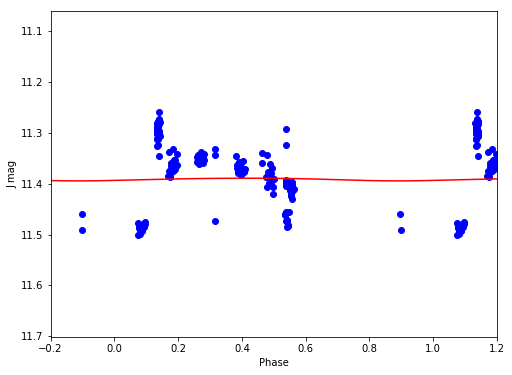

J 11.3916125041 0.00526672234538


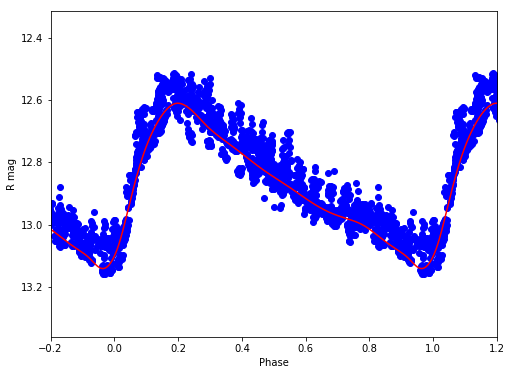

R 12.8645437145 0.530745423836


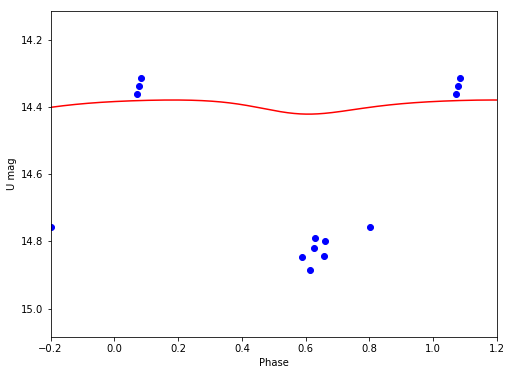

U 14.3960916172 0.0419937124347


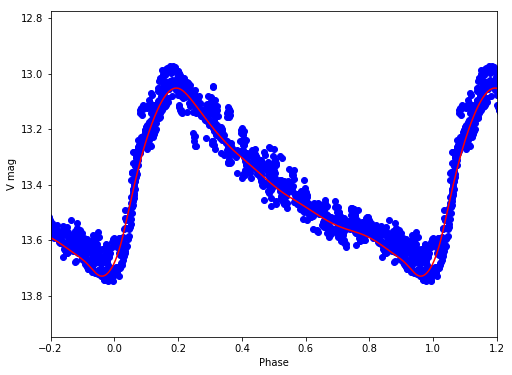

V 13.3956578482 0.677018673135
V36
/Volumes/Annie/CRRP/NGC6121/lcvs/V36.phased


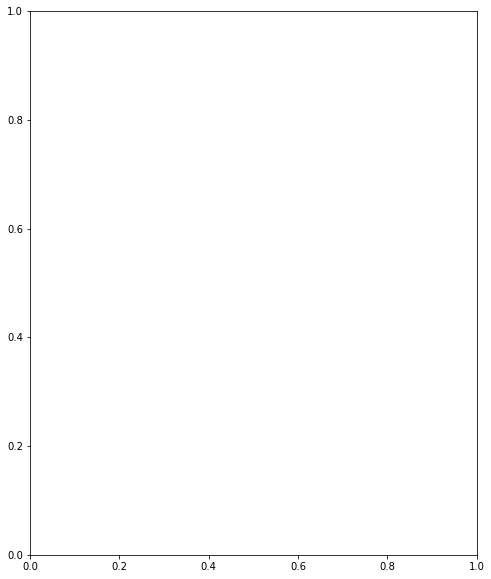

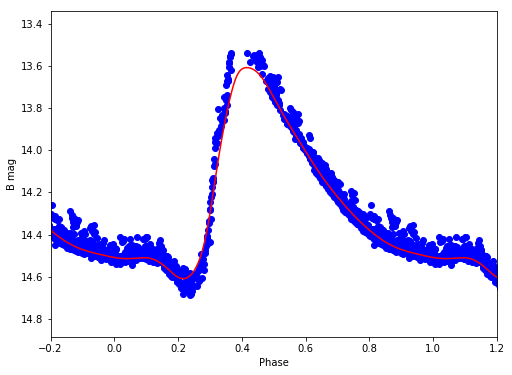

B 14.1841210813 0.999794580471


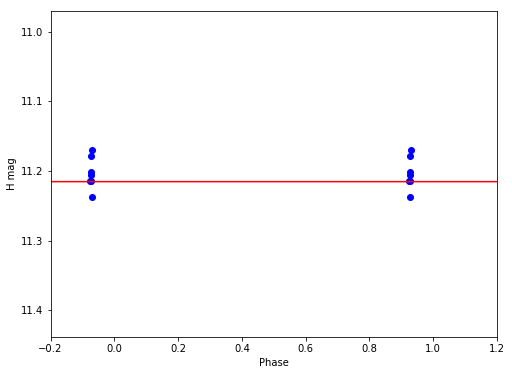

H 11.2153815382 2.54694349593e-05


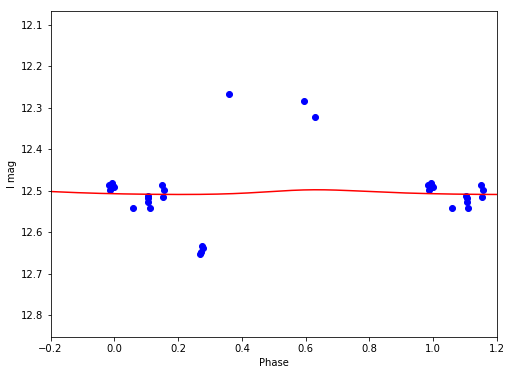

I 12.5044250185 0.0113223951342


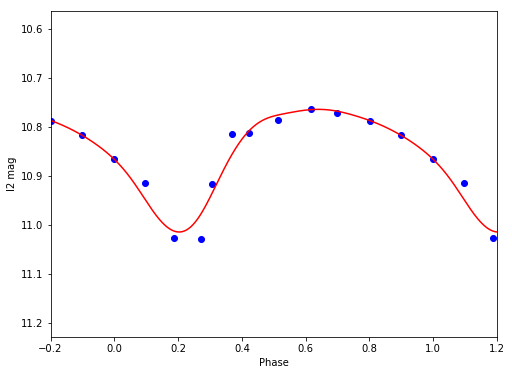

I2 10.847938164 0.250425921903


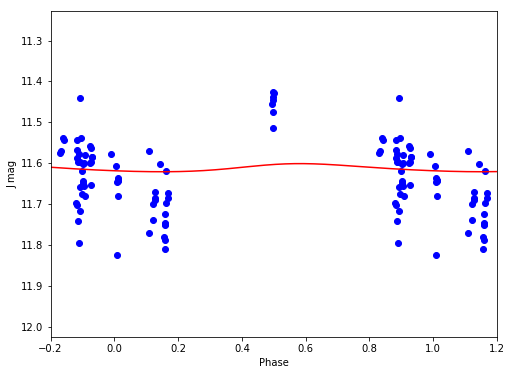

J 11.6117681527 0.019866883726


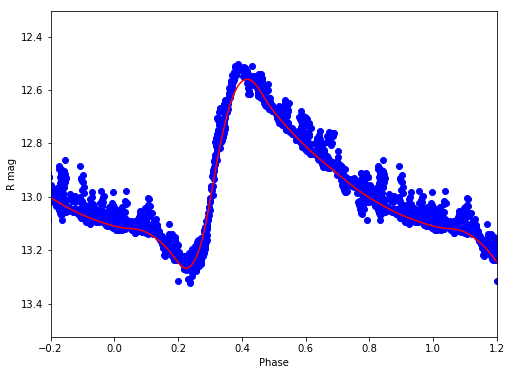

R 12.9348202537 0.707612985649


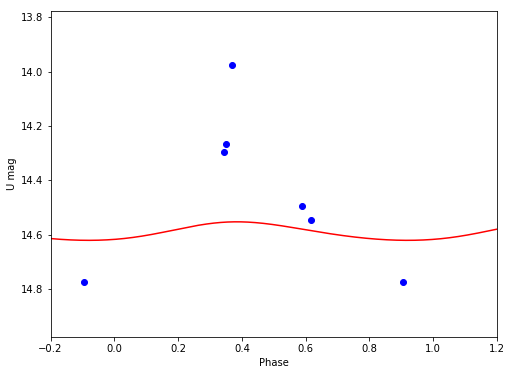

U 14.588900495 0.0681849670266


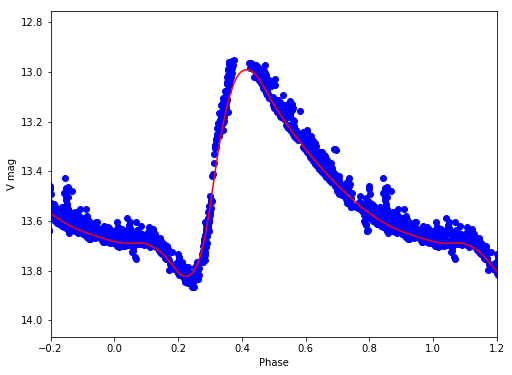

V 13.4515571836 0.832359097278
V37
/Volumes/Annie/CRRP/NGC6121/lcvs/V37.phased


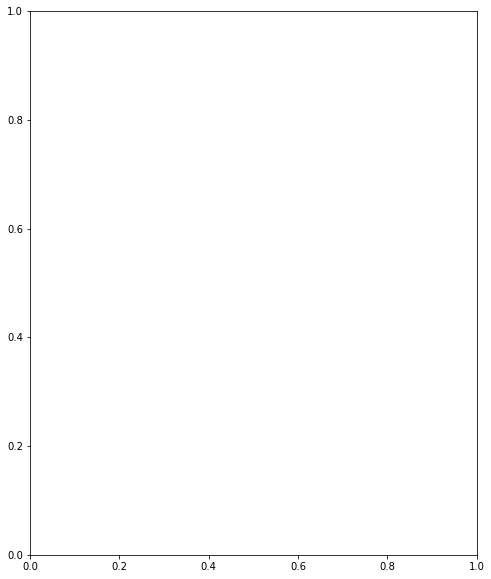

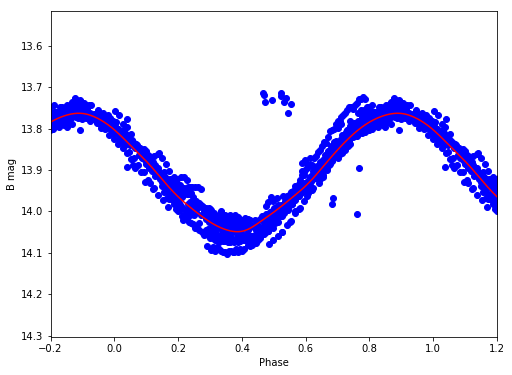

B 13.9013701274 0.286155819953


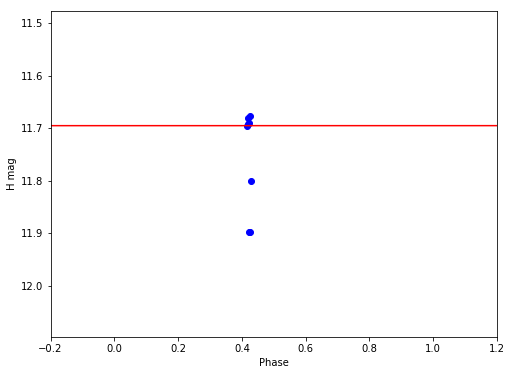

H 11.69498761 4.67229539272e-05


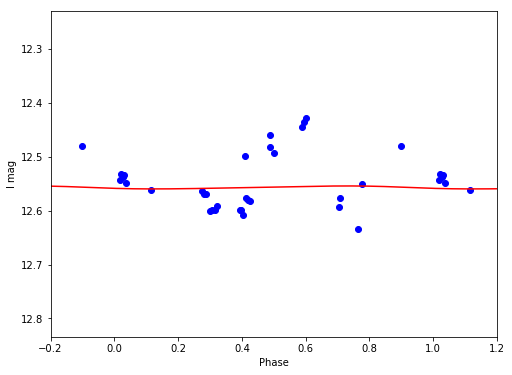

I 12.5570136976 0.00550958741984


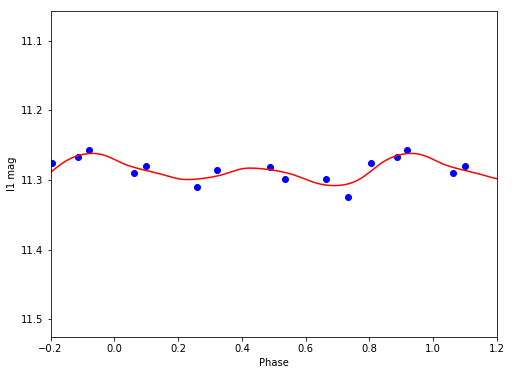

I1 11.2879827431 0.0461414069251


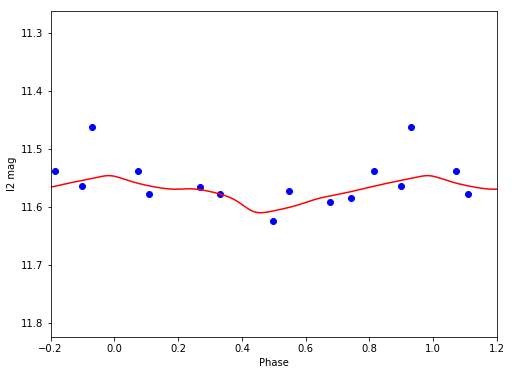

I2 11.5742554707 0.0637703430792


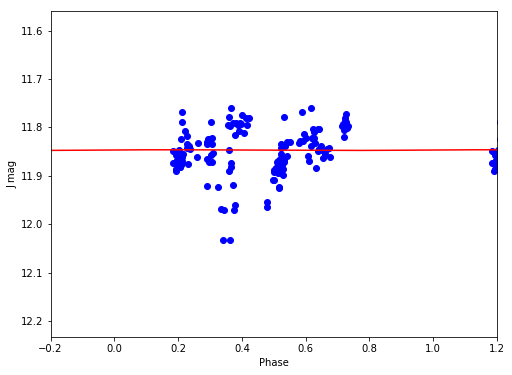

J 11.8467295024 0.00130356045594


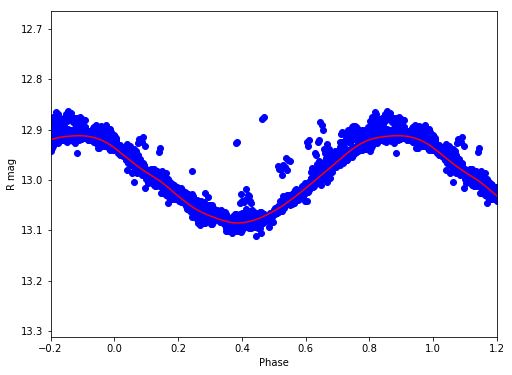

R 12.9964541201 0.173136448543


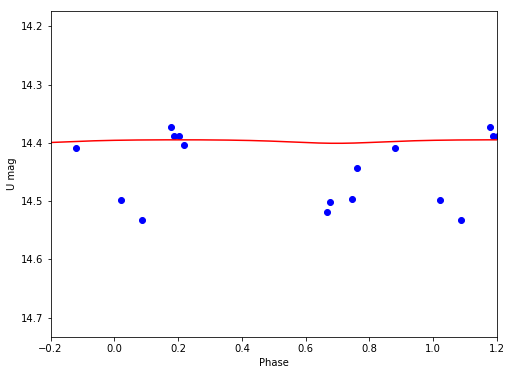

U 14.397000978 0.00598103880688


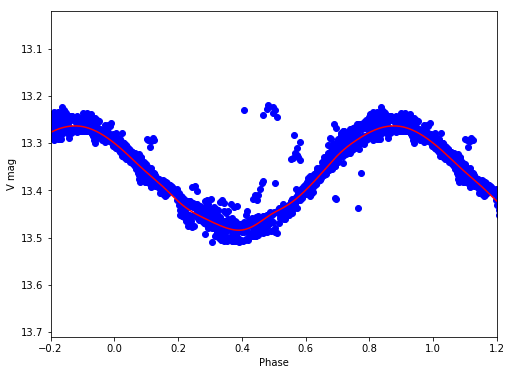

V 13.3719870337 0.220988535202
V38
/Volumes/Annie/CRRP/NGC6121/lcvs/V38.phased


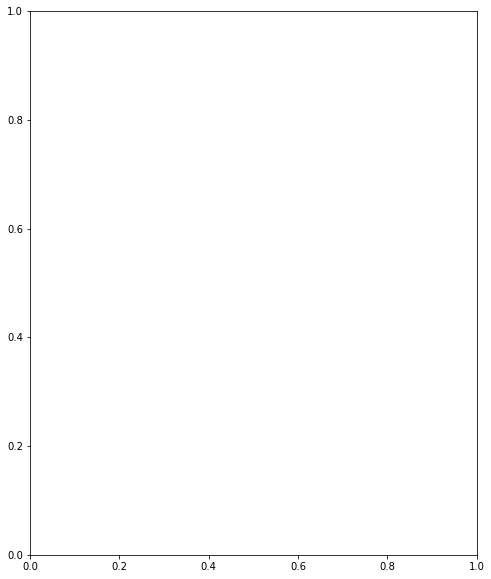

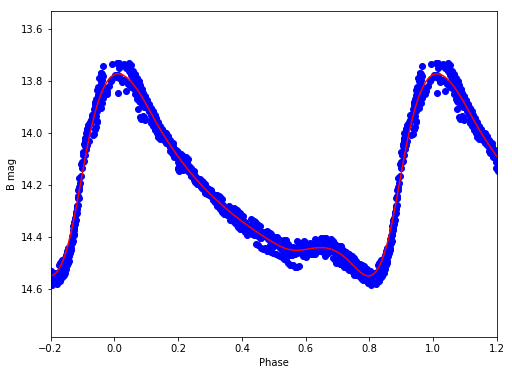

B 14.2077477243 0.775868599092


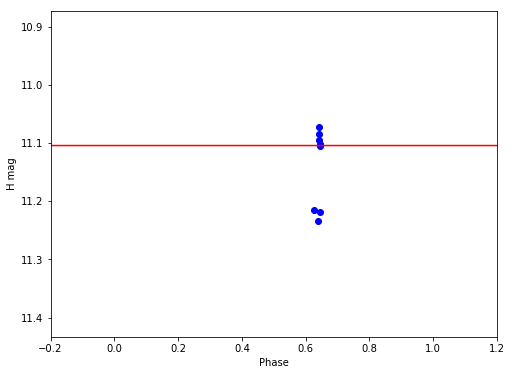

H 11.1040389546 4.3720318601e-06


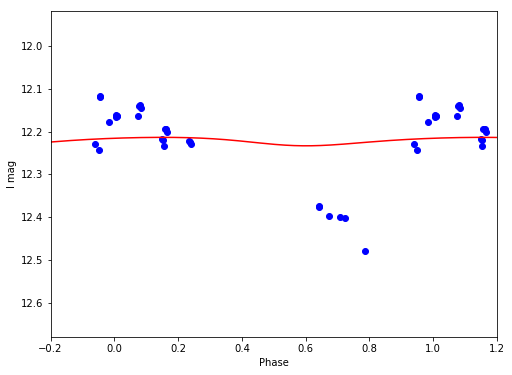

I 12.2220044433 0.0197113905184


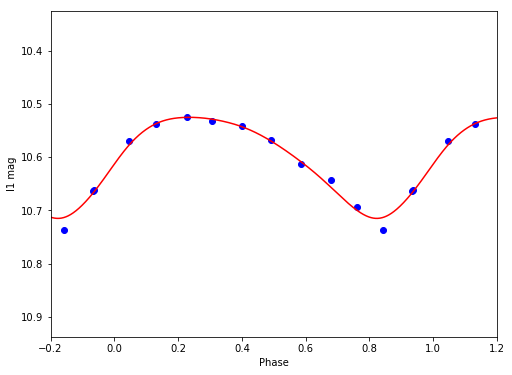

I1 10.5996312479 0.189649435136


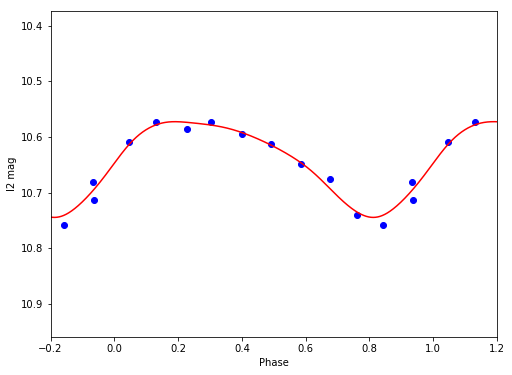

I2 10.6396713001 0.171981659232


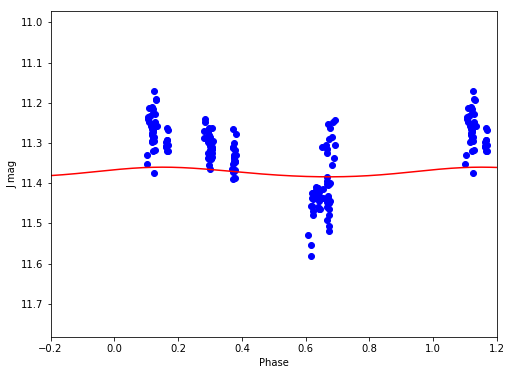

J 11.3729606279 0.0239958132289


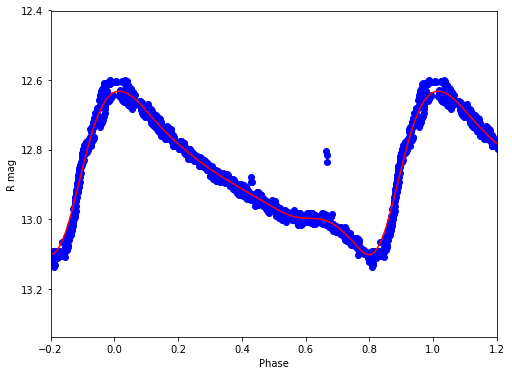

R 12.8725041027 0.469680133355


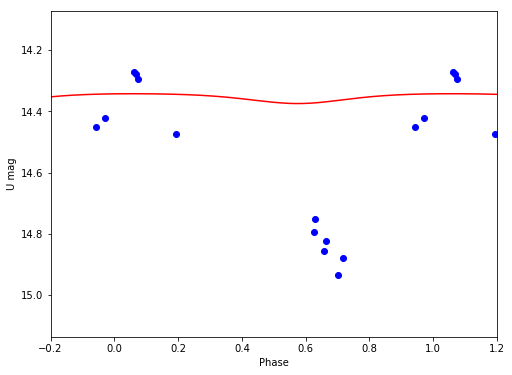

U 14.3540766464 0.0320595755335


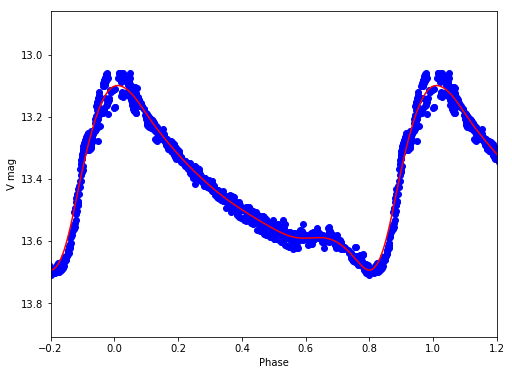

V 13.4197670736 0.593012889687
V39
/Volumes/Annie/CRRP/NGC6121/lcvs/V39.phased


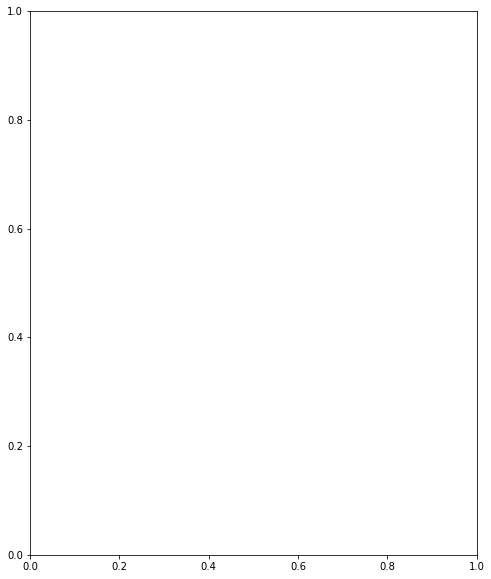

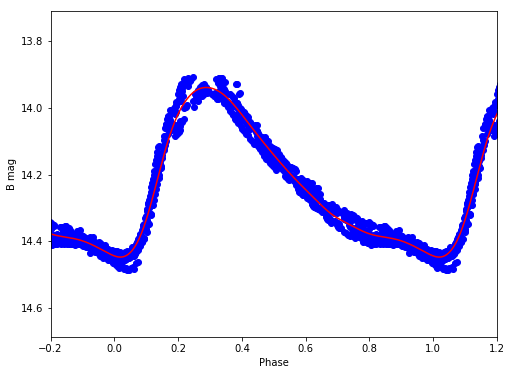

B 14.2110512825 0.508136483603


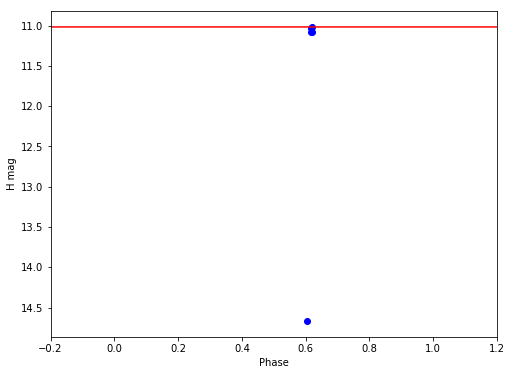

H 11.0163562947 0.000100181211694


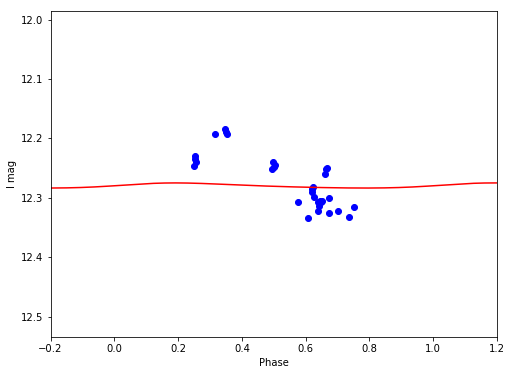

I 12.2798397223 0.00860335075581


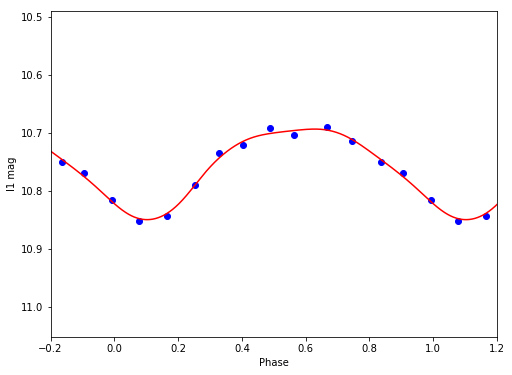

I1 10.7550154969 0.156063705725


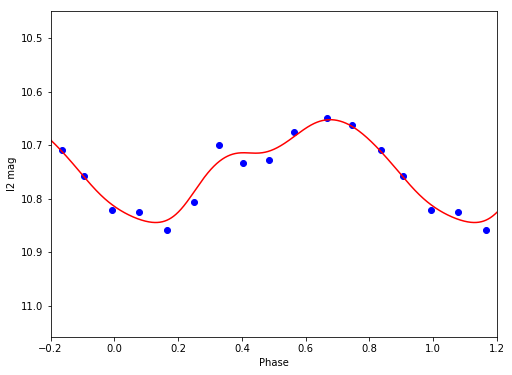

I2 10.7402602596 0.192007780475


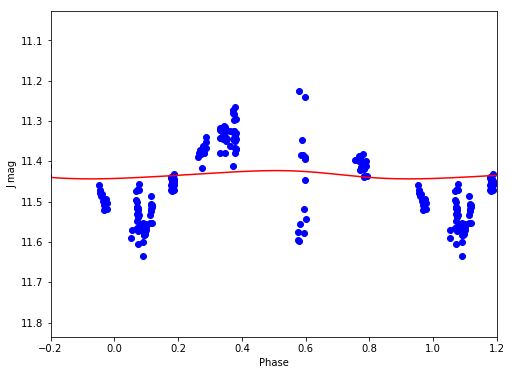

J 11.4332840205 0.0205652415656


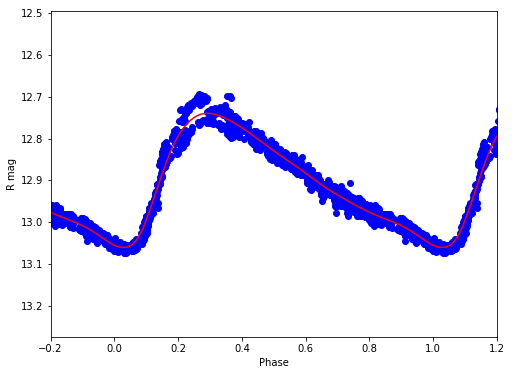

R 12.8938912925 0.320810637272


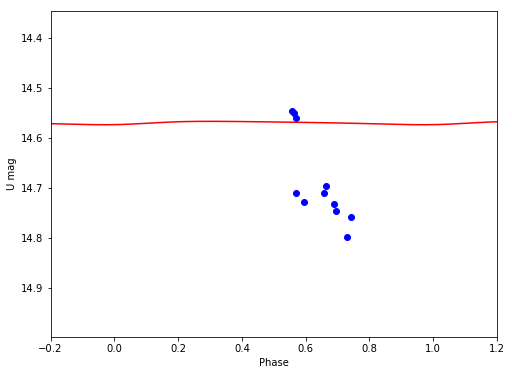

U 14.5692202985 0.00681944562831


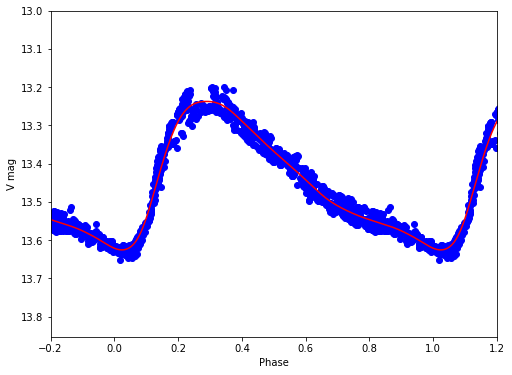

V 13.4343335532 0.388283712876
V40
/Volumes/Annie/CRRP/NGC6121/lcvs/V40.phased


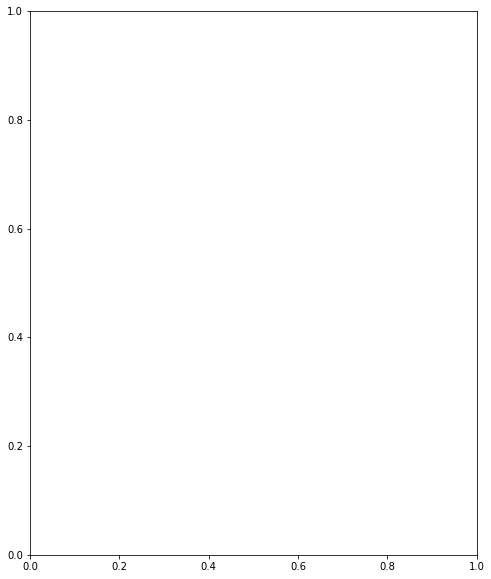

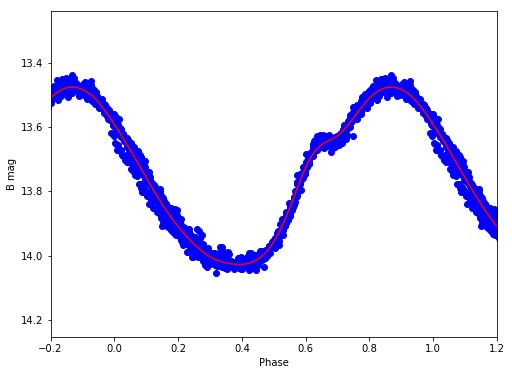

B 13.7414726323 0.552382235541


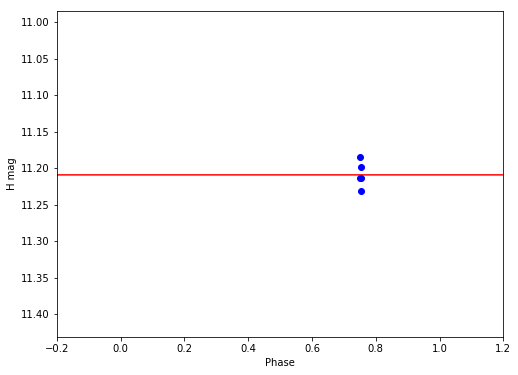

H 11.2090985492 4.97359802267e-05


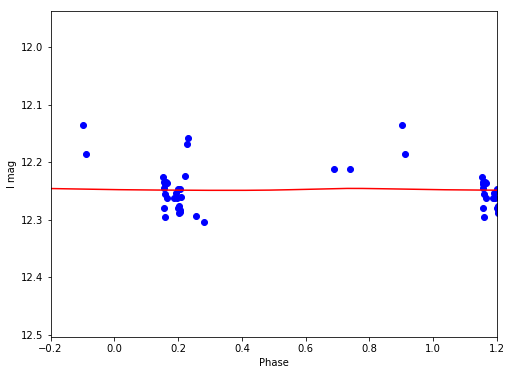

I 12.2476344015 0.00337506040065


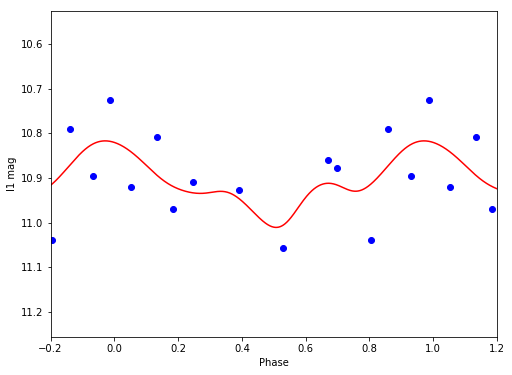

I1 10.9116136301 0.193948497392


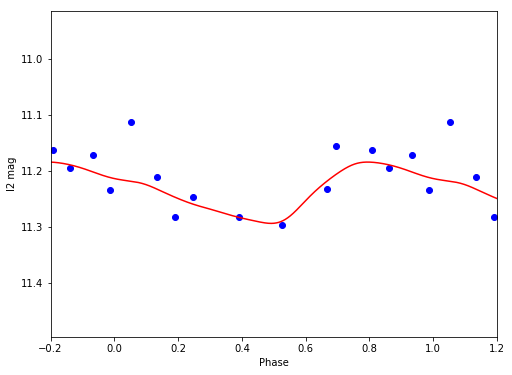

I2 11.2365366296 0.109786223547


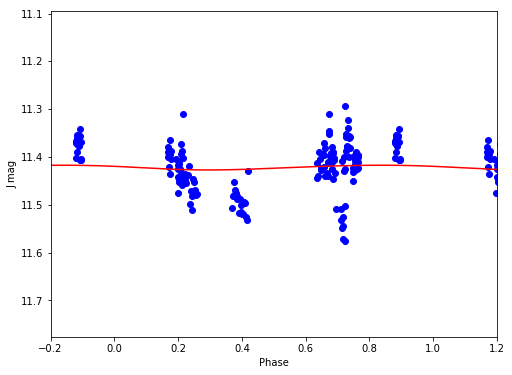

J 11.4219299378 0.00997051531645


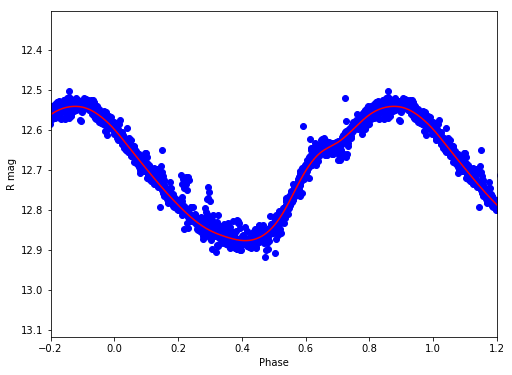

R 12.702163437 0.335078081151


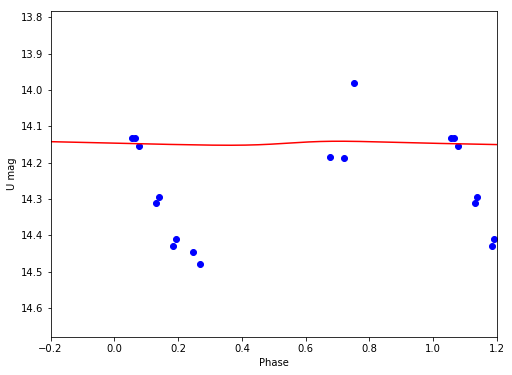

U 14.1470003076 0.0110547003176


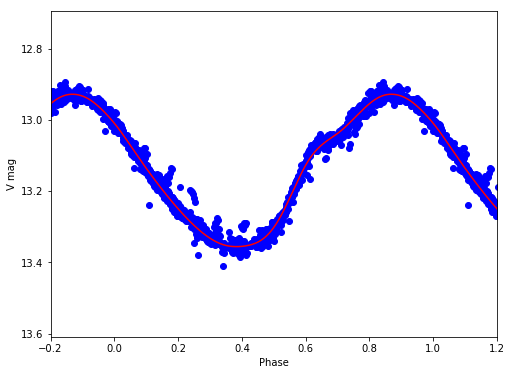

V 13.13270566 0.428424940434
V41
/Volumes/Annie/CRRP/NGC6121/lcvs/V41.phased


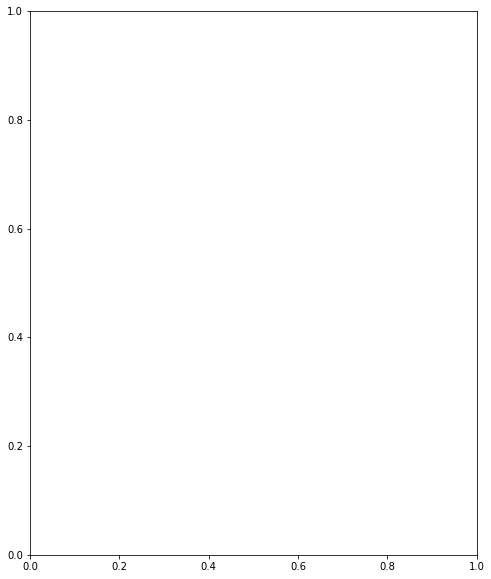

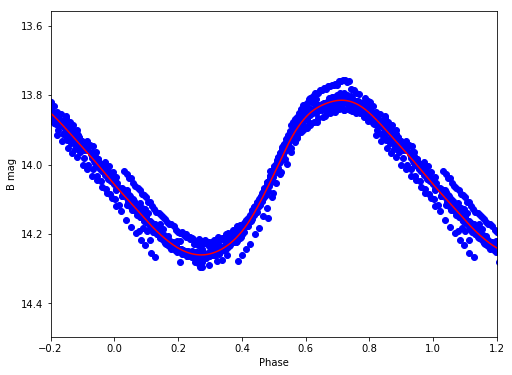

B 14.0297086158 0.445777417526


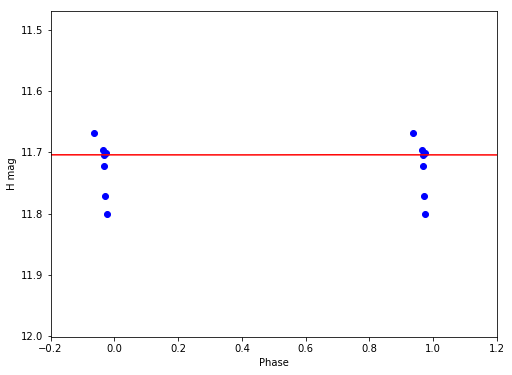

H 11.7042329355 0.000289276183297


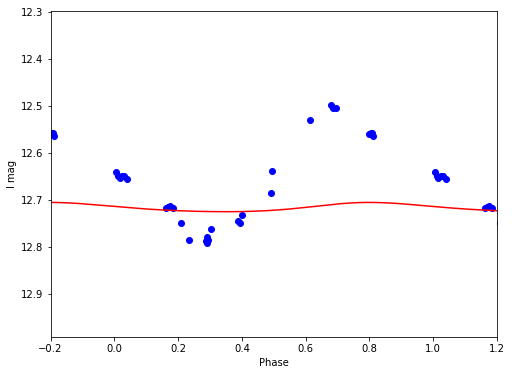

I 12.7160883234 0.0196848190918


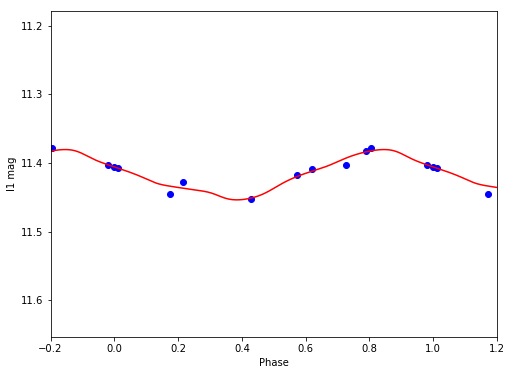

I1 11.4177714214 0.0732721443184


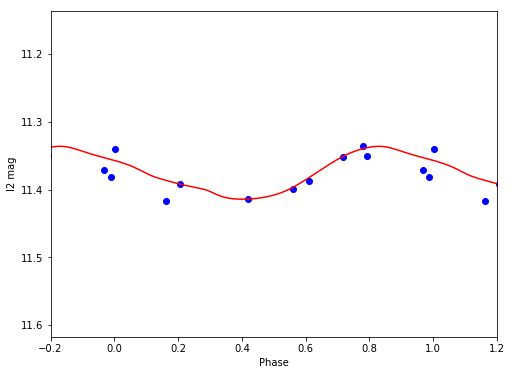

I2 11.3767103091 0.0780123378076


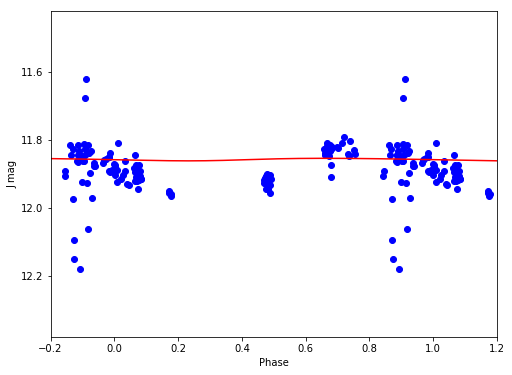

J 11.8565082029 0.0074562782166


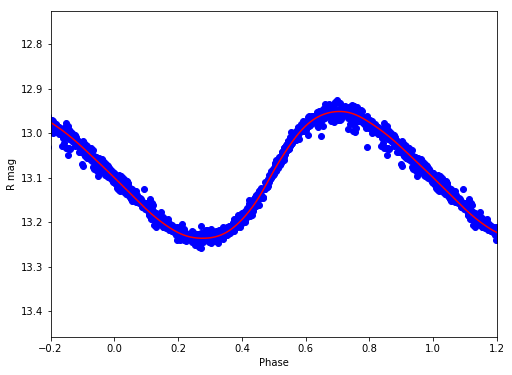

R 13.0902783716 0.285360604984


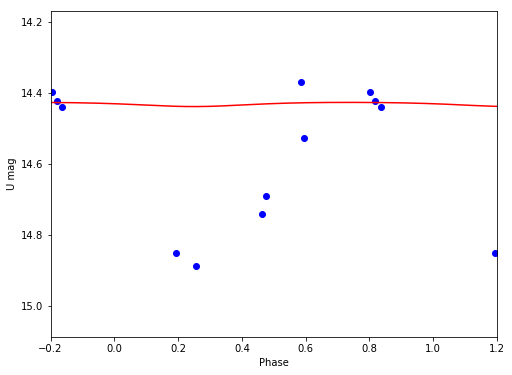

U 14.4321880179 0.0117676122082


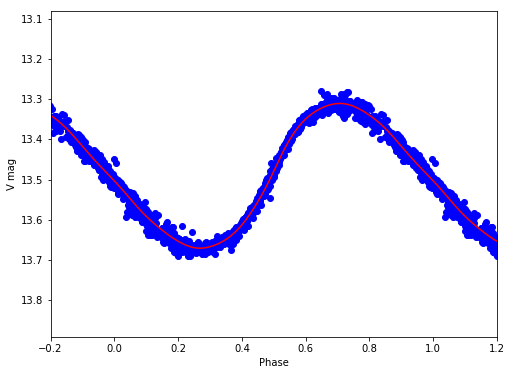

V 13.4848156638 0.359921696808
V42
/Volumes/Annie/CRRP/NGC6121/lcvs/V42.phased


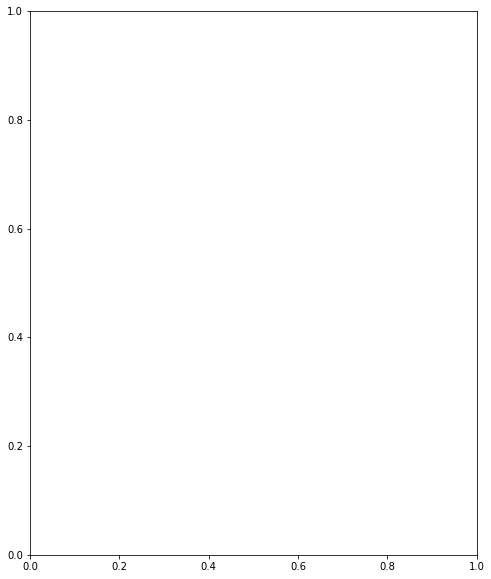

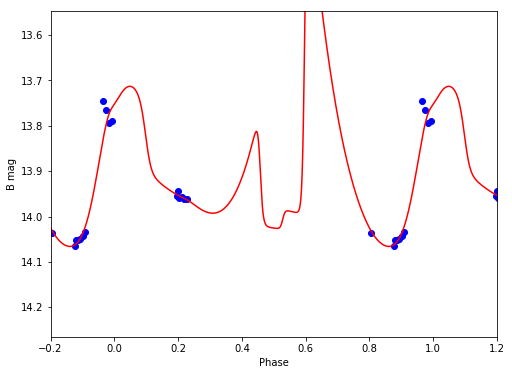

B 13.8755864876 0.768455767294


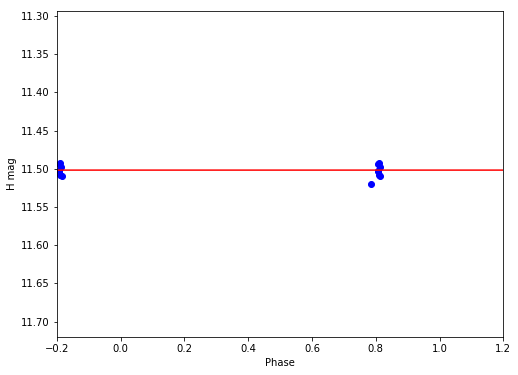

H 11.5017693191 6.19125362711e-06


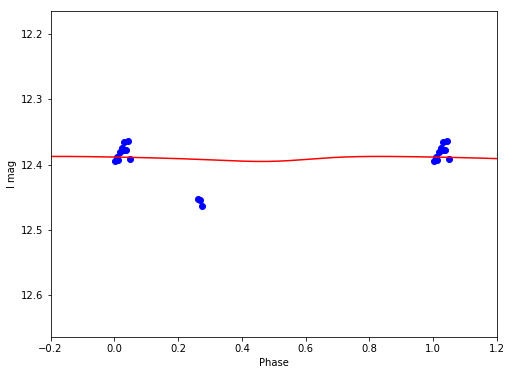

I 12.3907265688 0.00772806709963


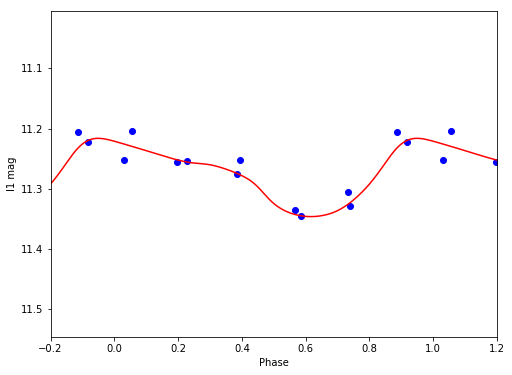

I1 11.2763617431 0.130096511466


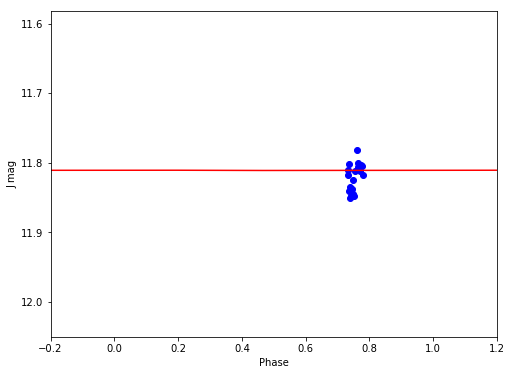

J 11.8106133884 0.000454449385474


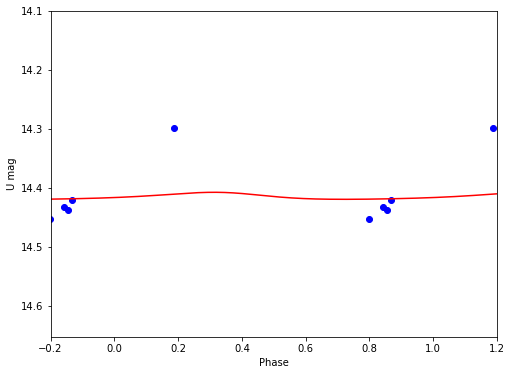

U 14.4147446941 0.0119228564489


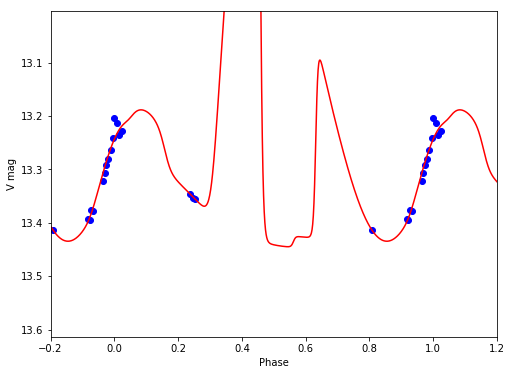

V 13.1545454782 1.56222107437
V43
V49
/Volumes/Annie/CRRP/NGC6121/lcvs/V49.phased


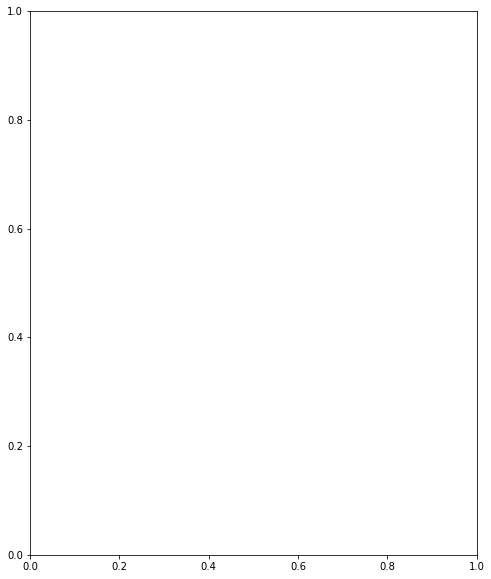

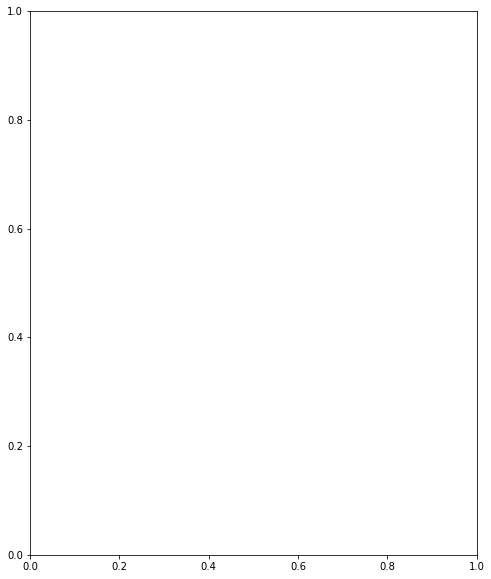

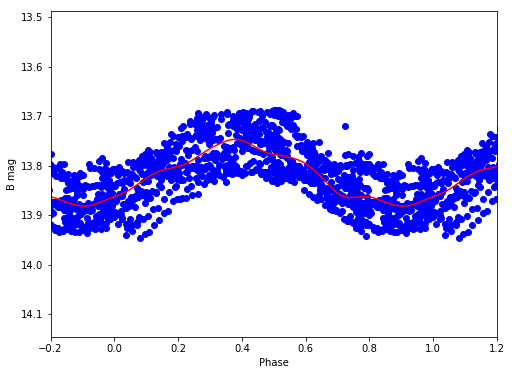

B 13.8172183082 0.134808825452


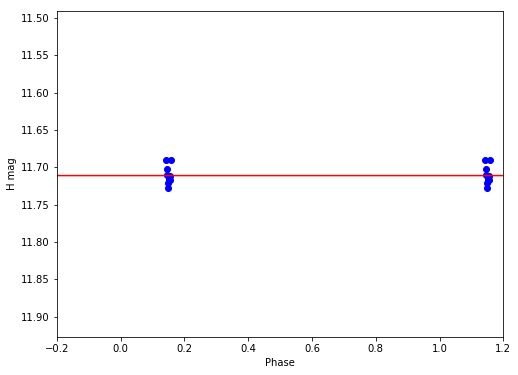

H 11.7109978478 1.0350014767e-05


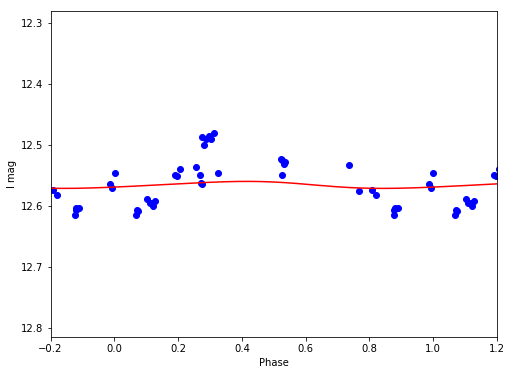

I 12.5659433261 0.0114833074621


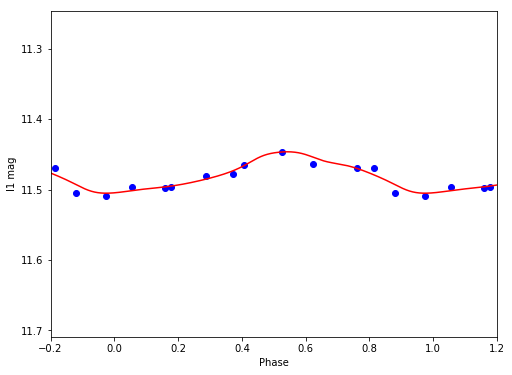

I1 11.4782176152 0.0587717812876


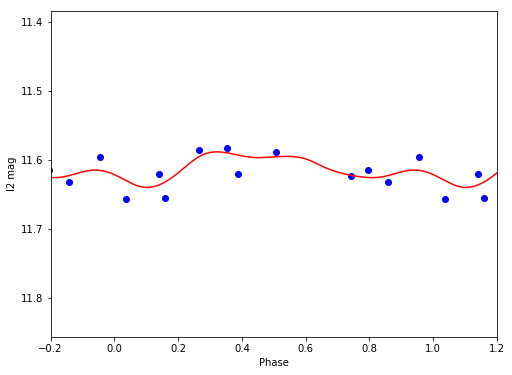

I2 11.6116908162 0.051654347775


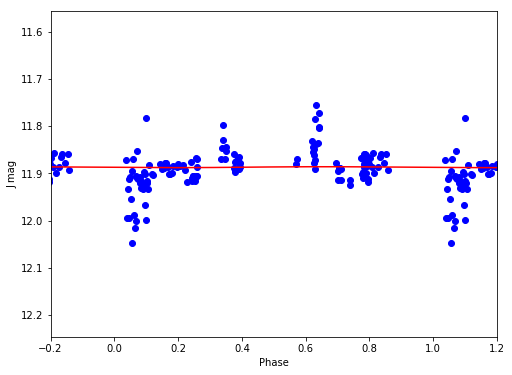

J 11.8866088378 0.00195914097275


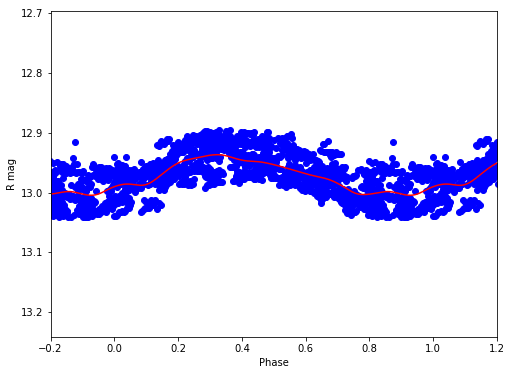

R 12.9719072627 0.067809289119


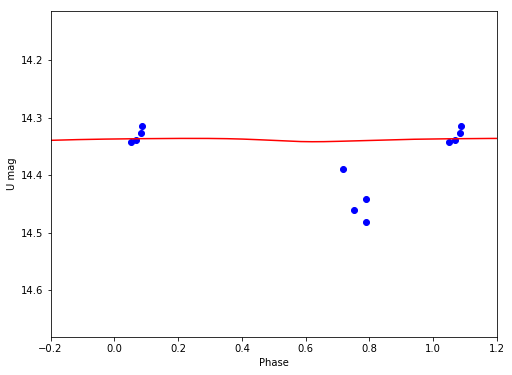

U 14.3383331165 0.00578416246868


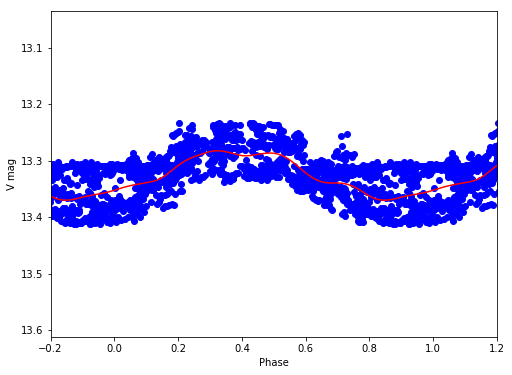

V 13.324542138 0.0875676635126
V52
/Volumes/Annie/CRRP/NGC6121/lcvs/V52.phased


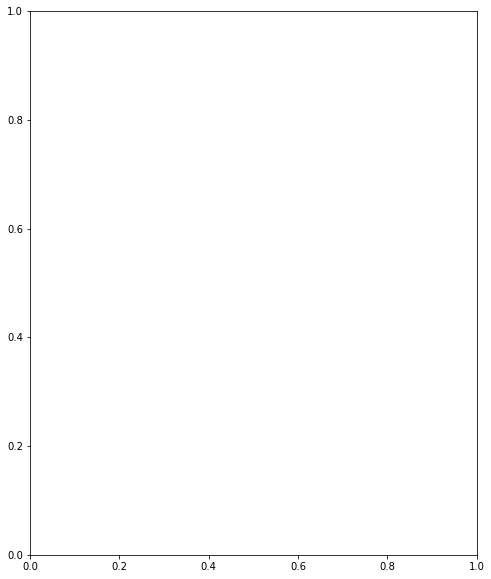

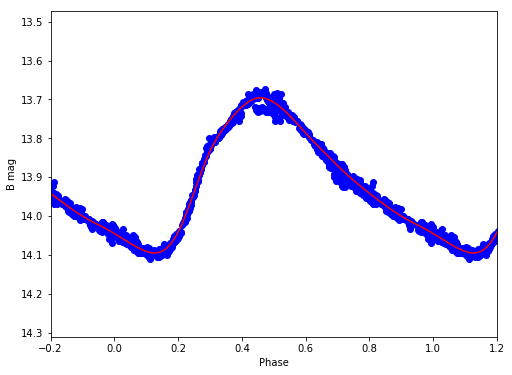

B 13.8947893503 0.39829136461


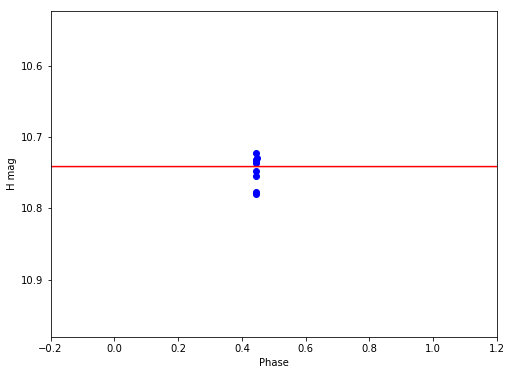

H 10.7415008176 2.02855348377e-05


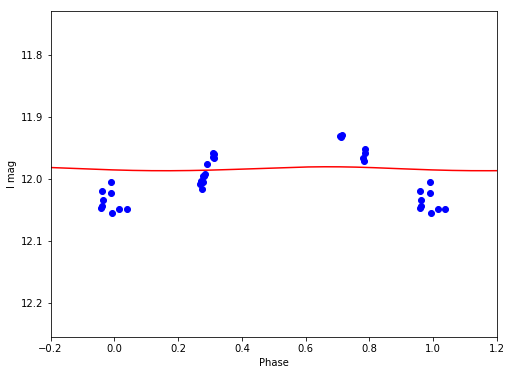

I 11.9836580028 0.00637298371372


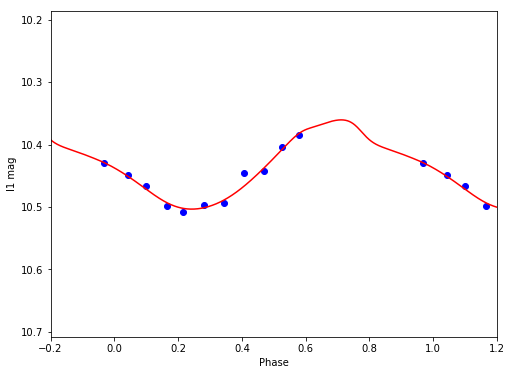

I1 10.4329299286 0.143094625631


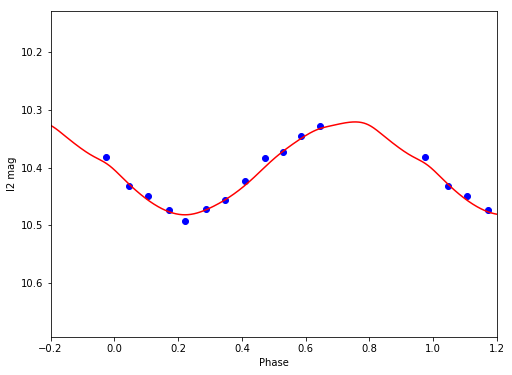

I2 10.3979375996 0.160881348254


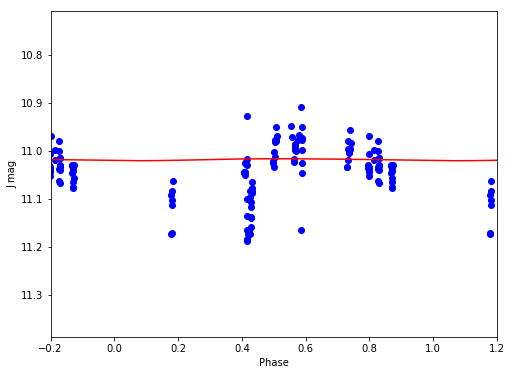

J 11.0177027614 0.00400140777188


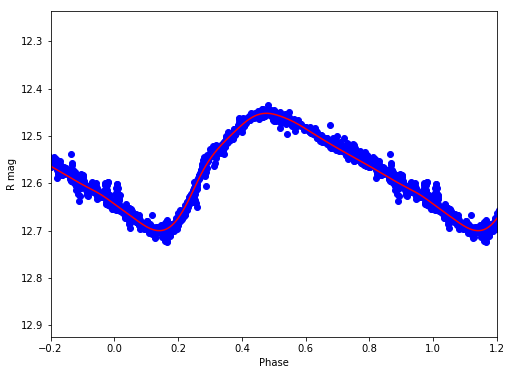

R 12.563301295 0.247958104507


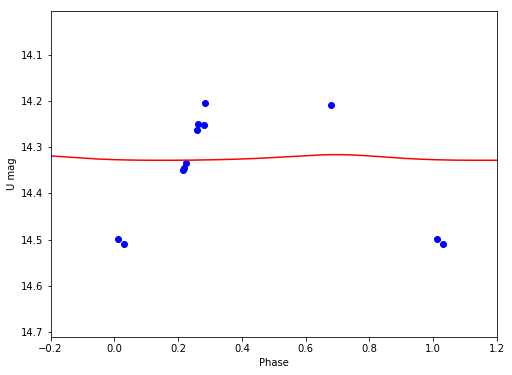

U 14.3236874238 0.012242918732


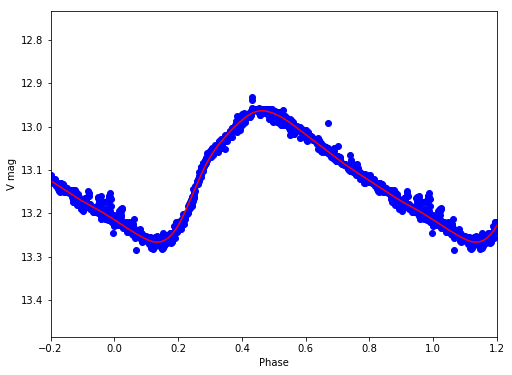

V 13.1069980335 0.303252357852
V61
/Volumes/Annie/CRRP/NGC6121/lcvs/V61.phased


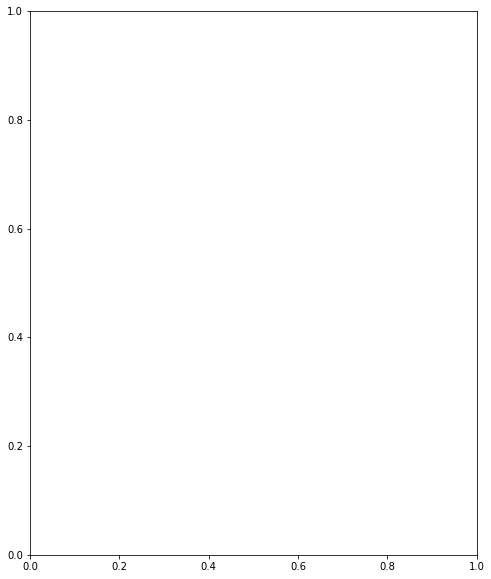

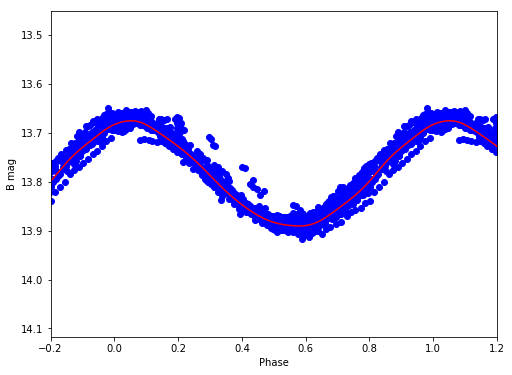

B 13.7858179639 0.215158522023


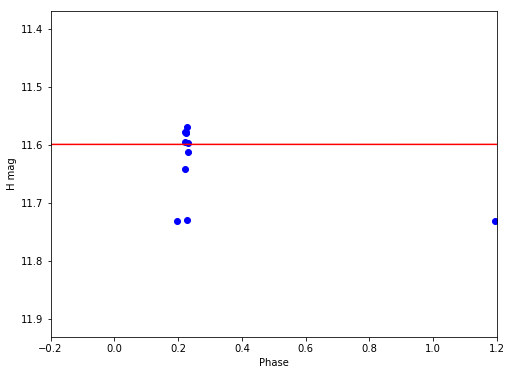

H 11.5988410011 0.000160444118357


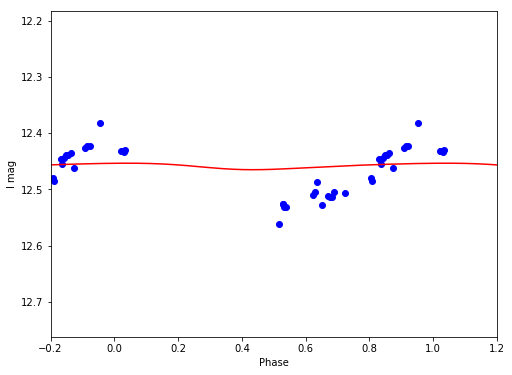

I 12.4584089196 0.0115807425575


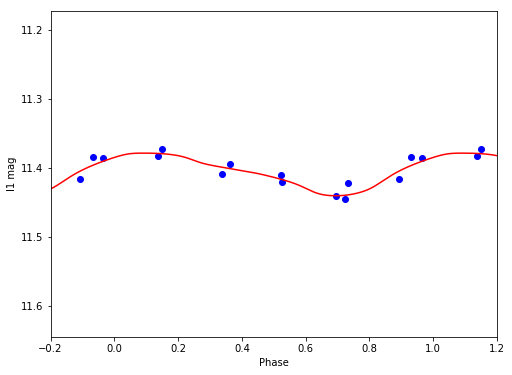

I1 11.4055816766 0.0616804599284


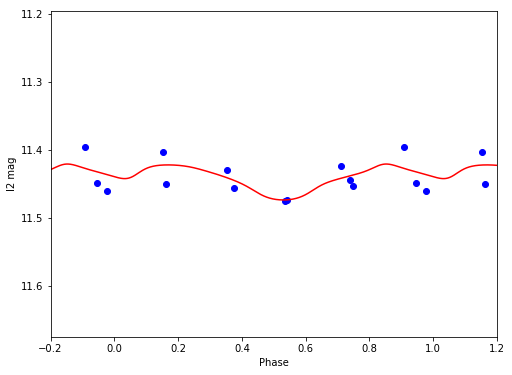

I2 11.4406701593 0.0528833645601


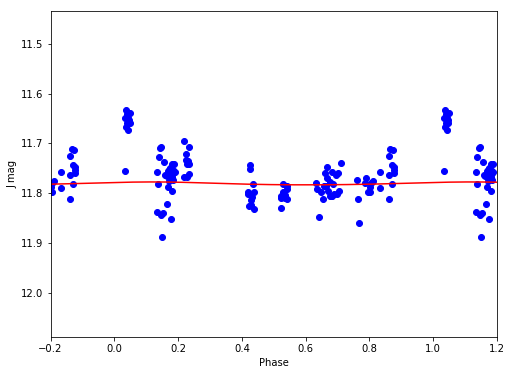

J 11.7807846318 0.00582006007162


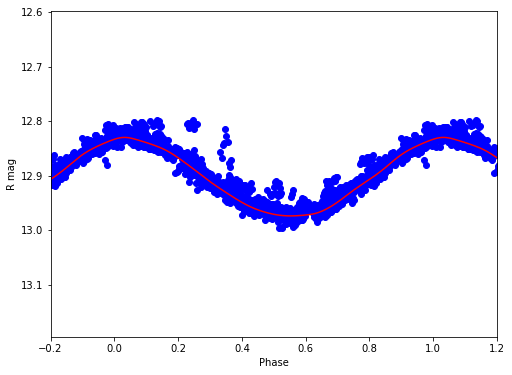

R 12.9048442998 0.144158908085


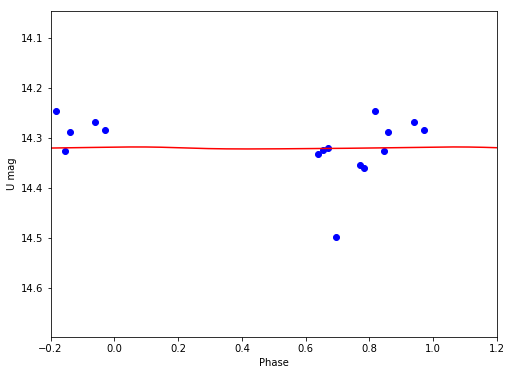

U 14.3201890199 0.00399682267048


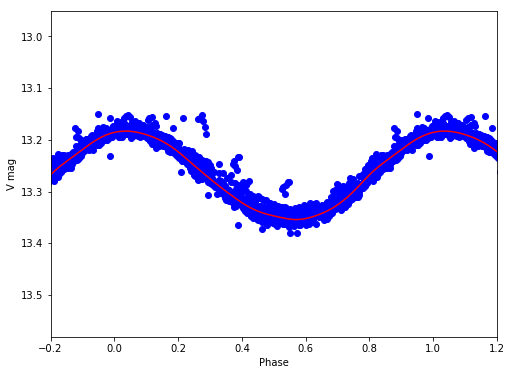

V 13.269013426 0.171129280069
V64
V75
/Volumes/Annie/CRRP/NGC6121/lcvs/V75.phased


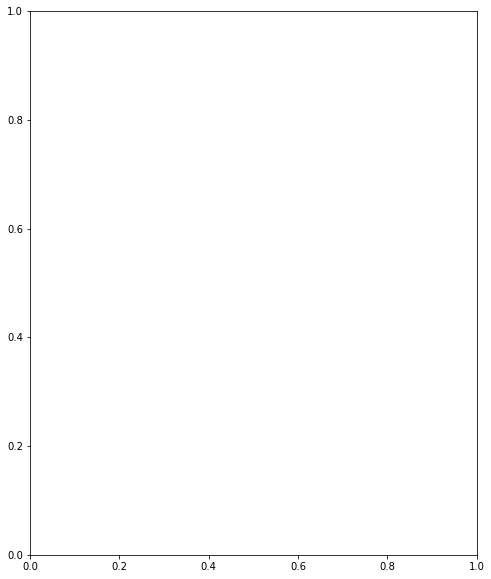

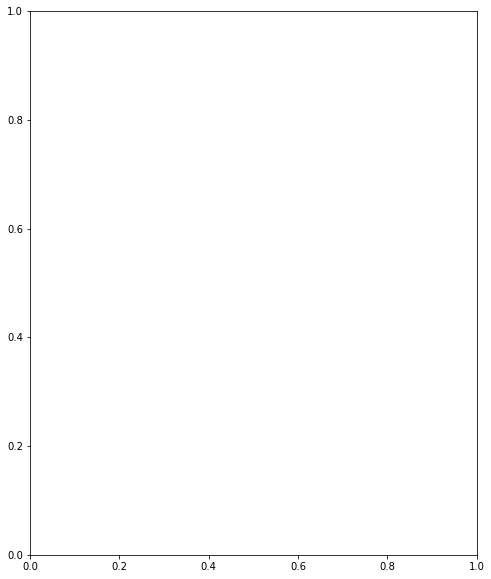

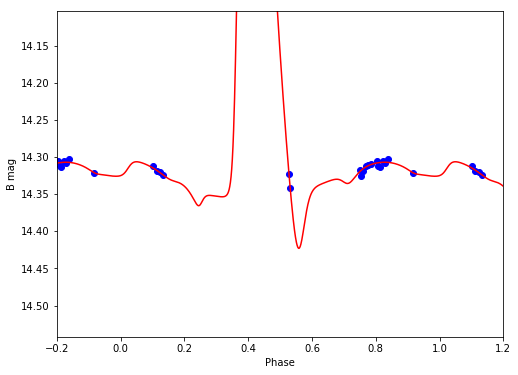

B 14.2664306037 0.554517784722


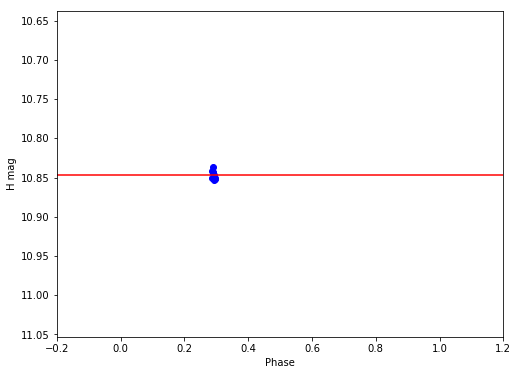

H 10.8466352595 2.94905930485e-05


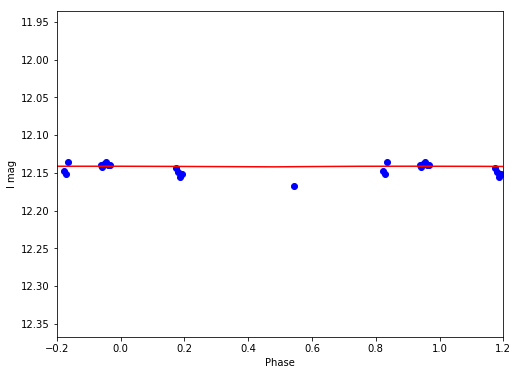

I 12.1413917873 0.000901357582459


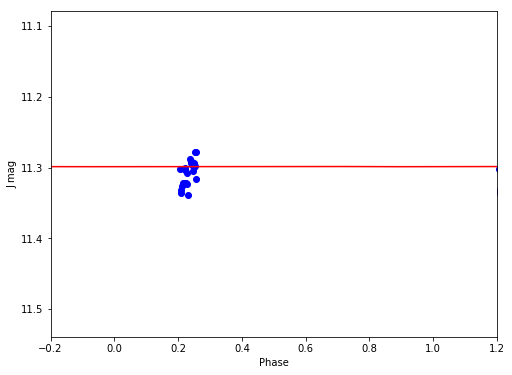

J 11.298365088 0.000390566244972


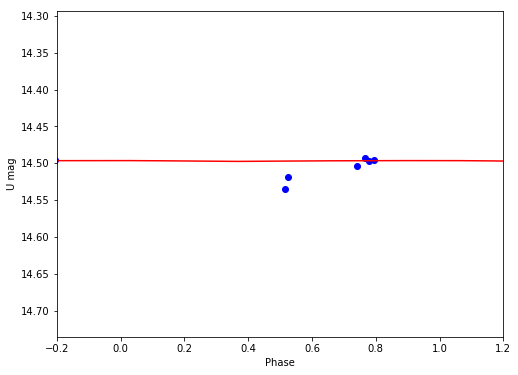

U 14.4966427494 0.00110874661726


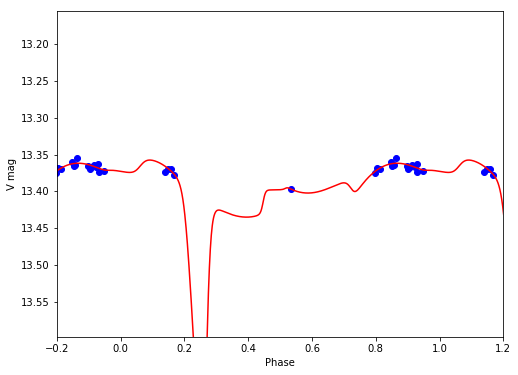

V 13.4060472529 0.402618758372
V76
/Volumes/Annie/CRRP/NGC6121/lcvs/V76.phased


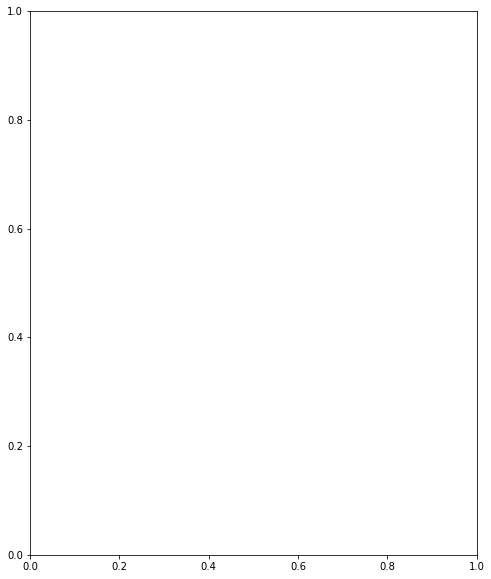

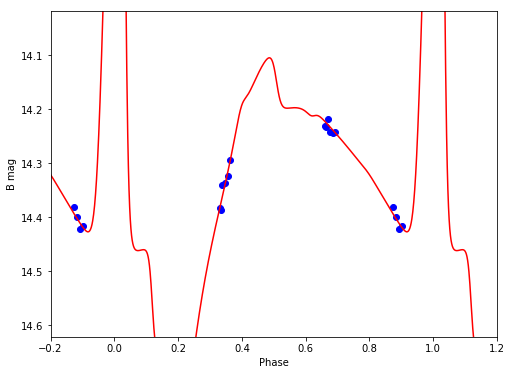

B 14.2233101018 1.90687804458


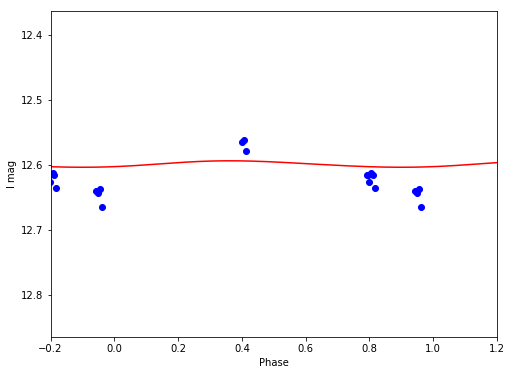

I 12.5986516584 0.00997957663357


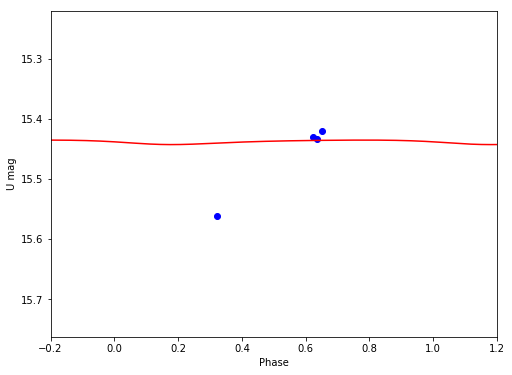

U 15.4379847912 0.00747428318681


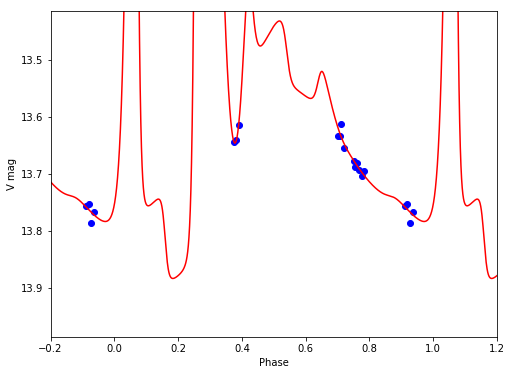

V 13.314020797 2.5623166579
C1
/Volumes/Annie/CRRP/NGC6121/lcvs/C1.phased


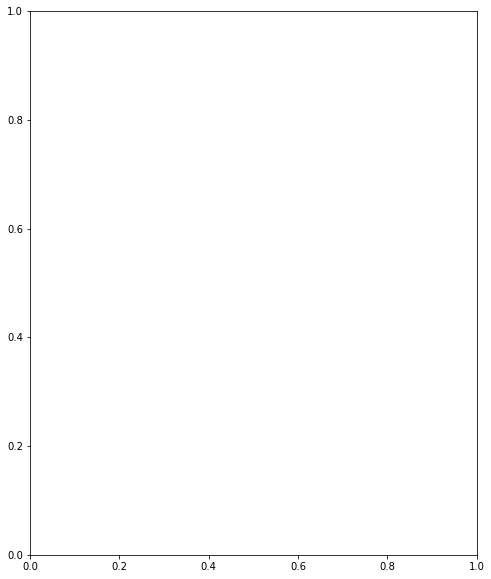

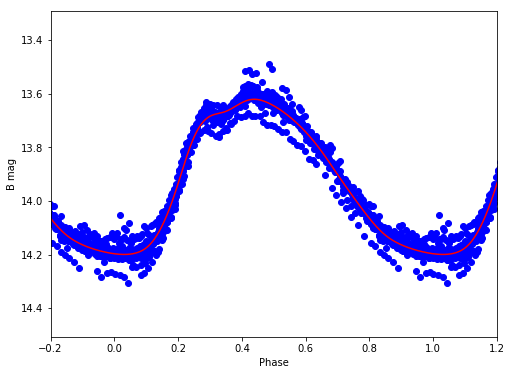

B 13.8921737592 0.579497753395


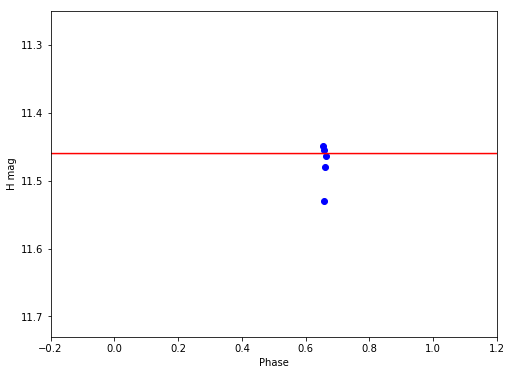

H 11.4597561174 6.84419343404e-05


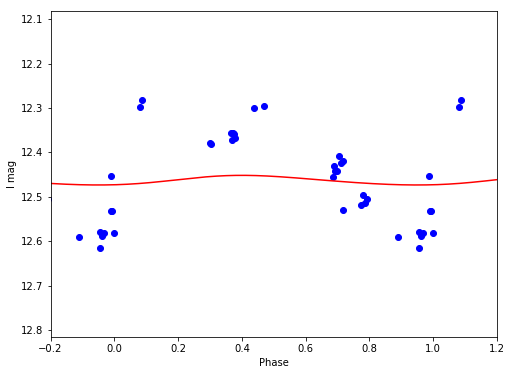

I 12.4629664259 0.0216518816607


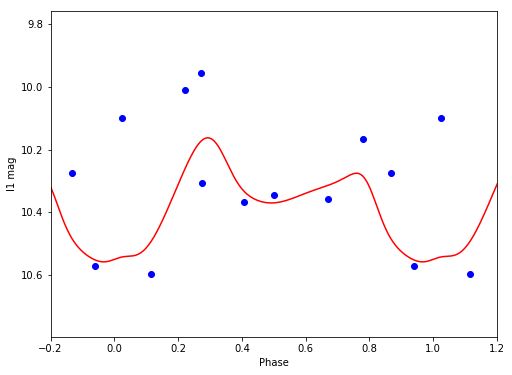

I1 10.3661002597 0.395946480087


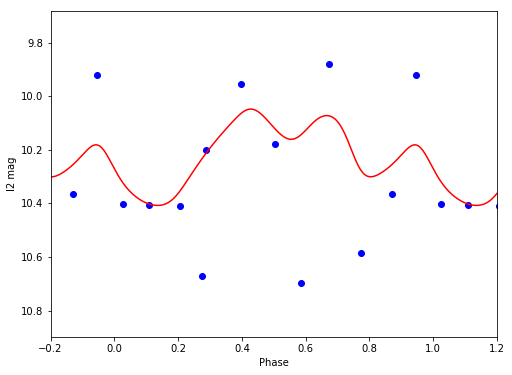

I2 10.2086309489 0.359478650969


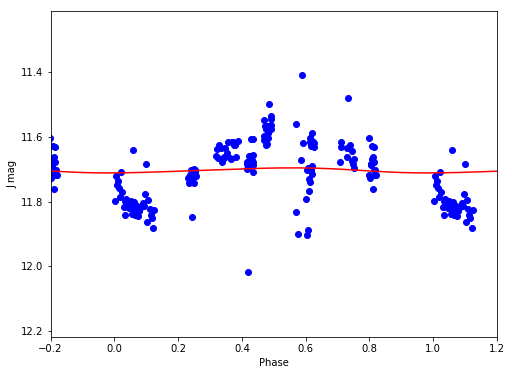

J 11.70362821 0.0156307260574


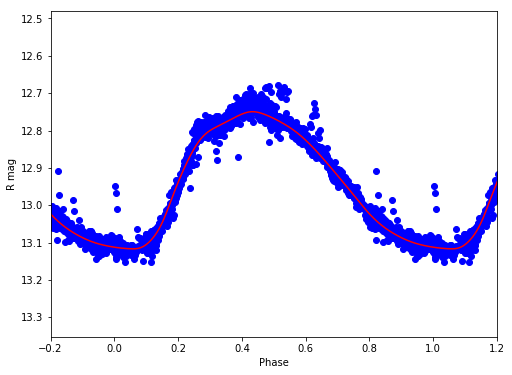

R 12.9253166748 0.367085307705


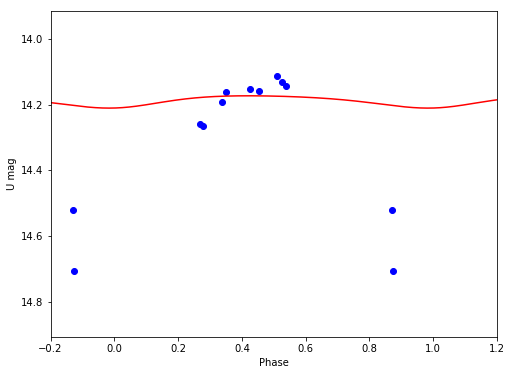

U 14.1881097184 0.0374469018633


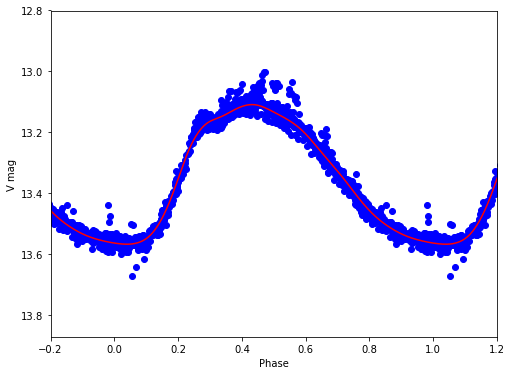

V 13.3274692237 0.458452158286


In [20]:
dtype1 = np.dtype([('id', 'S5'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
sp = np.array([0.9, 0.1, 0.1, 0.1, 0.9, 0.9, 0.9, 0.9, 0.2, 0.2])
f = open(folder+'avg_mags.txt', 'w')
#star = 'V10'

for ind, star in enumerate(data['id']):
    print star
    try:
        r1, r2, r3, r4 = lightcurves.gloess(folder+'lcvs/'+star+'.phased', smoothing_params=sp, plot_save=1, clean=1)
        datasave = np.array(zip(np.repeat(star, len(r1)), r1, np.repeat(data['new_period'][ind], len(r1)), r2, r3, r4), dtype=[('c1', 'S5'), ('c2', 'S2'), ('c3', float), ('c4', float), ('c5', float), ('c6', float)])
        np.savetxt(f, datasave, fmt='%5s %2s %10.8f %6.3f %4.2f %4.2f')
    except:
        continue
f.close()

/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in divide


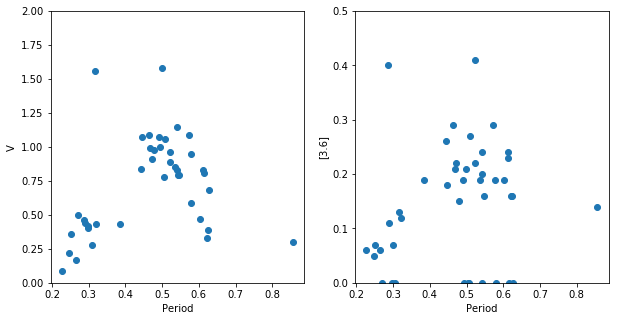

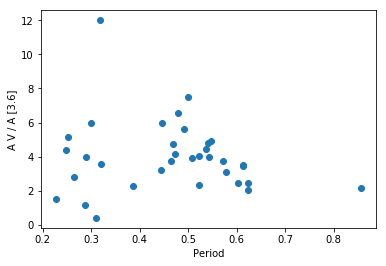

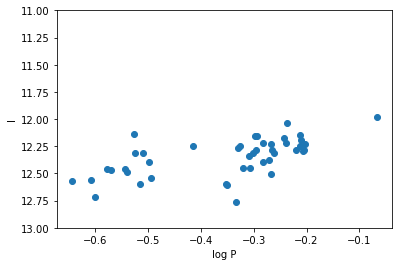

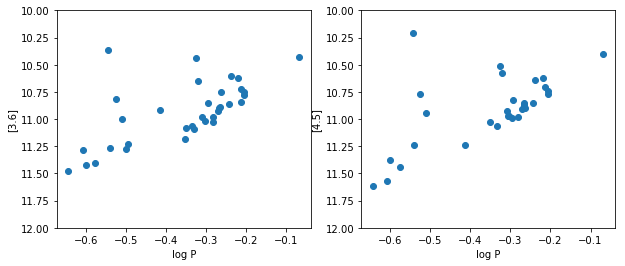

In [26]:
dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags.txt', dtype=dtype, usecols=(0,1,2,3,4))

per = data['period'][data['filt'] == 'V']
Vamp = data['amp'][data['filt'] == 'V']
I1amp = data['amp'][data['filt'] == 'I1']

# Bailey diagram
x = data['period'][data['filt'] == 'V']
y = data['amp'][data['filt'] == 'V']
fig = mp.figure(figsize=(10,5))
ax = fig.add_subplot(121)
ax.plot(per, Vamp, 'o')
ax.set_ylim((0,2))
ax.set_xlabel('Period')
ax.set_ylabel('V')
ax2 = fig.add_subplot(122)
ax2.plot(per, I1amp, 'o')
ax2.set_ylim((0,0.5))
ax2.set_xlabel('Period')
ax2.set_ylabel('[3.6]')


# amplitude ratio 

R_amp = Vamp/I1amp
fig3 = mp.figure()
ax4 = fig3.add_subplot(111)
ax4.plot(per, R_amp, 'o')
ax4.set_xlabel('Period')
ax4.set_ylabel('A V / A [3.6]')

# I band PL relation
fig5 = mp.figure()
ax5 = fig5.add_subplot(111)
Iper = data['period'][data['filt'] == 'I']
Imag = data['avg'][data['filt'] == 'I']
ax5.plot(np.log10(Iper), Imag, 'o')
ax5.set_ylim((13,11))
ax5.set_xlabel('log P')
ax5.set_ylabel('I')

# IRAC PL relation
fig2 = mp.figure(figsize=(10,4))
ax1 = fig2.add_subplot(121)
ax2 = fig2.add_subplot(122)
x2 = data['period'][data['filt'] == 'I1']
y2 = data['avg'][data['filt'] == 'I1']
x3 = data['period'][data['filt'] == 'I2']
y3 = data['avg'][data['filt'] == 'I2']
ax1.plot(np.log10(x2), y2, 'o')
ax1.set_ylim((12,10))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')
ax2.plot(np.log10(x3), y3, 'o')
ax2.set_ylim((12,10))
ax2.set_xlabel('log P')
ax2.set_ylabel('[4.5]')

[]


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in less
  # Remove the CWD from sys.path while we load stuff.
/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in less
  # This is added back by InteractiveShellApp.init_path()


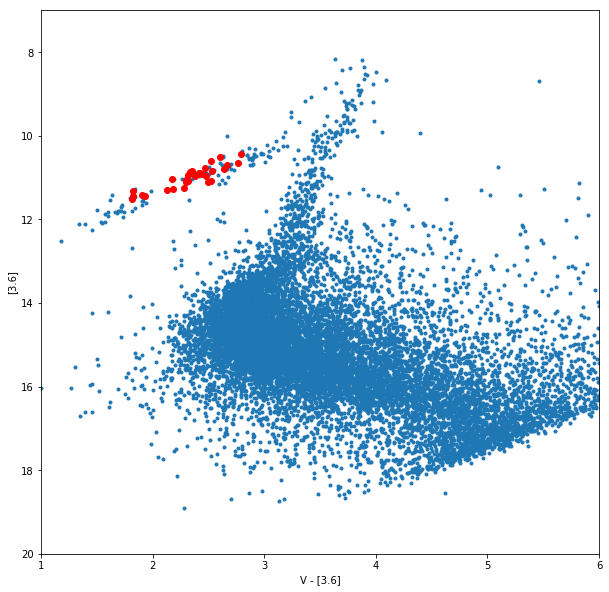

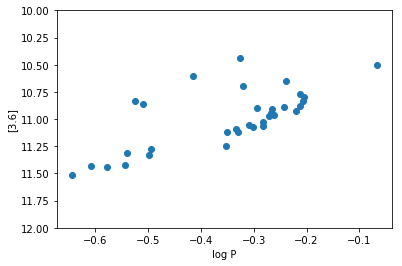

In [9]:
center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
# change to read merged catalog
catalog_data, dist = analysis_routines.read_merged_catalog(folder, center_ra, center_dec)

thres = 500
color = catalog_data['V'][dist < thres] - catalog_data['3.6'][dist < thres]
mag = catalog_data['3.6'][dist < thres]
err = catalog_data['3.6er'][dist < thres]

good_mag = mag[err < 0.02]
good_color = color[err < 0.02]

fig2 = mp.figure(figsize=(10,10))
ax2 = fig2.add_subplot(111)
ax2.plot(good_color, good_mag, '.')
ax2.set_ylim((20,7))
ax2.set_xlim((1,6))
ax2.set_xlabel('V - [3.6]')
ax2.set_ylabel('[3.6]')

dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags_test.txt', dtype=dtype, usecols=(0,1,2,3,4))

var_color = data['avg'][data['filt'] == 'V'] - data['avg'][data['filt'] == 'I1']
var_mag = data['avg'][data['filt'] == 'I1']
var_id = data['star'][data['filt'] == 'I1']
var_period = data['period'][data['filt'] == 'I1']

bad_id = np.array([])
bad_color = np.array([])
bad_mag = np.array([])
bad_per = np.array([])
for ind, star in enumerate(var_id):
    if var_color[ind] >= 3.0 and var_mag[ind] > 1 : 
        bad_id = np.append(bad_id, star)
        bad_color = np.append(bad_color, var_color[ind])
        bad_mag = np.append(bad_mag, var_mag[ind])
        bad_per = np.append(bad_per, var_period[ind])
        
print bad_id
ax2.plot(var_color, var_mag, 'o', color='r')
ax2.plot(bad_color, bad_mag, 'x', color='k')

fig3 = mp.figure()
ax3 = fig3.add_subplot(111)
ax3.plot(np.log10(var_period), var_mag, 'o')
ax3.plot(np.log10(bad_per), bad_mag, 'x', color='k')
ax3.set_ylim((12,10))
ax3.set_xlabel('log P')
ax3.set_ylabel('[3.6]')

